In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Load libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import ast
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, f1_score, accuracy_score
import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, LSTM, GRU, Bidirectional, Dense, TimeDistributed, Dropout, Masking
from tensorflow.keras.optimizers import Adam

# Load datasets
train_df = pd.read_csv('/content/drive/MyDrive/Untitled Folder/Dataset_B_POS_train.csv')
test_df = pd.read_csv('/content/drive/MyDrive/Untitled Folder/Dataset_B_POS_test.csv')


train_df.head()

,Sentence #,Sentence,POS
0,1,Yemen 's official news agency reports Sunday t...,"['NNP', 'POS', 'JJ', 'NN', 'NN', 'VBZ', 'NNP',..."
1,2,"In other news , a suicide bomb attack in north...","['IN', 'JJ', 'NN', ',', 'DT', 'NN', 'NN', 'NN'..."
2,3,A Lion had come to the end of his days and lay...,"['DT', 'NN', 'VBD', 'VBN', 'TO', 'DT', 'NN', '..."
3,4,The case involves the leak of the identity of ...,"['DT', 'NN', 'VBZ', 'DT', 'NN', 'IN', 'DT', 'N..."
4,5,The statement quoted Mr. Yushchenko as telling...,"['DT', 'NN', 'VBD', 'NNP', 'NNP', 'IN', 'VBG',..."


## Exploratory Data Analysis
- Check dataset shape, columns, and sample rows
- Analyze sentence lengths and POS tag distributions

Train shape: (19184, 3)
Test shape: (4796, 3)
Index(['Sentence #', 'Sentence', 'POS'], dtype='object')
Sentence #                                                    1
Sentence      Yemen 's official news agency reports Sunday t...
POS           ['NNP', 'POS', 'JJ', 'NN', 'NN', 'VBZ', 'NNP',...
Name: 0, dtype: object


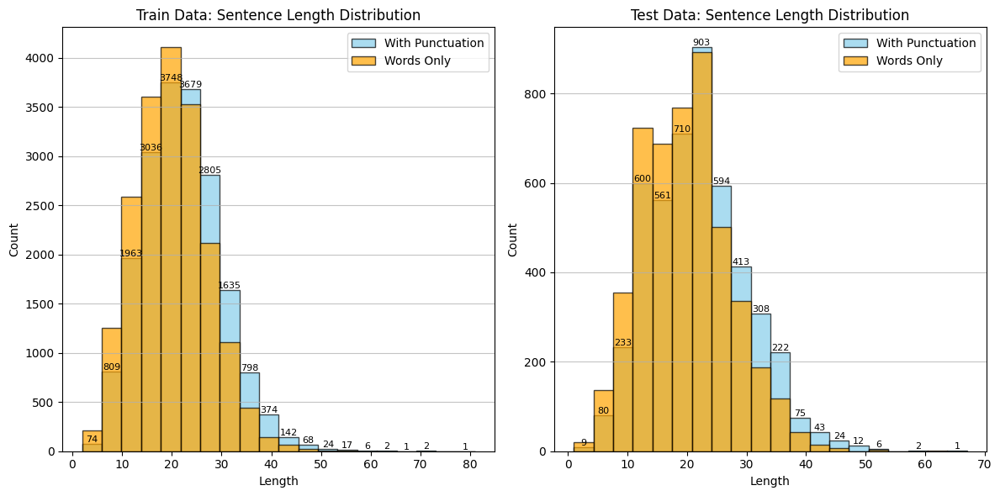

--- TRAIN DATA STATISTICS ---
Total sentences: 19184
Average sentence length (with punctuation): 21.86
Average sentence length (words only): 19.68
Min sentence length (with punctuation): 2
Min sentence length (words only): 1
Max sentence length (with punctuation): 81
Max sentence length (words only): 72
  Sentence 1241: 30 tokens, 29 tags

--- TEST DATA STATISTICS ---
Total sentences: 4796
Average sentence length (with punctuation): 21.89
Average sentence length (words only): 19.71
Min sentence length (with punctuation): 1
Min sentence length (words only): 0
Max sentence length (with punctuation): 67
Max sentence length (words only): 62

--- LONGEST SENTENCE IN TRAIN DATA ---
Length: 81 tokens (72 words)
Sentence: On his departure the Farmer grievously lamented the destruction of his sheep and oxen , but his wife , who had been a spectator to all that took place , said , " On my word , you are rightly served , for how could you for a moment think of shutting up a Lion along with you in

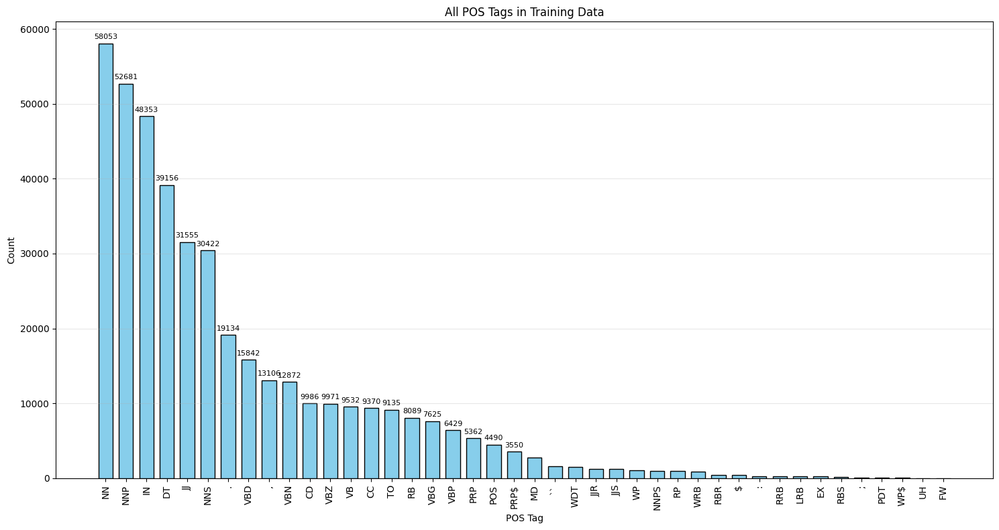

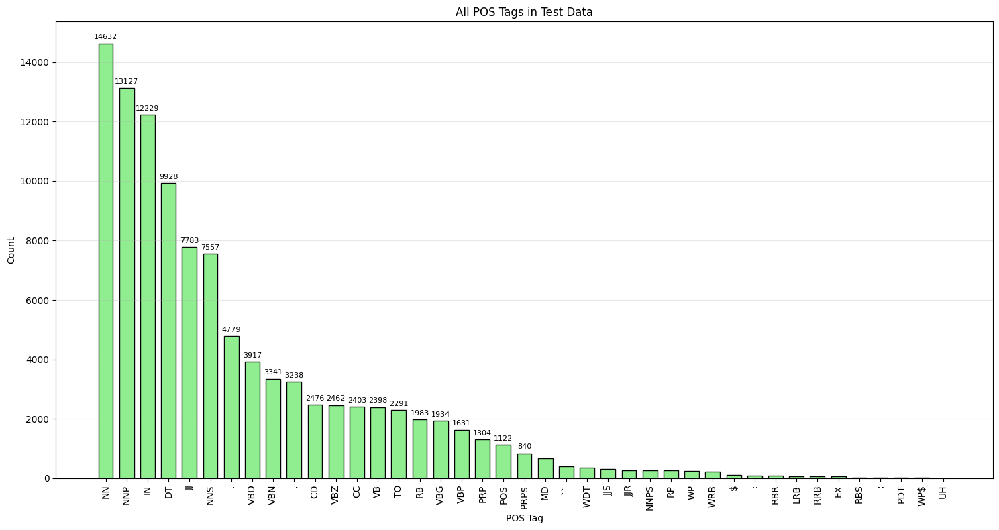

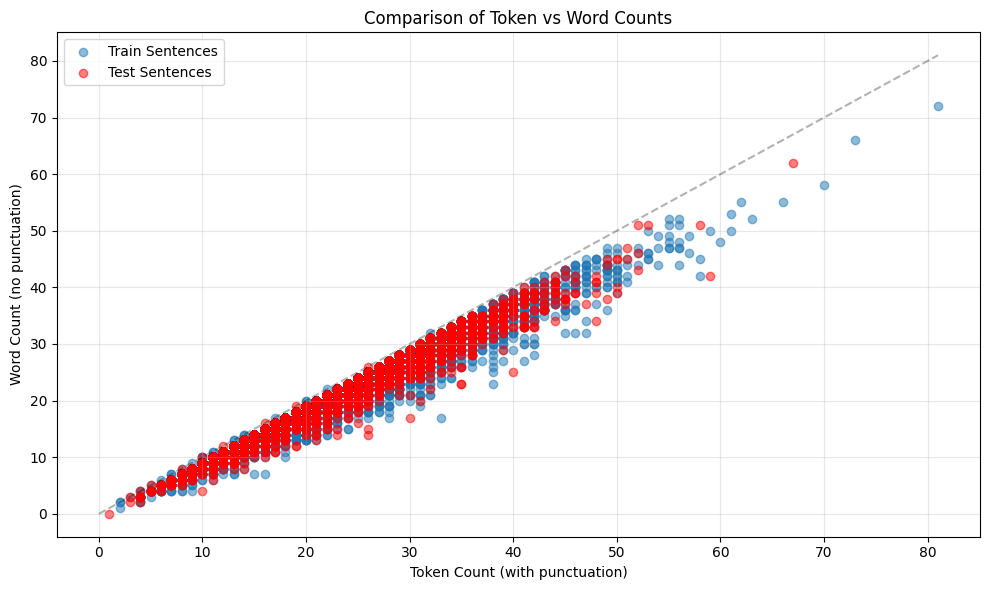

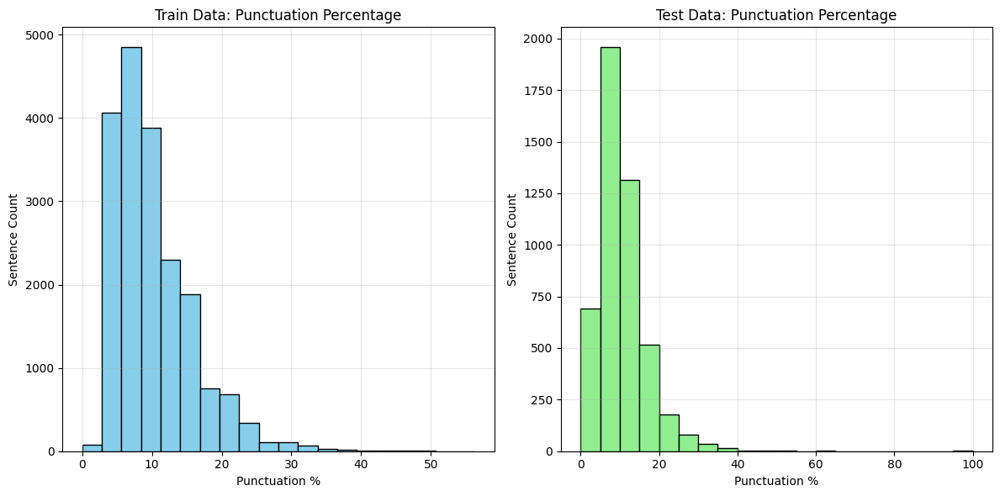


--- PUNCTUATION STATISTICS ---
Average punctuation percentage in train data: 10.23%
Average punctuation percentage in test data: 10.27%


In [ ]:
# Inspect data
print('Train shape:', train_df.shape)
print('Test shape:', test_df.shape)
print(train_df.columns)
print(train_df.iloc[0])

# Parse sentences and tags with proper handling of punctuation
import re
import ast
import matplotlib.pyplot as plt

def parse_row(row):
    # Get original sentence and tags
    original_words = row['Sentence'].split()
    tags = ast.literal_eval(row['POS'])

    # For analysis purposes, we'll separate words and punctuation
    # But we'll keep the original mapping to tags
    return original_words, tags

# Enhanced tokenize function to separate punctuation for analysis
def tokenize_for_analysis(sentence_list):
    """Separates punctuation from words, but only for analysis purposes"""
    word_only_counts = []
    for sentence in sentence_list:
        # Count only alphabetic words (no punctuation-only tokens)
        word_count = sum(1 for word in sentence if re.search('[a-zA-Z]', word))
        word_only_counts.append(word_count)
    return word_only_counts

train_sentences = []
train_tags = []
for _, row in train_df.iterrows():
    words, tags = parse_row(row)
    train_sentences.append(words)
    train_tags.append(tags)

test_sentences = []
test_tags = []
for _, row in test_df.iterrows():
    words, tags = parse_row(row)
    test_sentences.append(words)
    test_tags.append(tags)

# Get counts with and without punctuation
train_sent_lens = [len(s) for s in train_sentences]
train_word_only_lens = tokenize_for_analysis(train_sentences)

test_sent_lens = [len(s) for s in test_sentences]
test_word_only_lens = tokenize_for_analysis(test_sentences)

# Sentence length distribution for train data - FIXED
plt.figure(figsize=(12, 6))

# Create a side-by-side bar plot for with/without punctuation
plt.subplot(1, 2, 1)
counts, bins, _ = plt.hist(train_sent_lens, bins=20, edgecolor='black', color='skyblue', density=False, alpha=0.7, label='With Punctuation')
plt.hist(train_word_only_lens, bins=bins, edgecolor='black', color='orange', density=False, alpha=0.7, label='Words Only')

# Add count labels to the with-punctuation bars
for i in range(len(counts)):
    if counts[i] > 0:
        plt.text(bins[i] + (bins[i+1]-bins[i])/2, counts[i],
                 str(int(counts[i])), ha='center', va='bottom', fontsize=8)

plt.title('Train Data: Sentence Length Distribution')
plt.xlabel('Length')
plt.ylabel('Count')
plt.grid(axis='y', alpha=0.75)
plt.legend()

# Sentence length distribution for test data
plt.subplot(1, 2, 2)
counts, bins, _ = plt.hist(test_sent_lens, bins=20, edgecolor='black', color='skyblue', density=False, alpha=0.7, label='With Punctuation')
plt.hist(test_word_only_lens, bins=bins, edgecolor='black', color='orange', density=False, alpha=0.7, label='Words Only')

# Add count labels to the with-punctuation bars
for i in range(len(counts)):
    if counts[i] > 0:
        plt.text(bins[i] + (bins[i+1]-bins[i])/2, counts[i],
                 str(int(counts[i])), ha='center', va='bottom', fontsize=8)

plt.title('Test Data: Sentence Length Distribution')
plt.xlabel('Length')
plt.ylabel('Count')
plt.grid(axis='y', alpha=0.75)
plt.legend()

plt.tight_layout()
plt.show()

# Add summary statistics for train data
print("--- TRAIN DATA STATISTICS ---")
print(f"Total sentences: {len(train_sent_lens)}")
print(f"Average sentence length (with punctuation): {sum(train_sent_lens)/len(train_sent_lens):.2f}")
print(f"Average sentence length (words only): {sum(train_word_only_lens)/len(train_word_only_lens):.2f}")
print(f"Min sentence length (with punctuation): {min(train_sent_lens)}")
print(f"Min sentence length (words only): {min(train_word_only_lens)}")
print(f"Max sentence length (with punctuation): {max(train_sent_lens)}")
print(f"Max sentence length (words only): {max(train_word_only_lens)}")

# Check if words and tags match in train data
train_mismatches = [(i, len(s), len(t)) for i, (s, t) in enumerate(zip(train_sentences, train_tags)) if len(s) != len(t)]
if train_mismatches:
    print(f"WARNING: Found {len(train_mismatches)} sentences where token count doesn't match tag count")
    for idx, word_count, tag_count in train_mismatches[:5]:  # Show first 5 mismatches
        print(f"  Sentence {idx}: {word_count} tokens, {tag_count} tags")
    if len(train_mismatches) > 5:
        print(f"  ... and {len(train_mismatches) - 5} more")

# Add summary statistics for test data
print("\n--- TEST DATA STATISTICS ---")
print(f"Total sentences: {len(test_sent_lens)}")
print(f"Average sentence length (with punctuation): {sum(test_sent_lens)/len(test_sent_lens):.2f}")
print(f"Average sentence length (words only): {sum(test_word_only_lens)/len(test_word_only_lens):.2f}")
print(f"Min sentence length (with punctuation): {min(test_sent_lens)}")
print(f"Min sentence length (words only): {min(test_word_only_lens)}")
print(f"Max sentence length (with punctuation): {max(test_sent_lens)}")
print(f"Max sentence length (words only): {max(test_word_only_lens)}")

# Check if words and tags match in test data
test_mismatches = [(i, len(s), len(t)) for i, (s, t) in enumerate(zip(test_sentences, test_tags)) if len(s) != len(t)]
if test_mismatches:
    print(f"WARNING: Found {len(test_mismatches)} sentences where token count doesn't match tag count")
    for idx, word_count, tag_count in test_mismatches[:5]:  # Show first 5 mismatches
        print(f"  Sentence {idx}: {word_count} tokens, {tag_count} tags")
    if len(test_mismatches) > 5:
        print(f"  ... and {len(test_mismatches) - 5} more")

# Find the longest sentence in train data
longest_train_idx = train_sent_lens.index(max(train_sent_lens))
print("\n--- LONGEST SENTENCE IN TRAIN DATA ---")
print(f"Length: {len(train_sentences[longest_train_idx])} tokens ({train_word_only_lens[longest_train_idx]} words)")
print(f"Sentence: {' '.join(train_sentences[longest_train_idx])}")

# Find the longest sentence in test data
longest_test_idx = test_sent_lens.index(max(test_sent_lens))
print("\n--- LONGEST SENTENCE IN TEST DATA ---")
print(f"Length: {len(test_sentences[longest_test_idx])} tokens ({test_word_only_lens[longest_test_idx]} words)")
print(f"Sentence: {' '.join(test_sentences[longest_test_idx])}")

# Find the most common POS tags in train data
train_tag_counts = {}
for tags in train_tags:
    for tag in tags:
        train_tag_counts[tag] = train_tag_counts.get(tag, 0) + 1

print("\n--- MOST COMMON POS TAGS IN TRAIN DATA ---")
print(f"Total unique tags in train data: {len(train_tag_counts)}")
print(f"Total tag occurrences in train data: {sum(train_tag_counts.values())}")
sorted_train_tags = sorted(train_tag_counts.items(), key=lambda x: x[1], reverse=True)
for tag, count in sorted_train_tags[:2]:
    print(f"Tag: {tag}, Count: {count}")

# Find the most common POS tags in test data
test_tag_counts = {}
for tags in test_tags:
    for tag in tags:
        test_tag_counts[tag] = test_tag_counts.get(tag, 0) + 1

print("\n--- MOST COMMON POS TAGS IN TEST DATA ---")
print(f"Total unique tags in test data: {len(test_tag_counts)}")
print(f"Total tag occurrences in test data: {sum(test_tag_counts.values())}")
sorted_test_tags = sorted(test_tag_counts.items(), key=lambda x: x[1], reverse=True)
for tag, count in sorted_test_tags[:2]:
    print(f"Tag: {tag}, Count: {count}")

# Visualize tag distribution for train data
plt.figure(figsize=(15, 8))
tags = [tag for tag, _ in sorted_train_tags]  # Get all tags
counts = [count for _, count in sorted_train_tags]  # Get all counts

# Create bar chart
bars = plt.bar(range(len(tags)), counts, color='skyblue', edgecolor='black', width=0.7)
plt.title('All POS Tags in Training Data')
plt.xlabel('POS Tag')
plt.ylabel('Count')
plt.xticks(range(len(tags)), tags, rotation=90)

# Only add labels to bars that are tall enough to be visible
threshold = max(counts) * 0.05  # Only label bars with counts above 5% of the max
for i, (bar, count) in enumerate(zip(bars, counts)):
    if count >= threshold:
        plt.text(i, count + (max(counts) * 0.01), str(count), ha='center', fontsize=8)

plt.tight_layout()
plt.grid(axis='y', alpha=0.3)
plt.show()

# Visualize tag distribution for test data
plt.figure(figsize=(15, 8))
tags = [tag for tag, _ in sorted_test_tags]  # Get all tags
counts = [count for _, count in sorted_test_tags]  # Get all counts

# Create bar chart
bars = plt.bar(range(len(tags)), counts, color='lightgreen', edgecolor='black', width=0.7)
plt.title('All POS Tags in Test Data')
plt.xlabel('POS Tag')
plt.ylabel('Count')
plt.xticks(range(len(tags)), tags, rotation=90)

# Only add labels to bars that are tall enough to be visible
threshold = max(counts) * 0.05  # Only label bars with counts above 5% of the max
for i, (bar, count) in enumerate(zip(bars, counts)):
    if count >= threshold:
        plt.text(i, count + (max(counts) * 0.01), str(count), ha='center', fontsize=8)

plt.tight_layout()
plt.grid(axis='y', alpha=0.3)
plt.show()

# Compare word-only vs with-punctuation counts
plt.figure(figsize=(10, 6))
plt.scatter(train_sent_lens, train_word_only_lens, alpha=0.5, label='Train Sentences')
plt.scatter(test_sent_lens, test_word_only_lens, alpha=0.5, color='red', label='Test Sentences')
plt.plot([0, max(max(train_sent_lens), max(test_sent_lens))],
         [0, max(max(train_sent_lens), max(test_sent_lens))], 'k--', alpha=0.3)
plt.xlabel('Token Count (with punctuation)')
plt.ylabel('Word Count (no punctuation)')
plt.title('Comparison of Token vs Word Counts')
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# Analyze punctuation percentage
train_punc_percentage = [(total - words)/total*100 if total > 0 else 0
                          for total, words in zip(train_sent_lens, train_word_only_lens)]
test_punc_percentage = [(total - words)/total*100 if total > 0 else 0
                         for total, words in zip(test_sent_lens, test_word_only_lens)]

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.hist(train_punc_percentage, bins=20, color='skyblue', edgecolor='black')
plt.title('Train Data: Punctuation Percentage')
plt.xlabel('Punctuation %')
plt.ylabel('Sentence Count')
plt.grid(alpha=0.3)

plt.subplot(1, 2, 2)
plt.hist(test_punc_percentage, bins=20, color='lightgreen', edgecolor='black')
plt.title('Test Data: Punctuation Percentage')
plt.xlabel('Punctuation %')
plt.ylabel('Sentence Count')
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n--- PUNCTUATION STATISTICS ---")
print(f"Average punctuation percentage in train data: {sum(train_punc_percentage)/len(train_punc_percentage):.2f}%")
print(f"Average punctuation percentage in test data: {sum(test_punc_percentage)/len(test_punc_percentage):.2f}%")

## Text Preprocessing
- Build word and tag vocabularies
- Encode sentences and tags
- Pad sequences

In [ ]:
# Build vocabularies
words = set(w for s in train_sentences for w in s)
tags = set(t for ts in train_tags for t in ts)
word2idx = {w: i+2 for i, w in enumerate(sorted(words))}
word2idx['PAD'] = 0
word2idx['UNK'] = 1
idx2word = {i: w for w, i in word2idx.items()}

tag2idx = {t: i for i, t in enumerate(sorted(tags))}
idx2tag = {i: t for t, i in tag2idx.items()}

# Encode and pad
max_len = max(max(len(s) for s in train_sentences), max(len(s) for s in test_sentences))
def encode_sentences(sentences, word2idx, max_len):
    return pad_sequences([[word2idx.get(w, word2idx['UNK']) for w in s] for s in sentences],
                        maxlen=max_len, padding='post', value=word2idx['PAD'])
def encode_tags(tags_list, tag2idx, max_len):
    return pad_sequences([[tag2idx[t] for t in ts] for ts in tags_list],
                        maxlen=max_len, padding='post', value=tag2idx[list(tag2idx.keys())[0]])

X_train = encode_sentences(train_sentences, word2idx, max_len)
y_train = encode_tags(train_tags, tag2idx, max_len)
X_test = encode_sentences(test_sentences, word2idx, max_len)
y_test = encode_tags(test_tags, tag2idx, max_len)

# One-hot encode y
y_train_cat = to_categorical(y_train, num_classes=len(tag2idx))
y_test_cat = to_categorical(y_test, num_classes=len(tag2idx))

## Model Definitions
- RNN, LSTM, GRU, BiLSTM architectures
- Use Embedding + RNN variant + TimeDistributed(Dense)

In [ ]:
def build_model(cell_type='rnn', units=64, lr=0.001, dropout=0.2):
    model = Sequential()
    # Remove mask_zero=True to avoid creating the boolean mask
    model.add(Embedding(input_dim=len(word2idx), output_dim=64, input_length=max_len))
    if cell_type == 'rnn':
        model.add(SimpleRNN(units, return_sequences=True, dropout=dropout))
    elif cell_type == 'lstm':
        model.add(LSTM(units, return_sequences=True, dropout=dropout))
    elif cell_type == 'gru':
        model.add(GRU(units, return_sequences=True, dropout=dropout))
    elif cell_type == 'bilstm':
        model.add(Bidirectional(LSTM(units, return_sequences=True, dropout=dropout)))
    model.add(TimeDistributed(Dense(len(tag2idx), activation='softmax')))
    model.compile(optimizer=Adam(learning_rate=lr), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

## Hyperparameter Tuning & Training
- Try different batch sizes, learning rates, units, epochs
- Save training history for comparison


Training RNN...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - accuracy: 0.8775 - loss: 0.4919 - val_accuracy: 0.9881 - val_loss: 0.0387
Epoch 2/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.9930 - loss: 0.0236 - val_accuracy: 0.9893 - val_loss: 0.0346
Epoch 3/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.9950 - loss: 0.0157 - val_accuracy: 0.9893 - val_loss: 0.0350
Epoch 4/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.9959 - loss: 0.0126 - val_accuracy: 0.9895 - val_loss: 0.0360
Epoch 5/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.9964 - loss: 0.0108 - val_accuracy: 0.9895 - val_loss: 0.0367
Epoch 6/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.9968 - loss: 0.0093 - val_accuracy: 0.9893 - val_loss: 0.0394
Epoch 7/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.9890 - val_loss: 0.0417
Epoch 8/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.9972 - loss: 0.0083 - val_ac

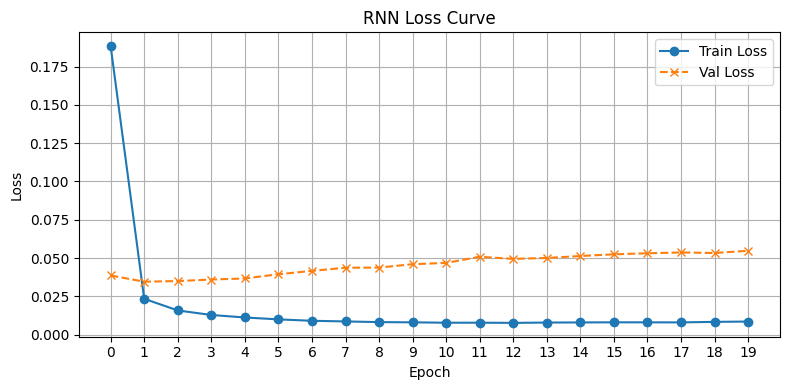


Training LSTM...
Epoch 1/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - accuracy: 0.8660 - loss: 0.5726 - val_accuracy: 0.9875 - val_loss: 0.0443
Epoch 2/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - accuracy: 0.9925 - loss: 0.0266 - val_accuracy: 0.9890 - val_loss: 0.0358
Epoch 3/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.9949 - loss: 0.0162 - val_accuracy: 0.9893 - val_loss: 0.0347
Epoch 4/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.9957 - loss: 0.0131 - val_accuracy: 0.9895 - val_loss: 0.0353
Epoch 5/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - accuracy: 0.9963 - loss: 0.0111 - val_accuracy: 0.9891 - val_loss: 0.0365
Epoch 6/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.9894 - val_loss: 0.0386
Epoch 7/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.9969 - loss: 0.0088 - val_accuracy: 0.9888 - val_loss: 0.0413
Epoch 8/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.9972 - loss

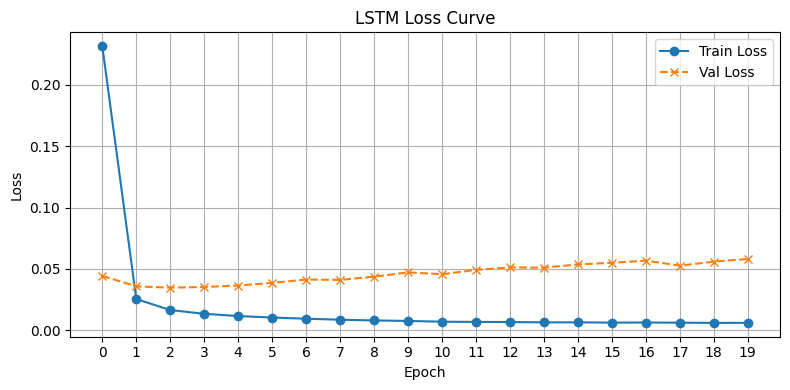


Training GRU...
Epoch 1/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.8960 - loss: 0.4168 - val_accuracy: 0.9879 - val_loss: 0.0382
Epoch 2/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - accuracy: 0.9930 - loss: 0.0222 - val_accuracy: 0.9892 - val_loss: 0.0338
Epoch 3/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.9950 - loss: 0.0149 - val_accuracy: 0.9893 - val_loss: 0.0338
Epoch 4/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - accuracy: 0.9958 - loss: 0.0122 - val_accuracy: 0.9894 - val_loss: 0.0347
Epoch 5/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.9962 - loss: 0.0110 - val_accuracy: 0.9894 - val_loss: 0.0362
Epoch 6/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.9892 - val_loss: 0.0384
Epoch 7/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.9893 - val_loss: 0.0401
Epoch 8/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - accuracy: 0.9970 - loss:

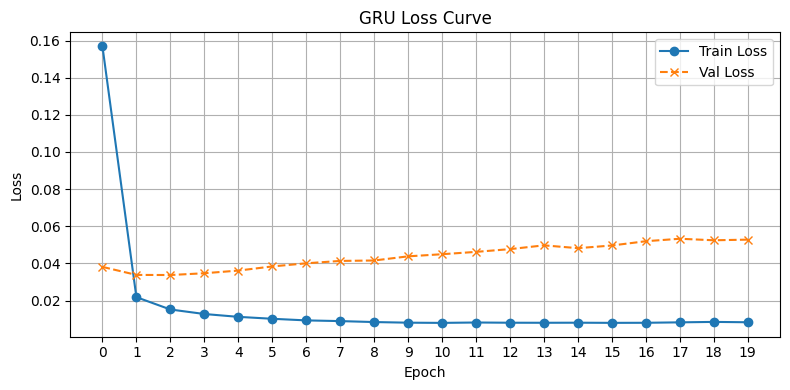


Training BILSTM...
Epoch 1/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - accuracy: 0.8832 - loss: 0.4734 - val_accuracy: 0.9903 - val_loss: 0.0323
Epoch 2/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - accuracy: 0.9948 - loss: 0.0179 - val_accuracy: 0.9920 - val_loss: 0.0266
Epoch 3/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.9919 - val_loss: 0.0272
Epoch 4/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.9917 - val_loss: 0.0291
Epoch 5/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.9920 - val_loss: 0.0304
Epoch 6/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.9917 - val_loss: 0.0324
Epoch 7/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.9988 - loss: 0.0038 - val_accuracy: 0.9918 - val_loss: 0.0343
Epoch 8/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.9989 - 

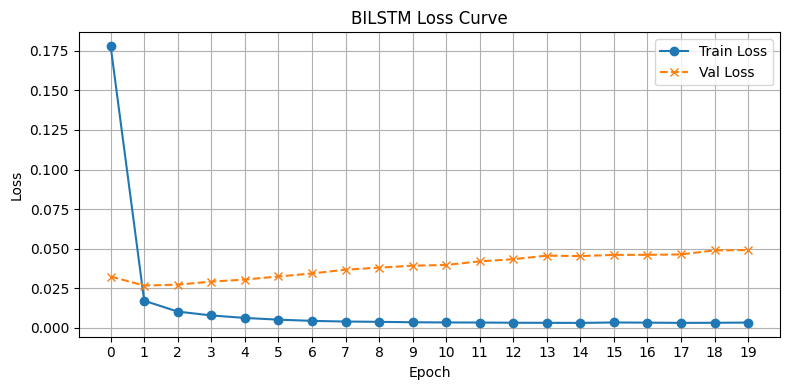

In [ ]:
import matplotlib.pyplot as plt

results = {}
histories = {}
models = {}

params = {
    'batch_size': 64,
    'epochs': 20,
    'units': 64,
    'lr': 0.01,
    'dropout': 0.2
}

for cell in ['rnn', 'lstm', 'gru', 'bilstm']:
    print(f'\nTraining {cell.upper()}...')

    model = build_model(cell_type=cell, units=params['units'], lr=params['lr'], dropout=params['dropout'])

    history = model.fit(
        X_train, y_train_cat,
        batch_size=params['batch_size'],
        epochs=params['epochs'],
        validation_split=0.2,
        verbose=1
    )

    models[cell] = model
    histories[cell] = history

    # Plot Train vs Validation Loss
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='x', linestyle='--')
    plt.title(f'{cell.upper()} Loss Curve')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.xticks(range(0, params['epochs']))
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


## Evaluation
- Predict on test set
- Compute accuracy, F1-score, confusion matrix, classification report
- Visualize confusion matrix and metrics


Evaluating RNN...
150/150 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step
Accuracy: 0.9852199368748271
F1-score: 0.9536366219980523
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.93      0.99      0.96        89
           ;       1.00      1.00      1.00        20
          CC       1.00      1.00      1.00      2403
          CD       1.00      0.98      0.99      2476
          DT       1.00      1.00      1.00      9928
          EX       0.95      0.97      0.96        61
          IN       1.00      1.00      1.00     12229
          JJ       0.96      0.97      0.96      7783
         JJR       0.98      1.00      0.99       278
         JJS       0.98      0.99      0.99       315
         LRB       1.00      1.00      1.00        75
          MD       1.00      1.00      1.00       679
          NN       0.97      0.98      0.98   

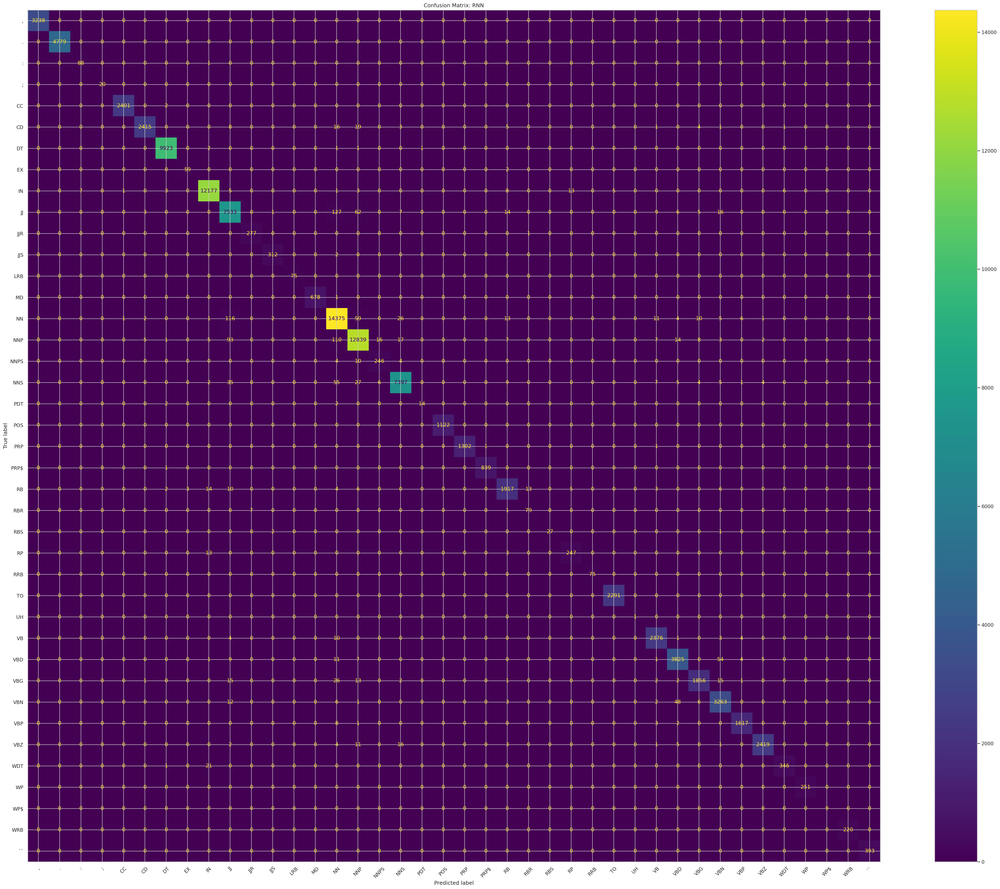

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating RNN...')

# Get the RNN model
model = models['rnn']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_rnn = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_rnn,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_rnn).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: RNN')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_rnn = acc
f1_rnn = f1



Evaluating LSTM...
150/150 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step
Accuracy: 0.9842663844151386
F1-score: 0.9456818994136249
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.92      0.99      0.95        89
           ;       1.00      1.00      1.00        20
          CC       1.00      1.00      1.00      2403
          CD       1.00      0.98      0.99      2476
          DT       1.00      1.00      1.00      9928
          EX       0.94      0.95      0.94        61
          IN       0.99      1.00      1.00     12229
          JJ       0.95      0.97      0.96      7783
         JJR       0.97      0.99      0.98       278
         JJS       0.98      0.97      0.98       315
         LRB       1.00      1.00      1.00        75
          MD       1.00      1.00      1.00       679
          NN       0.97      0.98      0.98  

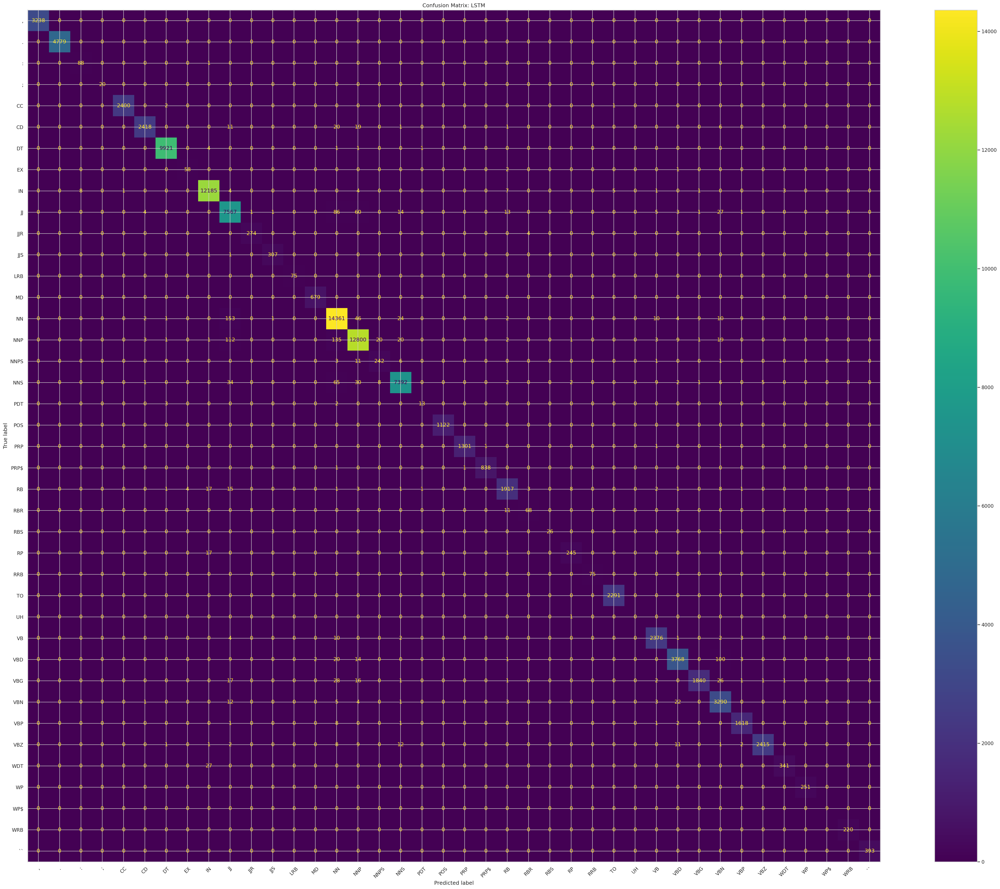

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating LSTM...')

# Get the LSTM model
model = models['lstm']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_lstm = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_lstm,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_lstm).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: LSTM')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_lstm = acc
f1_lstm = f1



Evaluating GRU...
150/150 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step
Accuracy: 0.9837133239885192
F1-score: 0.9751784818308913
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.88      1.00      0.94        89
           ;       1.00      1.00      1.00        20
          CC       1.00      1.00      1.00      2403
          CD       1.00      0.97      0.99      2476
          DT       1.00      1.00      1.00      9928
          EX       0.98      0.95      0.97        61
          IN       1.00      0.99      0.99     12229
          JJ       0.94      0.97      0.95      7783
         JJR       0.97      0.99      0.98       278
         JJS       0.98      0.99      0.98       315
         LRB       1.00      1.00      1.00        75
          MD       1.00      1.00      1.00       679
          NN       0.98      0.98      0.98   

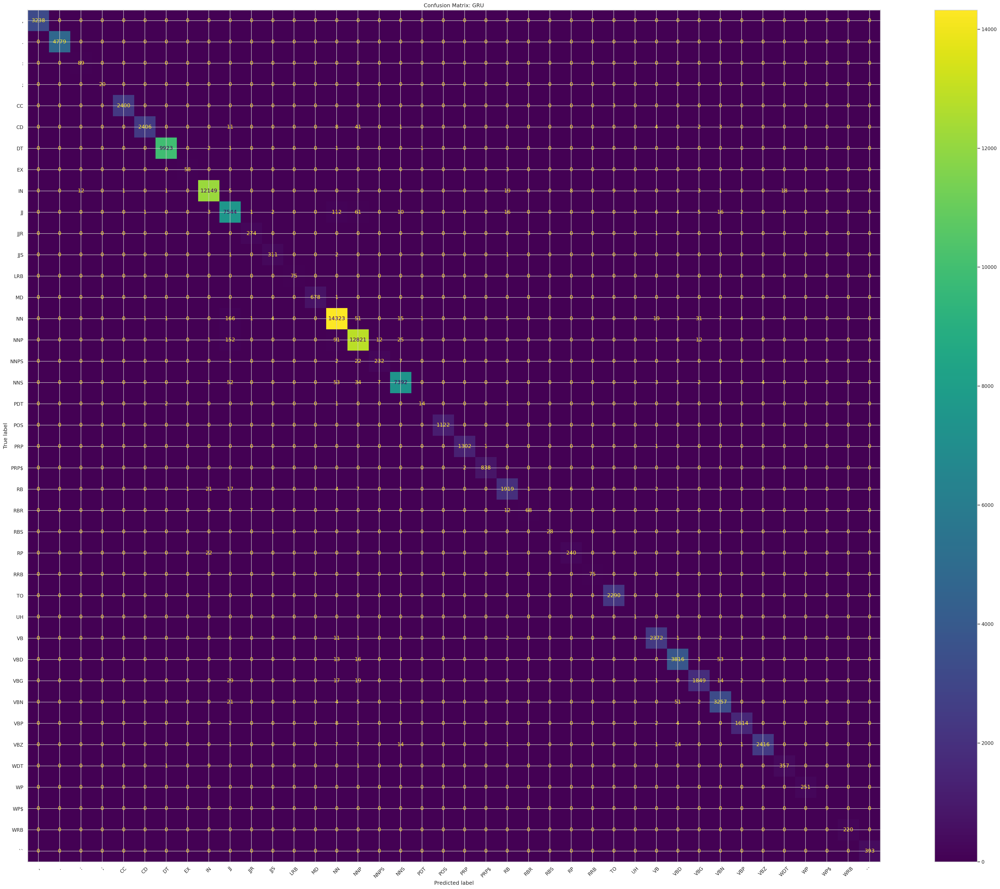

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating GRU...')

# Get the GRU model
model = models['gru']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_gru = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_gru,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_gru).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: GRU')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_gru = acc
f1_gru = f1



Evaluating BiLSTM...
150/150 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step
Accuracy: 0.9886813323034966
F1-score: 0.962737942887752
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.98      0.99      0.98        89
           ;       1.00      1.00      1.00        20
          CC       1.00      1.00      1.00      2403
          CD       1.00      0.97      0.99      2476
          DT       1.00      1.00      1.00      9928
          EX       1.00      1.00      1.00        61
          IN       1.00      1.00      1.00     12229
          JJ       0.97      0.98      0.97      7783
         JJR       0.98      1.00      0.99       278
         JJS       0.98      0.99      0.99       315
         LRB       1.00      1.00      1.00        75
          MD       1.00      1.00      1.00       679
          NN       0.98      0.99      0.98 

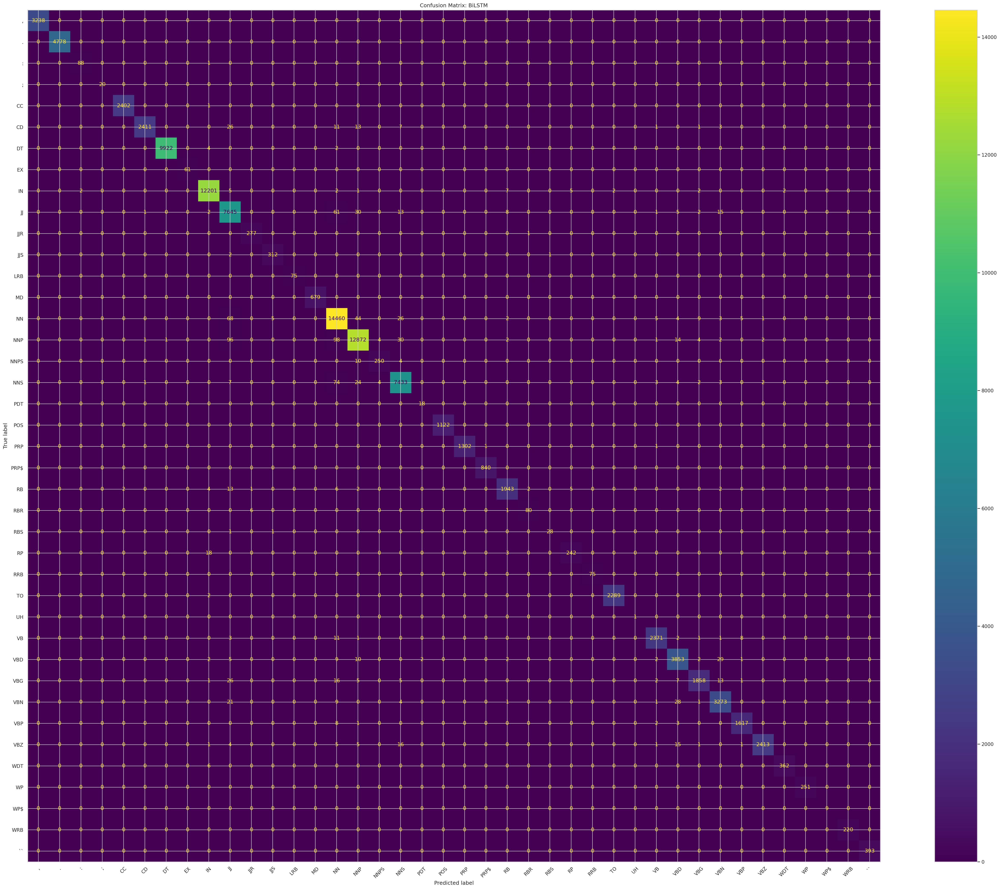

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating BiLSTM...')

# Get the BiLSTM model
model = models['bilstm']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_bilstm = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_bilstm,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_bilstm).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: BiLSTM')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_bilstm = acc
f1_bilstm = f1


## Model Comparison
- Tabular and visual comparison of all models

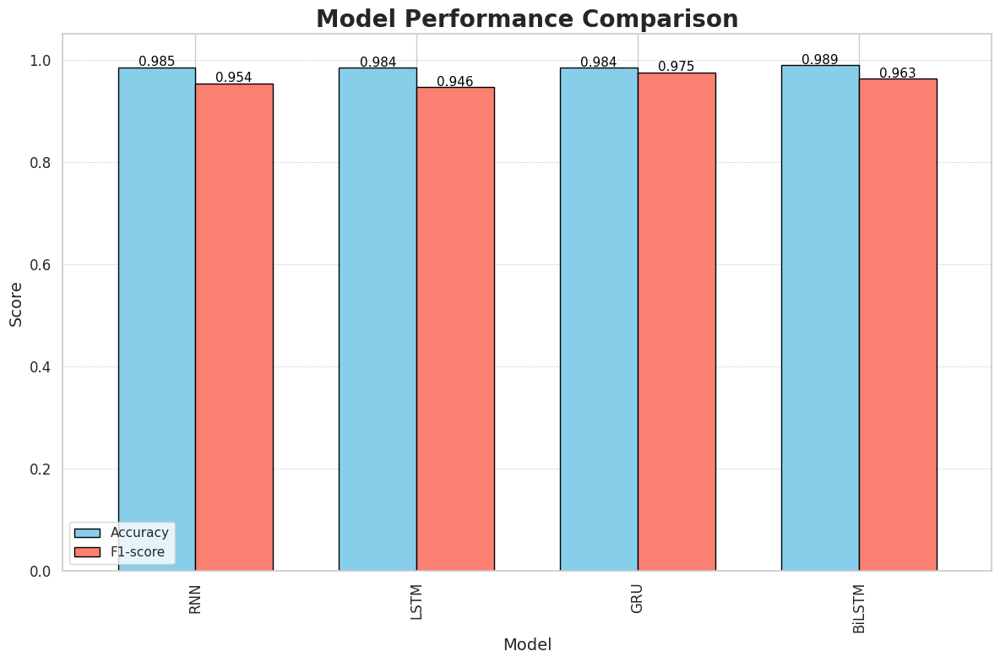

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

# Create a dictionary to store the metrics
metrics = {
    'Model': ['RNN', 'LSTM', 'GRU', 'BiLSTM'],
    'Accuracy': [acc_rnn, acc_lstm, acc_gru, acc_bilstm],
    'F1-score': [f1_rnn, f1_lstm, f1_gru, f1_bilstm]
}

# Create a Pandas DataFrame from the metrics dictionary
metrics_df = pd.DataFrame(metrics)

# Set plot style
sns.set_theme(style="whitegrid")

# Create figure and axes
fig, ax = plt.subplots(figsize=(12, 8))  # Bigger figure

# Plot the bar chart
metrics_df.plot(
    x='Model',
    y=['Accuracy', 'F1-score'],
    kind='bar',
    ax=ax,
    width=0.7,
    color=['skyblue', 'salmon'],
    edgecolor='black'
)

# Customize title and labels
ax.set_title('Model Performance Comparison', fontsize=20, weight='bold')
ax.set_ylabel('Score', fontsize=14)
ax.set_xlabel('Model', fontsize=14)
ax.set_ylim(0, 1.05)
ax.tick_params(axis='both', labelsize=12)

# Add grid
ax.yaxis.grid(True, linestyle='--', linewidth=0.5)

# Add value labels on bars
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.3f}',
                (p.get_x() + p.get_width() / 2., height + 0.01),
                ha='center', va='center', fontsize=11, color='black')

# Adjust layout
plt.tight_layout()
plt.show()

# Decreased batch size,epoch,neurons and learning rate. Increased dropout


Training RNN...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 66s 31ms/step - accuracy: 0.8393 - loss: 0.7357 - val_accuracy: 0.9837 - val_loss: 0.0664
Epoch 2/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 16s 11ms/step - accuracy: 0.9871 - loss: 0.0543 - val_accuracy: 0.9883 - val_loss: 0.0391
Epoch 3/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 15s 10ms/step - accuracy: 0.9925 - loss: 0.0267 - val_accuracy: 0.9890 - val_loss: 0.0351
Epoch 4/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 15s 10ms/step - accuracy: 0.9938 - loss: 0.0198 - val_accuracy: 0.9891 - val_loss: 0.0345
Epoch 5/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 15s 10ms/step - accuracy: 0.9946 - loss: 0.0166 - val_accuracy: 0.9894 - val_loss: 0.0343


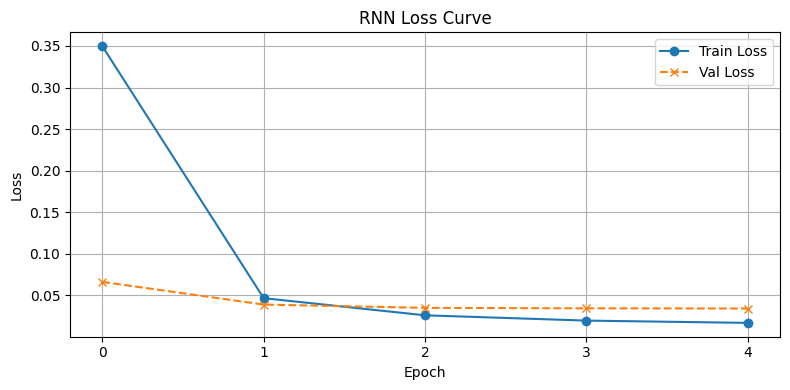


Training LSTM...
Epoch 1/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 34s 18ms/step - accuracy: 0.8285 - loss: 0.8020 - val_accuracy: 0.9784 - val_loss: 0.0980
Epoch 2/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 27s 18ms/step - accuracy: 0.9847 - loss: 0.0706 - val_accuracy: 0.9864 - val_loss: 0.0512
Epoch 3/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 43s 19ms/step - accuracy: 0.9919 - loss: 0.0327 - val_accuracy: 0.9876 - val_loss: 0.0428
Epoch 4/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 27s 18ms/step - accuracy: 0.9934 - loss: 0.0231 - val_accuracy: 0.9881 - val_loss: 0.0404
Epoch 5/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 41s 18ms/step - accuracy: 0.9944 - loss: 0.0185 - val_accuracy: 0.9880 - val_loss: 0.0400


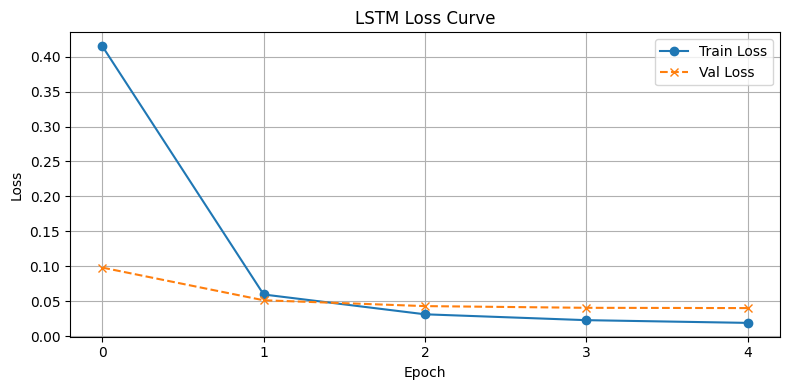


Training GRU...
Epoch 1/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 34s 19ms/step - accuracy: 0.8606 - loss: 0.6502 - val_accuracy: 0.9825 - val_loss: 0.0681
Epoch 2/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 40s 18ms/step - accuracy: 0.9877 - loss: 0.0500 - val_accuracy: 0.9873 - val_loss: 0.0432
Epoch 3/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 41s 18ms/step - accuracy: 0.9926 - loss: 0.0259 - val_accuracy: 0.9882 - val_loss: 0.0378
Epoch 4/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 44s 20ms/step - accuracy: 0.9940 - loss: 0.0192 - val_accuracy: 0.9884 - val_loss: 0.0368
Epoch 5/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 28s 18ms/step - accuracy: 0.9948 - loss: 0.0160 - val_accuracy: 0.9886 - val_loss: 0.0368


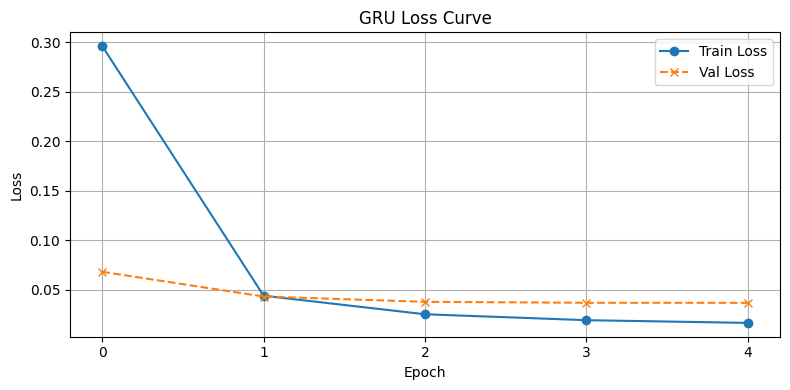


Training BILSTM...
Epoch 1/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - accuracy: 0.8543 - loss: 0.6495 - val_accuracy: 0.9844 - val_loss: 0.0629
Epoch 2/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - accuracy: 0.9895 - loss: 0.0434 - val_accuracy: 0.9898 - val_loss: 0.0363
Epoch 3/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - accuracy: 0.9944 - loss: 0.0203 - val_accuracy: 0.9905 - val_loss: 0.0319
Epoch 4/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - accuracy: 0.9959 - loss: 0.0139 - val_accuracy: 0.9910 - val_loss: 0.0305
Epoch 5/5
1535/1535 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - accuracy: 0.9966 - loss: 0.0109 - val_accuracy: 0.9913 - val_loss: 0.0300


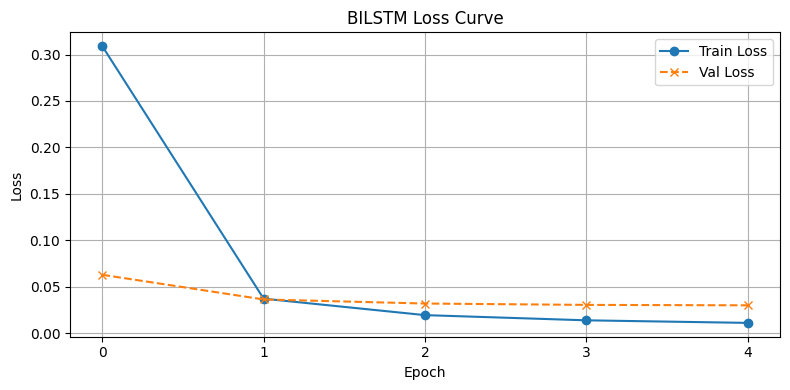

In [ ]:
import matplotlib.pyplot as plt

results = {}
histories = {}
models = {}

params = {
    'batch_size': 10,
    'epochs': 5,
    'units': 32,
    'lr': 0.001,
    'dropout': 0.4
}

for cell in ['rnn', 'lstm', 'gru', 'bilstm']:
    print(f'\nTraining {cell.upper()}...')

    model = build_model(cell_type=cell, units=params['units'], lr=params['lr'], dropout=params['dropout'])

    history = model.fit(
        X_train, y_train_cat,
        batch_size=params['batch_size'],
        epochs=params['epochs'],
        validation_split=0.2,
        verbose=1
    )

    models[cell] = model
    histories[cell] = history

    # Plot Train vs Validation Loss
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='x', linestyle='--')
    plt.title(f'{cell.upper()} Loss Curve')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.xticks(range(0, params['epochs']))
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()



Evaluating RNN...
150/150 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step
Accuracy: 0.9611522727922877
F1-score: 0.8850517219061281
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.66      0.33      0.44        89
           ;       1.00      1.00      1.00        20
          CC       1.00      1.00      1.00      2403
          CD       1.00      0.94      0.97      2476
          DT       1.00      1.00      1.00      9928
          EX       1.00      0.82      0.90        61
          FW       0.00      0.00      0.00         0
          IN       0.98      0.99      0.98     12229
          JJ       0.89      0.91      0.90      7783
         JJR       0.89      0.97      0.93       278
         JJS       0.98      0.92      0.95       315
         LRB       1.00      0.97      0.99        75
          MD       1.00      1.00      1.00  

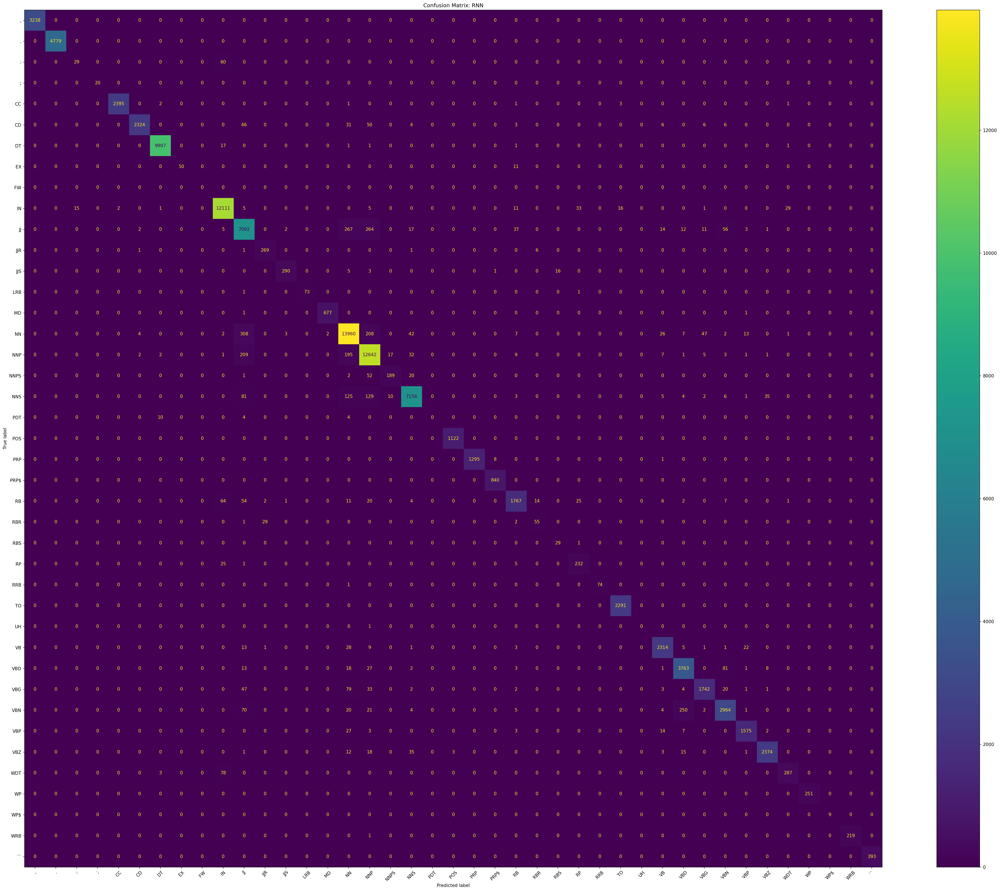

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating RNN...')

# Get the RNN model
model = models['rnn']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_rnn = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_rnn,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_rnn).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: RNN')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_rnn = acc
f1_rnn = f1




Evaluating LSTM...
150/150 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Accuracy: 0.9534761754917946
F1-score: 0.8508315540231098
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.59      0.67      0.63        89
           ;       0.94      0.80      0.86        20
          CC       1.00      1.00      1.00      2403
          CD       0.99      0.94      0.97      2476
          DT       1.00      1.00      1.00      9928
          EX       0.82      0.98      0.90        61
          FW       0.00      0.00      0.00         0
          IN       0.98      0.98      0.98     12229
          JJ       0.89      0.90      0.89      7783
         JJR       0.90      0.98      0.94       278
         JJS       0.95      0.93      0.94       315
         LRB       1.00      0.95      0.97        75
          MD       1.00      1.00      1.00  

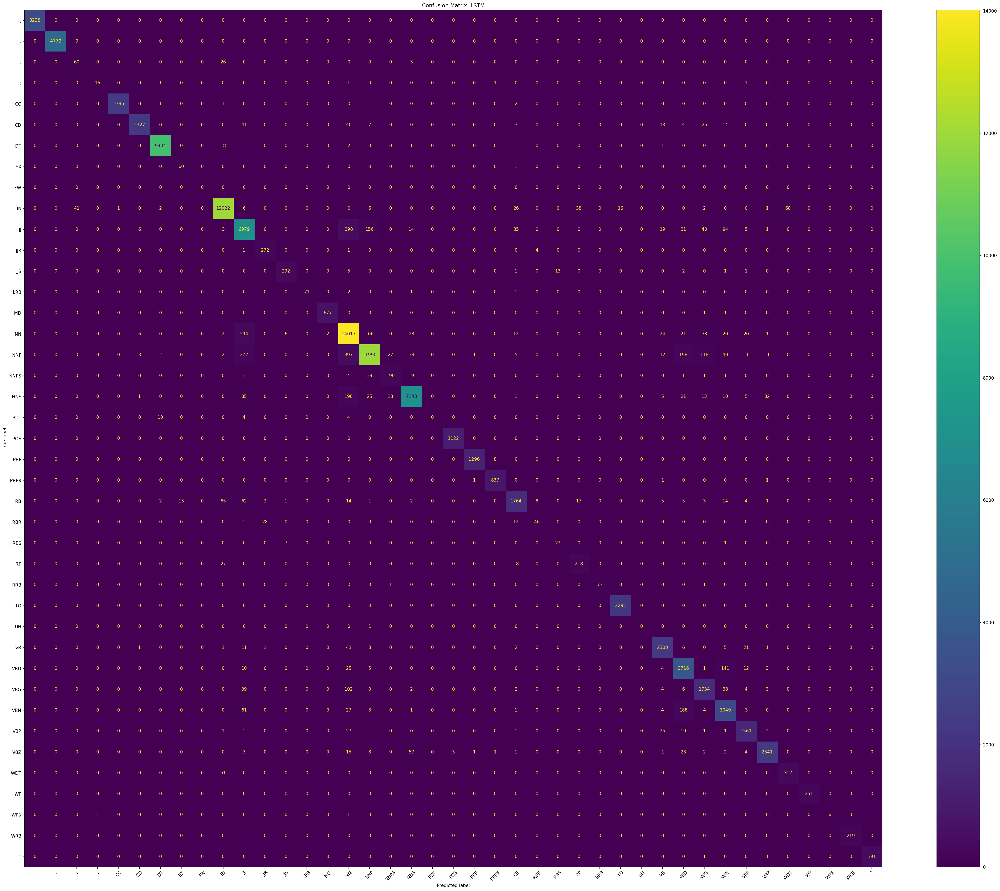

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating LSTM...')

# Get the LSTM model
model = models['lstm']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_lstm = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_lstm,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_lstm).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: LSTM')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_lstm = acc
f1_lstm = f1



Evaluating GRU...
150/150 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step
Accuracy: 0.9571664235107894
F1-score: 0.8580316239449236
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.69      0.37      0.48        89
           ;       1.00      1.00      1.00        20
          CC       1.00      1.00      1.00      2403
          CD       0.99      0.93      0.96      2476
          DT       1.00      1.00      1.00      9928
          EX       0.88      0.98      0.93        61
          FW       0.00      0.00      0.00         0
          IN       0.98      0.99      0.98     12229
          JJ       0.85      0.92      0.88      7783
         JJR       0.92      0.94      0.93       278
         JJS       0.93      0.96      0.94       315
         LRB       1.00      0.97      0.99        75
          MD       1.00      1.00      1.00   

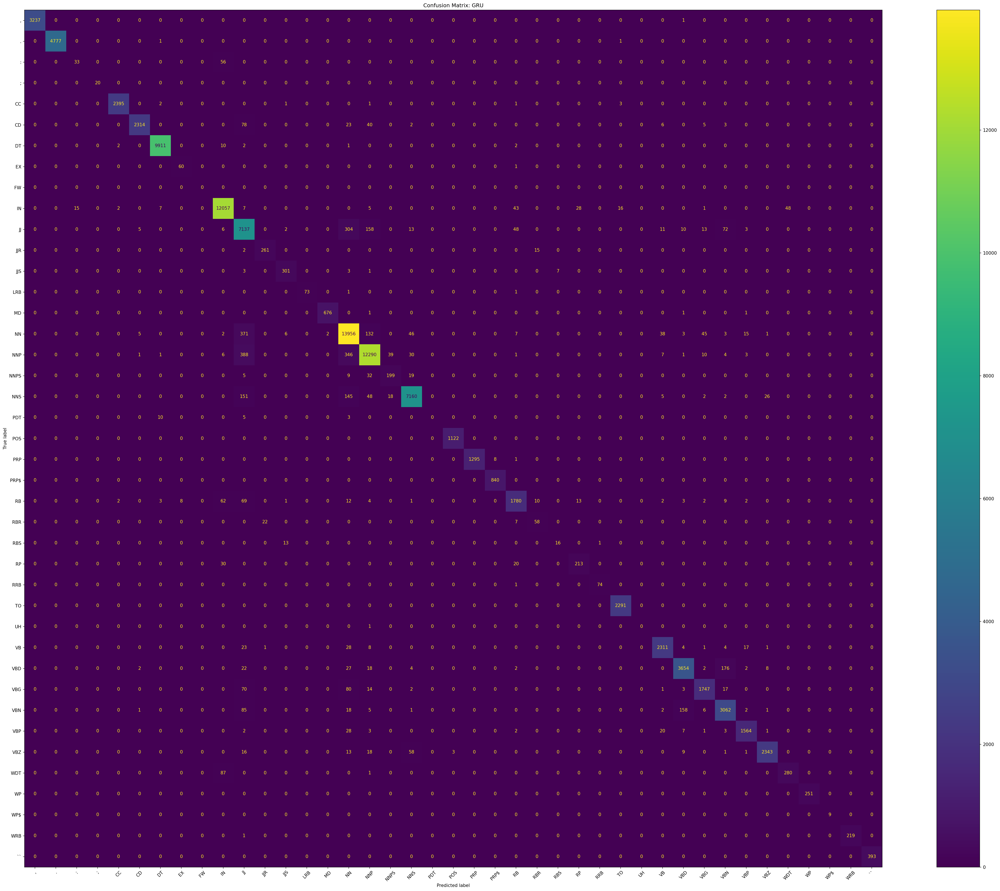

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating GRU...')

# Get the GRU model
model = models['gru']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_gru = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_gru,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_gru).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: GRU')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_gru = acc
f1_gru = f1




Evaluating BiLSTM...
150/150 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Accuracy: 0.973557990292836
F1-score: 0.7696816864521163
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.95      0.21      0.35        89
           ;       0.00      0.00      0.00        20
          CC       1.00      1.00      1.00      2403
          CD       0.99      0.97      0.98      2476
          DT       1.00      1.00      1.00      9928
          EX       1.00      0.18      0.31        61
          IN       0.98      0.99      0.98     12229
          JJ       0.95      0.96      0.95      7783
         JJR       0.85      0.95      0.90       278
         JJS       0.90      0.92      0.91       315
         LRB       0.98      0.85      0.91        75
          MD       0.99      1.00      0.99       679
          NN       0.97      0.98      0.97 

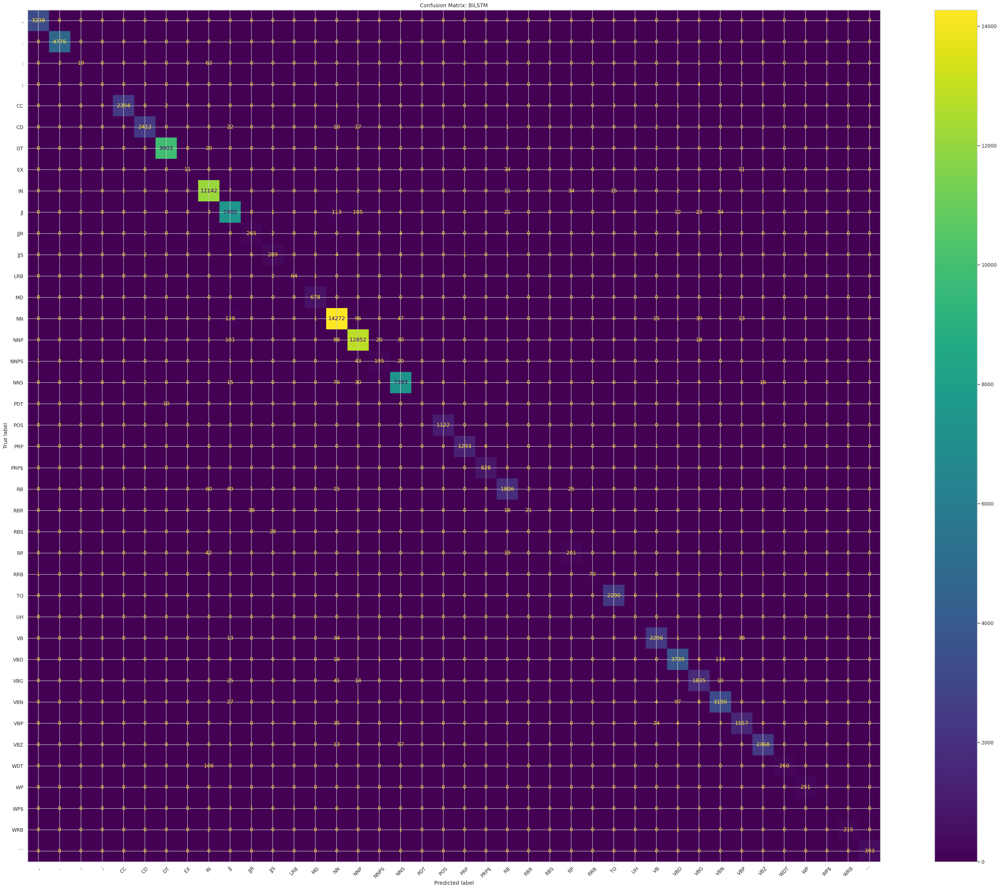

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating BiLSTM...')

# Get the BiLSTM model
model = models['bilstm']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_bilstm = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_bilstm,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_bilstm).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: BiLSTM')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_bilstm = acc
f1_bilstm = f1


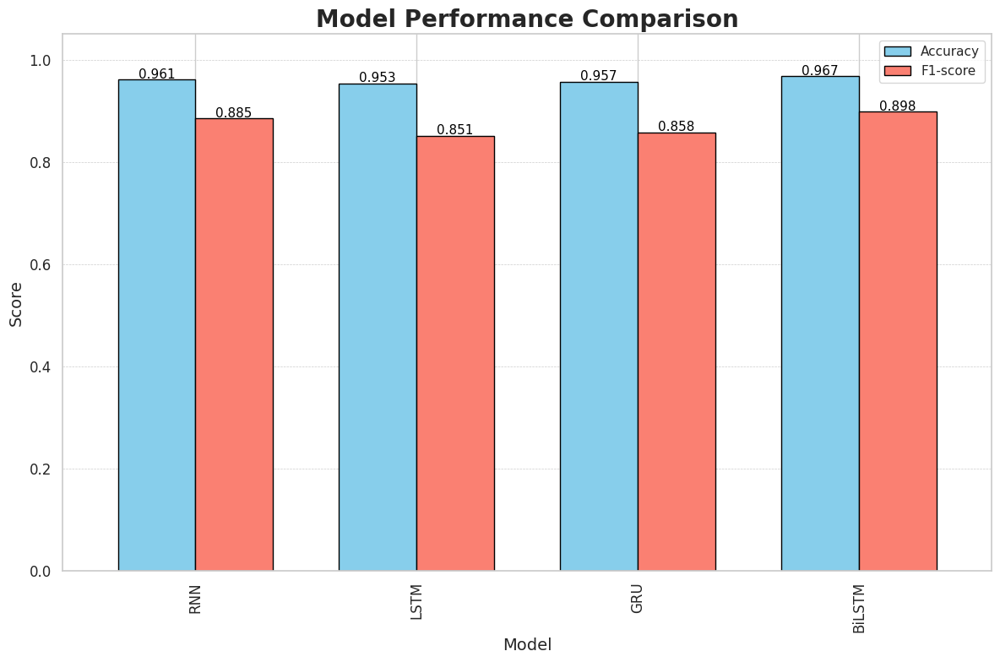

In [ ]:
# Create a dictionary to store the metrics
metrics = {
    'Model': ['RNN', 'LSTM', 'GRU', 'BiLSTM'],
    'Accuracy': [acc_rnn, acc_lstm, acc_gru, acc_bilstm],
    'F1-score': [f1_rnn, f1_lstm, f1_gru, f1_bilstm]
}

# Create a Pandas DataFrame from the metrics dictionary
metrics_df = pd.DataFrame(metrics)

# Set plot style
sns.set_theme(style="whitegrid")

# Create figure and axes
fig, ax = plt.subplots(figsize=(12, 8))  # Bigger figure

# Plot the bar chart
metrics_df.plot(
    x='Model',
    y=['Accuracy', 'F1-score'],
    kind='bar',
    ax=ax,
    width=0.7,
    color=['skyblue', 'salmon'],
    edgecolor='black'
)

# Customize title and labels
ax.set_title('Model Performance Comparison', fontsize=20, weight='bold')
ax.set_ylabel('Score', fontsize=14)
ax.set_xlabel('Model', fontsize=14)
ax.set_ylim(0, 1.05)
ax.tick_params(axis='both', labelsize=12)

# Add grid
ax.yaxis.grid(True, linestyle='--', linewidth=0.5)

# Add value labels on bars
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.3f}',
                (p.get_x() + p.get_width() / 2., height + 0.01),
                ha='center', va='center', fontsize=11, color='black')

# Adjust layout
plt.tight_layout()
plt.show()

# more epochs-(30 epocs), dropout back to 0.2


Training RNN...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step - accuracy: 0.6889 - loss: 1.4750 - val_accuracy: 0.8700 - val_loss: 0.5028
Epoch 2/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 14s 9ms/step - accuracy: 0.9028 - loss: 0.3992 - val_accuracy: 0.9588 - val_loss: 0.1893
Epoch 3/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.9740 - loss: 0.1397 - val_accuracy: 0.9735 - val_loss: 0.1056
Epoch 4/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.9884 - loss: 0.0637 - val_accuracy: 0.9771 - val_loss: 0.0837
Epoch 5/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.9919 - loss: 0.0385 - val_accuracy: 0.9780 - val_loss: 0.0761
Epoch 6/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.9937 - loss: 0.0277 - val_accuracy: 0.9781 - val_loss: 0.0726
Epoch 7/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.9945 - loss: 0.0222 - val_accuracy: 0.9788 - val_loss: 0.0712
Epoch 8/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9950 - loss: 0.0182 - val_accurac

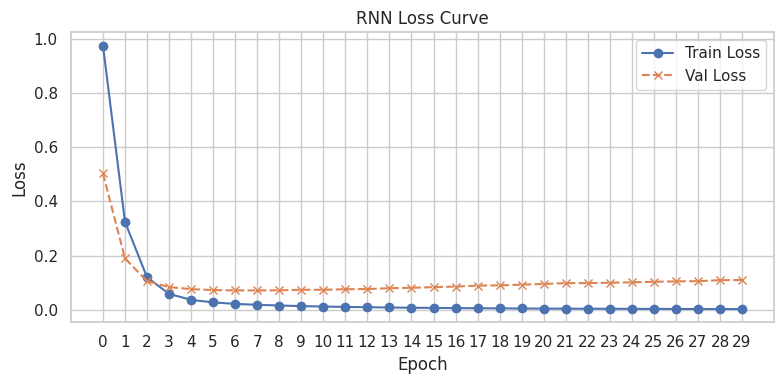


Training LSTM...
Epoch 1/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - accuracy: 0.7009 - loss: 1.4959 - val_accuracy: 0.8324 - val_loss: 0.6476
Epoch 2/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.8651 - loss: 0.5361 - val_accuracy: 0.9386 - val_loss: 0.2676
Epoch 3/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.9579 - loss: 0.2016 - val_accuracy: 0.9679 - val_loss: 0.1401
Epoch 4/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.9830 - loss: 0.0937 - val_accuracy: 0.9750 - val_loss: 0.1001
Epoch 5/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.9903 - loss: 0.0530 - val_accuracy: 0.9760 - val_loss: 0.0859
Epoch 6/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - accuracy: 0.9922 - loss: 0.0358 - val_accuracy: 0.9771 - val_loss: 0.0802
Epoch 7/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - accuracy: 0.9938 - loss: 0.0277 - val_accuracy: 0.9776 - val_loss: 0.0767
Epoch 8/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.9942 - los

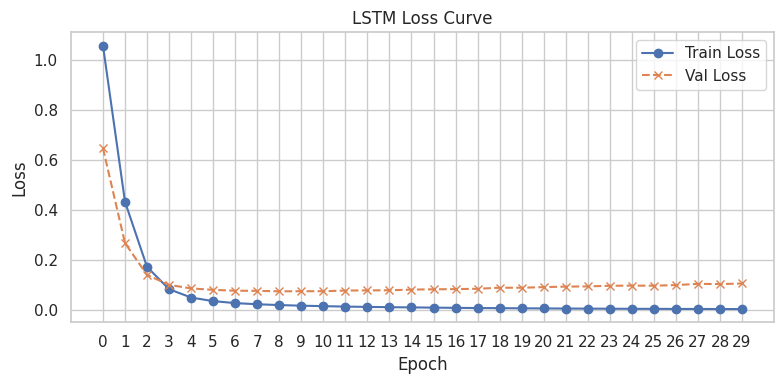


Training GRU...
Epoch 1/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.7449 - loss: 1.3715 - val_accuracy: 0.9199 - val_loss: 0.3477
Epoch 2/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.9424 - loss: 0.2639 - val_accuracy: 0.9687 - val_loss: 0.1336
Epoch 3/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.9831 - loss: 0.0904 - val_accuracy: 0.9749 - val_loss: 0.0909
Epoch 4/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.9901 - loss: 0.0476 - val_accuracy: 0.9775 - val_loss: 0.0777
Epoch 5/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - accuracy: 0.9923 - loss: 0.0322 - val_accuracy: 0.9774 - val_loss: 0.0741
Epoch 6/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.9939 - loss: 0.0239 - val_accuracy: 0.9779 - val_loss: 0.0720
Epoch 7/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - accuracy: 0.9946 - loss: 0.0197 - val_accuracy: 0.9777 - val_loss: 0.0710
Epoch 8/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.9954 - loss

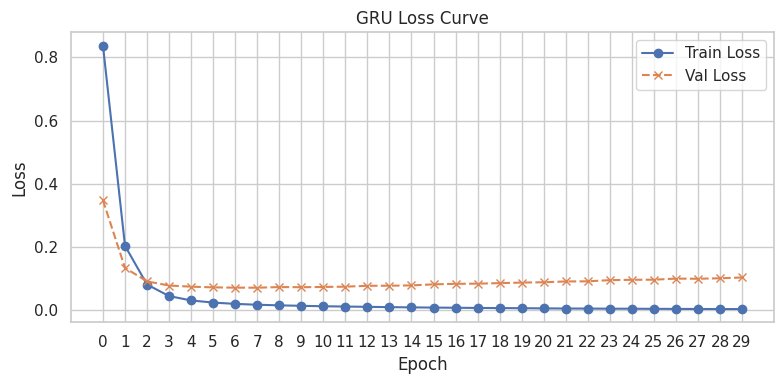


Training BILSTM...
Epoch 1/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - accuracy: 0.7154 - loss: 1.2783 - val_accuracy: 0.8874 - val_loss: 0.4366
Epoch 2/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.9207 - loss: 0.3322 - val_accuracy: 0.9637 - val_loss: 0.1589
Epoch 3/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.9786 - loss: 0.1114 - val_accuracy: 0.9755 - val_loss: 0.0986
Epoch 4/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.9897 - loss: 0.0542 - val_accuracy: 0.9786 - val_loss: 0.0798
Epoch 5/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - accuracy: 0.9926 - loss: 0.0345 - val_accuracy: 0.9801 - val_loss: 0.0712
Epoch 6/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.9944 - loss: 0.0251 - val_accuracy: 0.9809 - val_loss: 0.0679
Epoch 7/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.9955 - loss: 0.0191 - val_accuracy: 0.9810 - val_loss: 0.0663
Epoch 8/30
384/384 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.9965 -

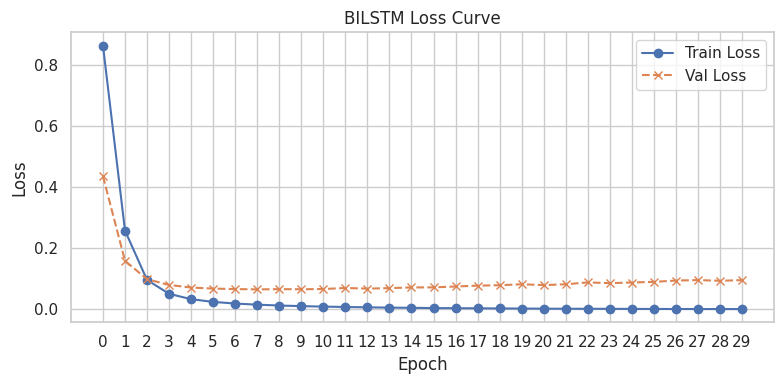

In [ ]:
import matplotlib.pyplot as plt

results = {}
histories = {}
models = {}

params = {
    'batch_size': 10,
    'epochs': 30,
    'units': 32,
    'lr': 0.001,
    'dropout': 0.2
}

for cell in ['rnn', 'lstm', 'gru', 'bilstm']:
    print(f'\nTraining {cell.upper()}...')

    model = build_model(cell_type=cell, units=params['units'], lr=params['lr'], dropout=params['dropout'])

    history = model.fit(
        X_train, y_train_cat,
        batch_size=params['batch_size'],
        epochs=params['epochs'],
        validation_split=0.2,
        verbose=1
    )

    models[cell] = model
    histories[cell] = history

    # Plot Train vs Validation Loss
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='x', linestyle='--')
    plt.title(f'{cell.upper()} Loss Curve')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.xticks(range(0, params['epochs']))
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


Evaluating RNN...
150/150 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step
Accuracy: 0.9847813027433704
F1-score: 0.9513452923940322
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.91      0.96      0.93        89
           ;       1.00      1.00      1.00        20
          CC       1.00      1.00      1.00      2403
          CD       1.00      0.98      0.99      2476
          DT       1.00      1.00      1.00      9928
          EX       0.94      1.00      0.97        61
          IN       0.99      1.00      0.99     12229
          JJ       0.96      0.96      0.96      7783
         JJR       0.97      0.98      0.98       278
         JJS       0.98      0.99      0.99       315
         LRB       1.00      1.00      1.00        75
          MD       1.00      1.00      1.00       679
          NN       0.98      0.98      0.98   

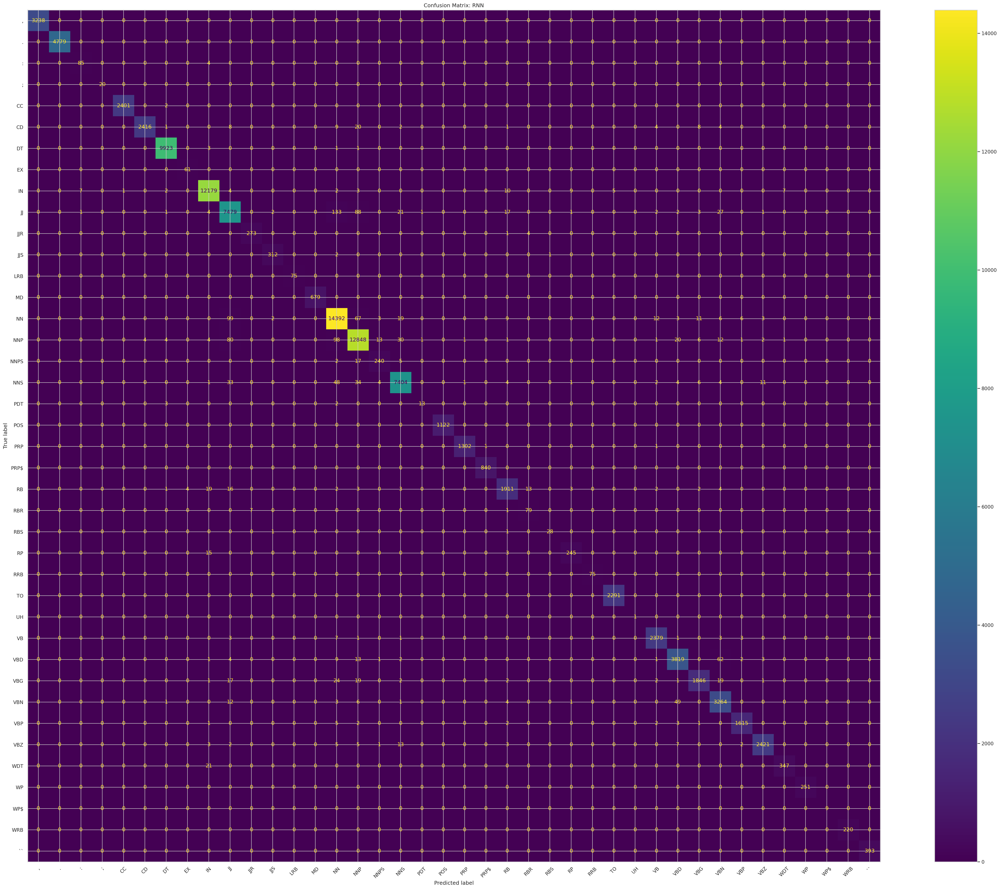

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating RNN...')

# Get the RNN model
model = models['rnn']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_rnn = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_rnn,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_rnn).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: RNN')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_rnn = acc
f1_rnn = f1




Evaluating LSTM...
150/150 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step
Accuracy: 0.9835321490211784
F1-score: 0.9218861469982966
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.91      0.96      0.93        89
           ;       1.00      1.00      1.00        20
          CC       1.00      1.00      1.00      2403
          CD       1.00      0.97      0.99      2476
          DT       1.00      1.00      1.00      9928
          EX       0.95      0.97      0.96        61
          IN       0.99      1.00      0.99     12229
          JJ       0.96      0.97      0.96      7783
         JJR       0.96      0.97      0.97       278
         JJS       0.98      0.98      0.98       315
         LRB       1.00      0.99      0.99        75
          MD       1.00      1.00      1.00       679
          NN       0.98      0.98      0.98  

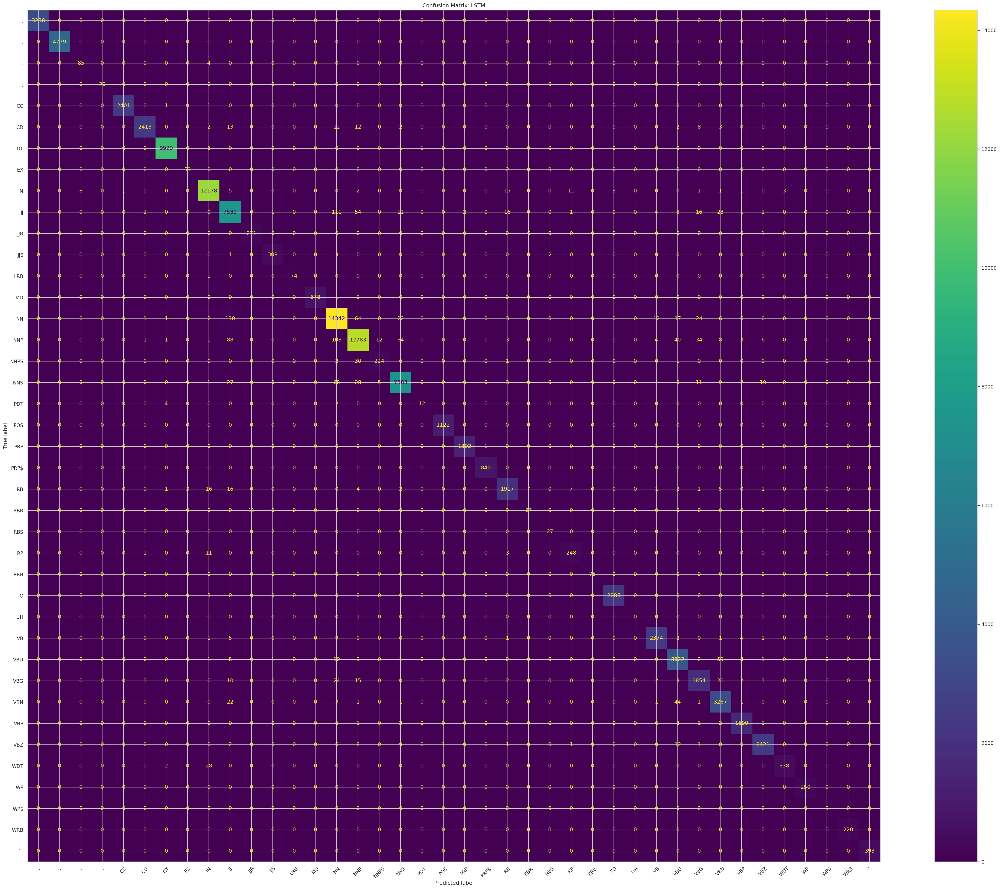

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating LSTM...')

# Get the LSTM model
model = models['lstm']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_lstm = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_lstm,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_lstm).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: LSTM')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_lstm = acc
f1_lstm = f1



Evaluating GRU...
150/150 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step
Accuracy: 0.9839326410542476
F1-score: 0.922213149506967
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.95      0.98      0.96        89
           ;       1.00      1.00      1.00        20
          CC       1.00      1.00      1.00      2403
          CD       1.00      0.98      0.99      2476
          DT       1.00      1.00      1.00      9928
          EX       0.94      1.00      0.97        61
          IN       0.99      1.00      1.00     12229
          JJ       0.94      0.97      0.96      7783
         JJR       0.96      0.99      0.97       278
         JJS       0.98      0.99      0.99       315
         LRB       1.00      1.00      1.00        75
          MD       1.00      1.00      1.00       679
          NN       0.97      0.98      0.98    

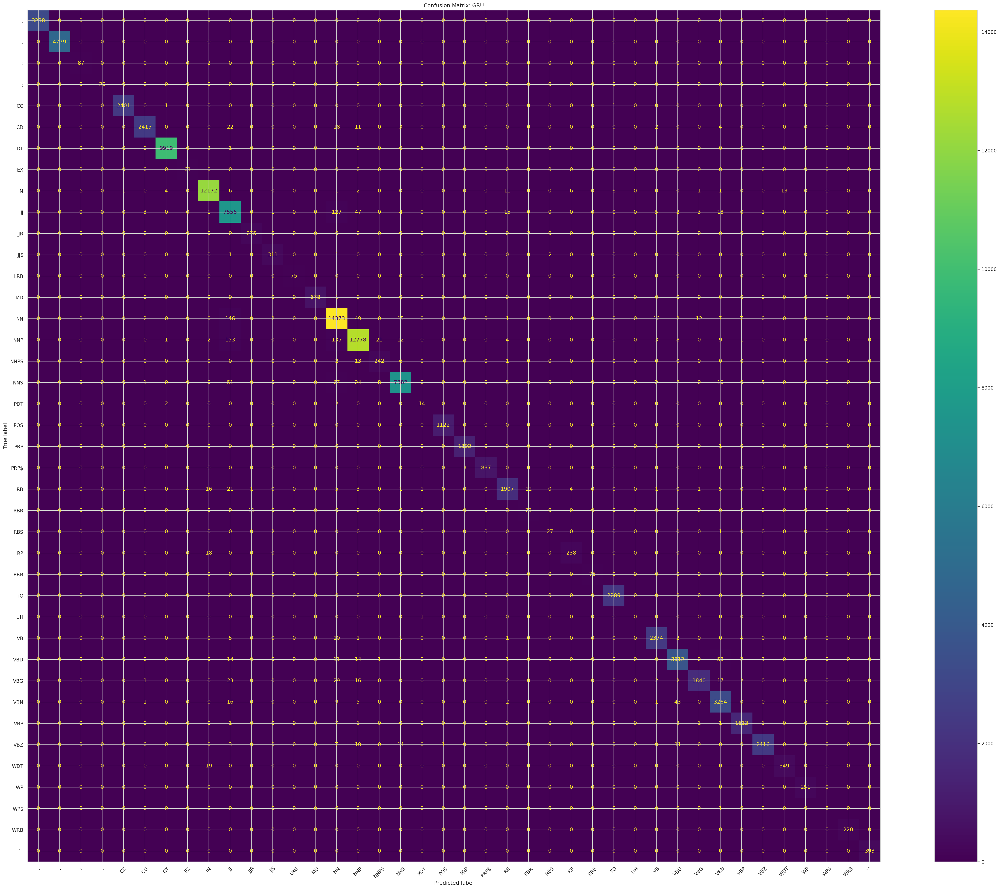

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating GRU...')

# Get the GRU model
model = models['gru']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_gru = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_gru,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_gru).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: GRU')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_gru = acc
f1_gru = f1



Evaluating BiLSTM...
150/150 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step
Accuracy: 0.9878708127127614
F1-score: 0.9601696219211089
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.96      0.99      0.97        89
           ;       1.00      1.00      1.00        20
          CC       1.00      1.00      1.00      2403
          CD       1.00      0.98      0.99      2476
          DT       1.00      1.00      1.00      9928
          EX       1.00      0.98      0.99        61
          IN       1.00      1.00      1.00     12229
          JJ       0.97      0.98      0.97      7783
         JJR       0.98      0.99      0.98       278
         JJS       0.99      0.99      0.99       315
         LRB       1.00      1.00      1.00        75
          MD       1.00      1.00      1.00       679
          NN       0.98      0.99      0.98

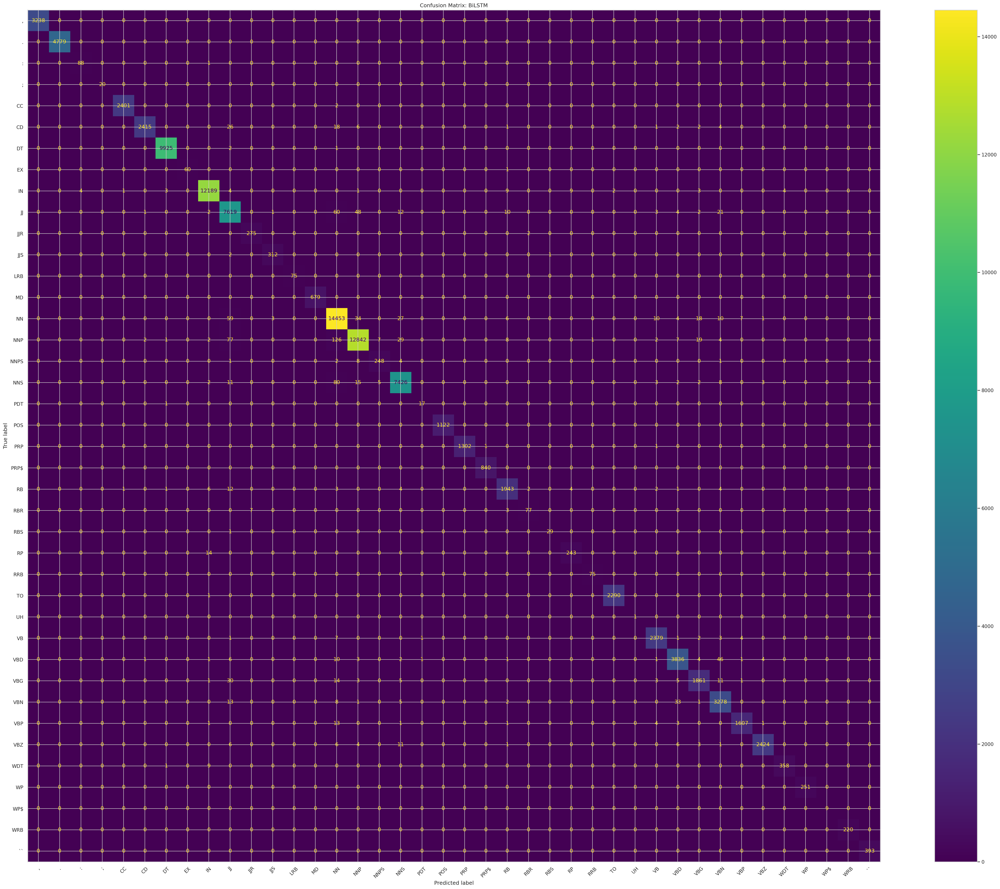

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating BiLSTM...')

# Get the BiLSTM model
model = models['bilstm']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_bilstm = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_bilstm,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_bilstm).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: BiLSTM')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_bilstm = acc
f1_bilstm = f1


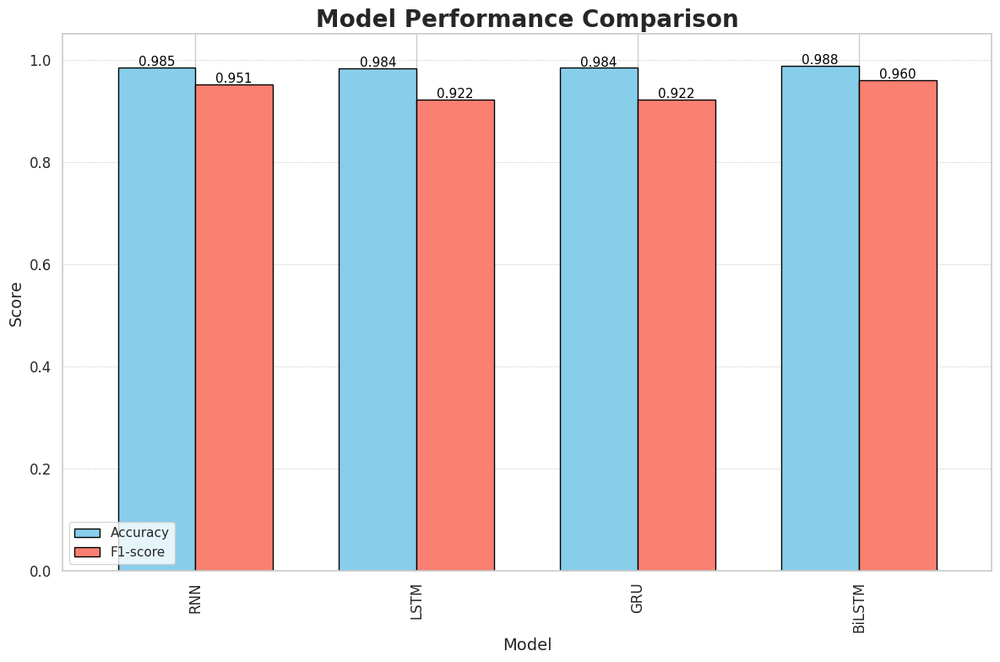

In [ ]:
# Create a dictionary to store the metrics
metrics = {
    'Model': ['RNN', 'LSTM', 'GRU', 'BiLSTM'],
    'Accuracy': [acc_rnn, acc_lstm, acc_gru, acc_bilstm],
    'F1-score': [f1_rnn, f1_lstm, f1_gru, f1_bilstm]
}

# Create a Pandas DataFrame from the metrics dictionary
metrics_df = pd.DataFrame(metrics)

# Set plot style
sns.set_theme(style="whitegrid")

# Create figure and axes
fig, ax = plt.subplots(figsize=(12, 8))  # Bigger figure

# Plot the bar chart
metrics_df.plot(
    x='Model',
    y=['Accuracy', 'F1-score'],
    kind='bar',
    ax=ax,
    width=0.7,
    color=['skyblue', 'salmon'],
    edgecolor='black'
)

# Customize title and labels
ax.set_title('Model Performance Comparison', fontsize=20, weight='bold')
ax.set_ylabel('Score', fontsize=14)
ax.set_xlabel('Model', fontsize=14)
ax.set_ylim(0, 1.05)
ax.tick_params(axis='both', labelsize=12)

# Add grid
ax.yaxis.grid(True, linestyle='--', linewidth=0.5)

# Add value labels on bars
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.3f}',
                (p.get_x() + p.get_width() / 2., height + 0.01),
                ha='center', va='center', fontsize=11, color='black')

# Adjust layout
plt.tight_layout()
plt.show()

# 10 epochs



Training RNN...
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


120/120 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - accuracy: 0.6491 - loss: 1.7279 - val_accuracy: 0.8114 - val_loss: 0.7632
Epoch 2/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.8310 - loss: 0.6833 - val_accuracy: 0.8853 - val_loss: 0.4620
Epoch 3/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9025 - loss: 0.4090 - val_accuracy: 0.9379 - val_loss: 0.2768
Epoch 4/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9523 - loss: 0.2307 - val_accuracy: 0.9631 - val_loss: 0.1683
Epoch 5/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9764 - loss: 0.1282 - val_accuracy: 0.9715 - val_loss: 0.1197
Epoch 6/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9858 - loss: 0.0806 - val_accuracy: 0.9748 - val_loss: 0.0970
Epoch 7/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9900 - loss: 0.0540 - val_accuracy: 0.9762 - val_loss: 0.0859
Epoch 8/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9922 - loss: 0.0406 - val_accuracy: 0.97

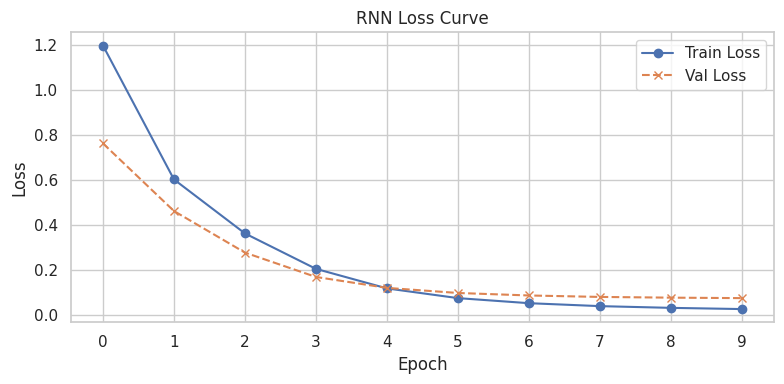


Training LSTM...
Epoch 1/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - accuracy: 0.6632 - loss: 1.7764 - val_accuracy: 0.7852 - val_loss: 0.8888
Epoch 2/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.7996 - loss: 0.8164 - val_accuracy: 0.8580 - val_loss: 0.5555
Epoch 3/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - accuracy: 0.8745 - loss: 0.4936 - val_accuracy: 0.9180 - val_loss: 0.3376
Epoch 4/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.9359 - loss: 0.2865 - val_accuracy: 0.9559 - val_loss: 0.2039
Epoch 5/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.9707 - loss: 0.1581 - val_accuracy: 0.9686 - val_loss: 0.1423
Epoch 6/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - accuracy: 0.9836 - loss: 0.0982 - val_accuracy: 0.9734 - val_loss: 0.1121
Epoch 7/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - accuracy: 0.9885 - loss: 0.0663 - val_accuracy: 0.9757 - val_loss: 0.0959
Epoch 8/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.9903 - loss:

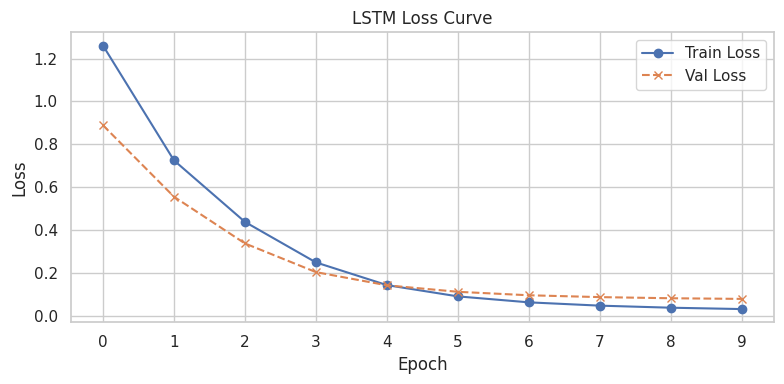


Training GRU...
Epoch 1/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - accuracy: 0.7088 - loss: 1.6860 - val_accuracy: 0.8395 - val_loss: 0.6188
Epoch 2/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.8649 - loss: 0.5287 - val_accuracy: 0.9237 - val_loss: 0.3172
Epoch 3/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.9416 - loss: 0.2606 - val_accuracy: 0.9605 - val_loss: 0.1757
Epoch 4/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9747 - loss: 0.1341 - val_accuracy: 0.9708 - val_loss: 0.1203
Epoch 5/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.9851 - loss: 0.0805 - val_accuracy: 0.9743 - val_loss: 0.0964
Epoch 6/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.9896 - loss: 0.0537 - val_accuracy: 0.9763 - val_loss: 0.0849
Epoch 7/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - accuracy: 0.9914 - loss: 0.0394 - val_accuracy: 0.9773 - val_loss: 0.0789
Epoch 8/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.9928 - loss: 

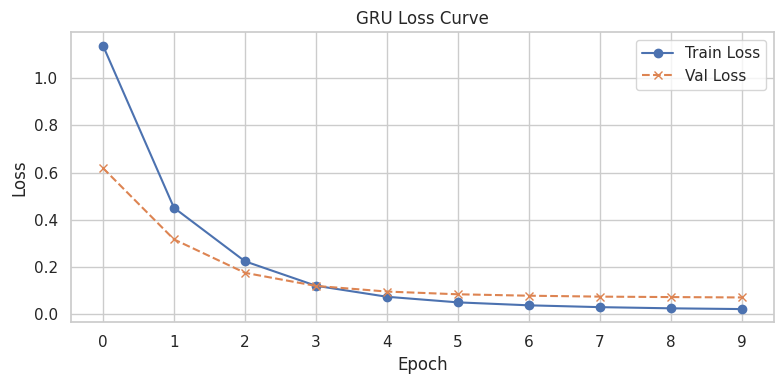


Training BILSTM...
Epoch 1/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - accuracy: 0.6721 - loss: 1.6278 - val_accuracy: 0.8024 - val_loss: 0.7858
Epoch 2/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.8241 - loss: 0.6842 - val_accuracy: 0.9014 - val_loss: 0.3943
Epoch 3/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.9233 - loss: 0.3230 - val_accuracy: 0.9549 - val_loss: 0.1978
Epoch 4/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.9694 - loss: 0.1552 - val_accuracy: 0.9711 - val_loss: 0.1255
Epoch 5/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.9835 - loss: 0.0901 - val_accuracy: 0.9764 - val_loss: 0.0949
Epoch 6/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.9895 - loss: 0.0569 - val_accuracy: 0.9789 - val_loss: 0.0812
Epoch 7/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.9921 - loss: 0.0406 - val_accuracy: 0.9797 - val_loss: 0.0725
Epoch 8/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.9939 - lo

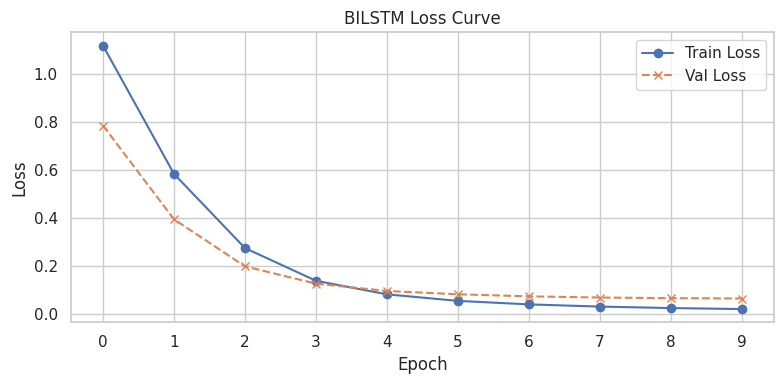

In [ ]:
#hypermarameter training and testing

results = {}
histories = {}
models = {}
params = {
    'batch_size': 32,
    'epochs': 10,
    'units': 64,
    'lr': 0.001,
    'dropout': 0.2
}
for cell in ['rnn', 'lstm', 'gru', 'bilstm']:
    print(f'\nTraining {cell.upper()}...')

    model = build_model(cell_type=cell, units=params['units'], lr=params['lr'], dropout=params['dropout'])

    history = model.fit(
        X_train, y_train_cat,
        batch_size=params['batch_size'],
        epochs=params['epochs'],
        validation_split=0.2,
        verbose=1
    )

    models[cell] = model
    histories[cell] = history

    # Plot Train vs Validation Loss
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='x', linestyle='--')
    plt.title(f'{cell.upper()} Loss Curve')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.xticks(range(0, params['epochs']))
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


Evaluating RNN...
150/150 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step
Accuracy: 0.9764472542456923
F1-score: 0.8085006205019873
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       1.00      0.03      0.07        89
           ;       1.00      0.35      0.52        20
          CC       1.00      1.00      1.00      2403
          CD       1.00      0.98      0.99      2476
          DT       1.00      1.00      1.00      9928
          EX       0.95      0.64      0.76        61
          IN       0.98      0.99      0.99     12229
          JJ       0.94      0.95      0.95      7783
         JJR       0.89      0.97      0.93       278
         JJS       0.93      0.94      0.93       315
         LRB       1.00      0.96      0.98        75
          MD       1.00      1.00      1.00       679
          NN       0.97      0.97      0.97   

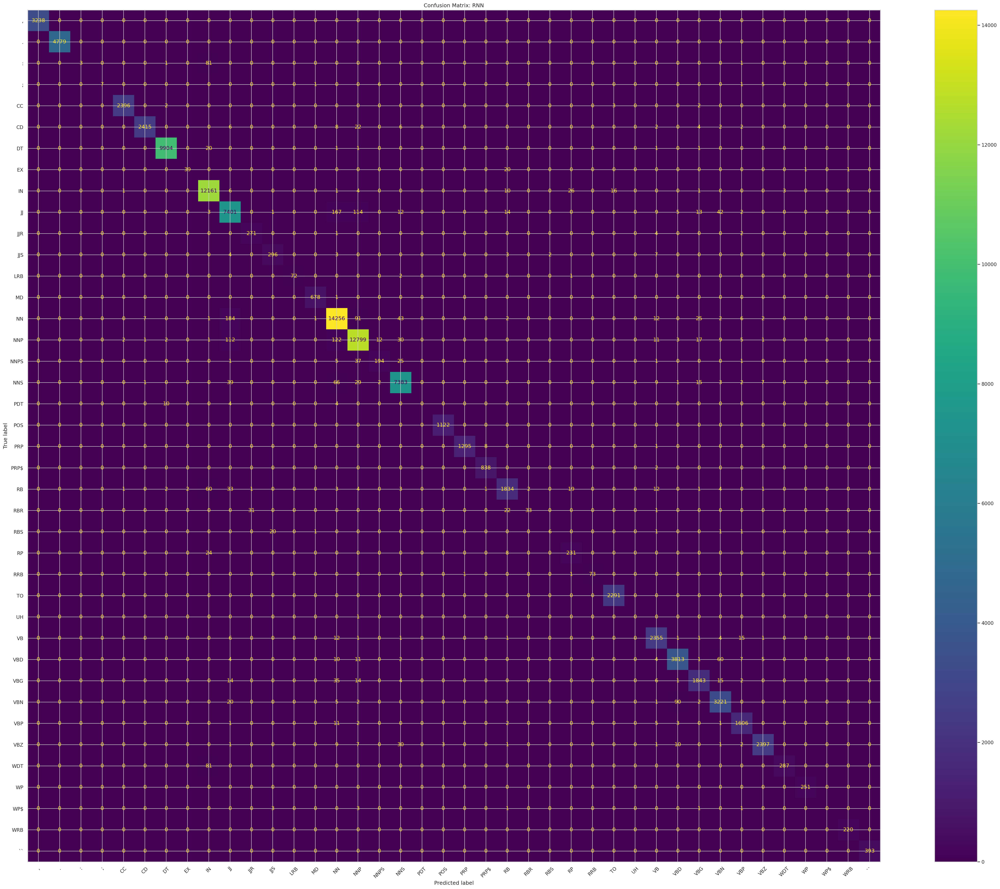

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating RNN...')

# Get the RNN model
model = models['rnn']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_rnn = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_rnn,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_rnn).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: RNN')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_rnn = acc
f1_rnn = f1



Evaluating LSTM...
150/150 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step
Accuracy: 0.9716508853734588
F1-score: 0.7854711841908733
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.75      0.03      0.06        89
           ;       0.00      0.00      0.00        20
          CC       1.00      1.00      1.00      2403
          CD       0.99      0.97      0.98      2476
          DT       1.00      1.00      1.00      9928
          EX       1.00      0.25      0.39        61
          IN       0.97      0.99      0.98     12229
          JJ       0.95      0.93      0.94      7783
         JJR       0.82      0.90      0.86       278
         JJS       0.92      0.92      0.92       315
         LRB       0.99      0.97      0.98        75
          MD       0.98      1.00      0.99       679
          NN       0.96      0.97      0.97  

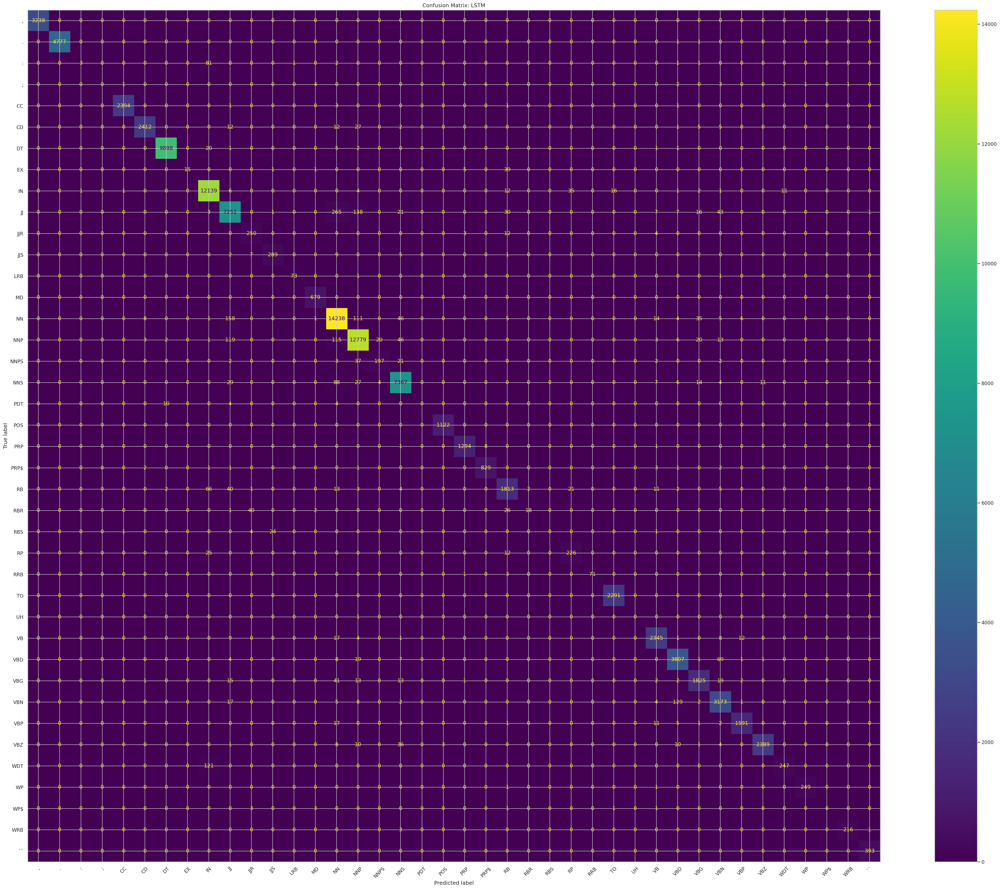

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating LSTM...')

# Get the LSTM model
model = models['lstm']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_lstm = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_lstm,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_lstm).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: LSTM')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_lstm = acc
f1_lstm = f1




Evaluating GRU...
150/150 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step
Accuracy: 0.9735961323912236
F1-score: 0.8145754795807351
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.65      0.83      0.73        89
           ;       1.00      0.40      0.57        20
          CC       1.00      1.00      1.00      2403
          CD       1.00      0.98      0.99      2476
          DT       1.00      1.00      1.00      9928
          EX       0.85      0.28      0.42        61
          IN       0.98      0.99      0.98     12229
          JJ       0.94      0.94      0.94      7783
         JJR       0.90      0.96      0.93       278
         JJS       0.93      0.93      0.93       315
         LRB       0.99      0.96      0.97        75
          MD       1.00      1.00      1.00       679
          NN       0.96      0.97      0.97   

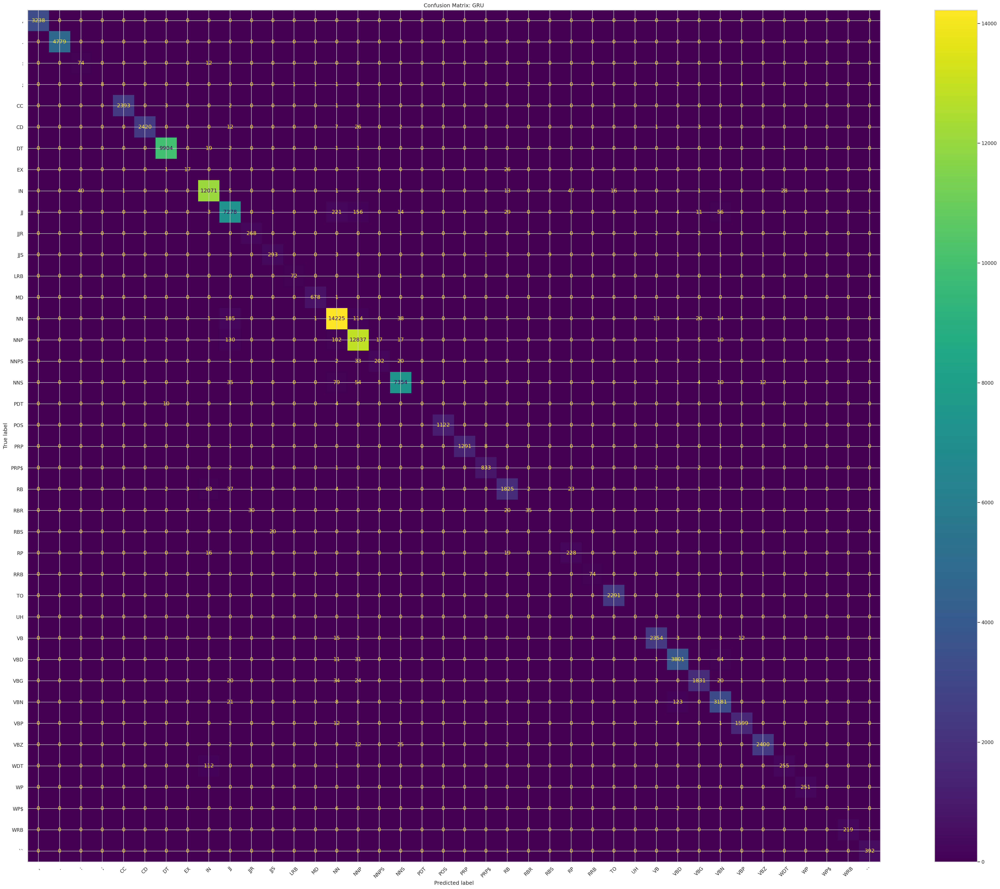

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating GRU...')

# Get the GRU model
model = models['gru']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_gru = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_gru,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_gru).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: GRU')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_gru = acc
f1_gru = f1



Evaluating BiLSTM...
150/150 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Accuracy: 0.9800230759695244
F1-score: 0.8182644682654574
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.85      0.38      0.53        89
           ;       0.00      0.00      0.00        20
          CC       1.00      1.00      1.00      2403
          CD       0.99      0.97      0.98      2476
          DT       1.00      1.00      1.00      9928
          EX       1.00      0.95      0.97        61
          IN       0.98      0.99      0.99     12229
          JJ       0.96      0.97      0.96      7783
         JJR       0.89      0.98      0.93       278
         JJS       0.94      0.96      0.95       315
         LRB       1.00      0.92      0.96        75
          MD       1.00      1.00      1.00       679
          NN       0.97      0.98      0.98

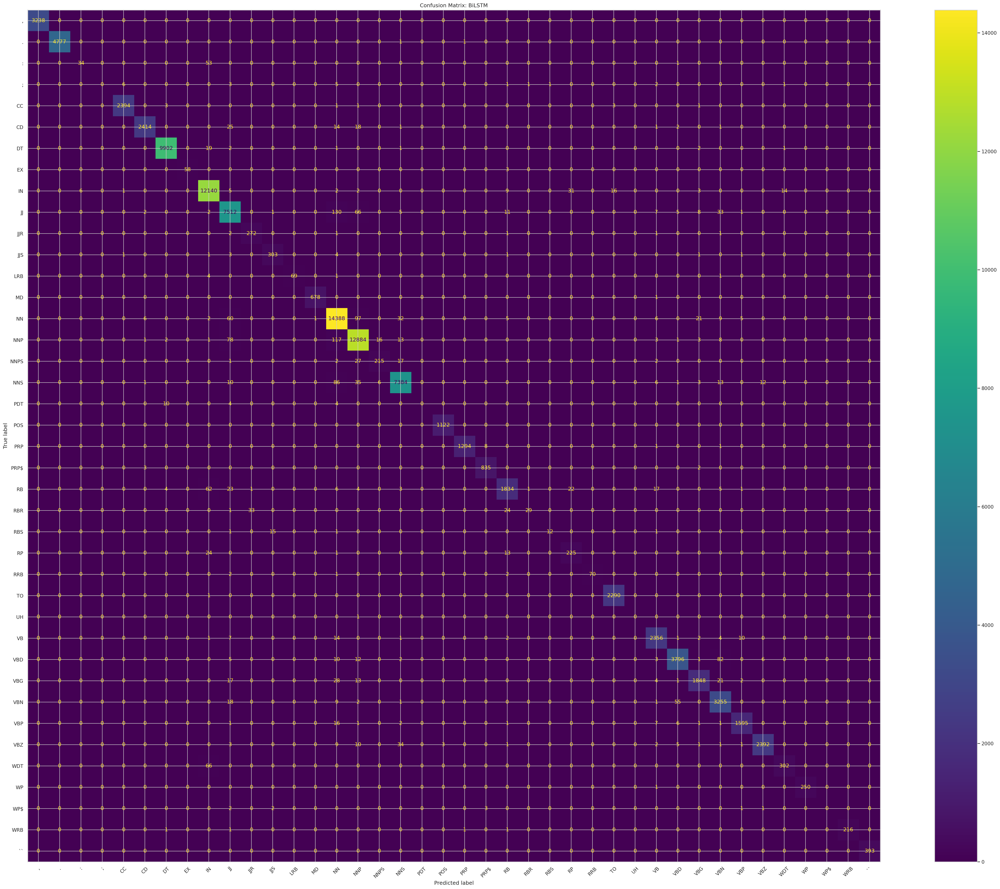

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

print(f'\nEvaluating BiLSTM...')

# Get the BiLSTM model
model = models['bilstm']

# Predict
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
y_true_labels = y_test.flatten()

# Define padding index (assuming first key in tag2idx is 'PAD' or similar)
padding_idx = tag2idx[list(tag2idx.keys())[0]]

# Remove padding
mask = y_true_labels != padding_idx
y_true_labels = y_true_labels[mask]
y_pred_labels = y_pred_labels[mask]

# Accuracy and F1
acc = accuracy_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

# Build label and name list from idx2tag (excluding padding)
label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
target_names_bilstm = [idx2tag[i] for i in label_indices]

# Classification report and confusion matrix
report = classification_report(
    y_true_labels, y_pred_labels,
    labels=label_indices,
    target_names=target_names_bilstm,
    zero_division=0
)
cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)

# Output
print('Accuracy:', acc)
print('F1-score:', f1)
print('Classification Report:\n', report)

# Create a larger plot with higher dpi for better clarity
fig, ax = plt.subplots(figsize=(35, 28), dpi=150)  # Increasing dpi for better resolution
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names_bilstm).plot(ax=ax, xticks_rotation=45)
plt.title('Confusion Matrix: BiLSTM')
plt.tight_layout()
plt.show()

# Assign accuracy and F1-score to variables for later comparison
acc_bilstm = acc
f1_bilstm = f1


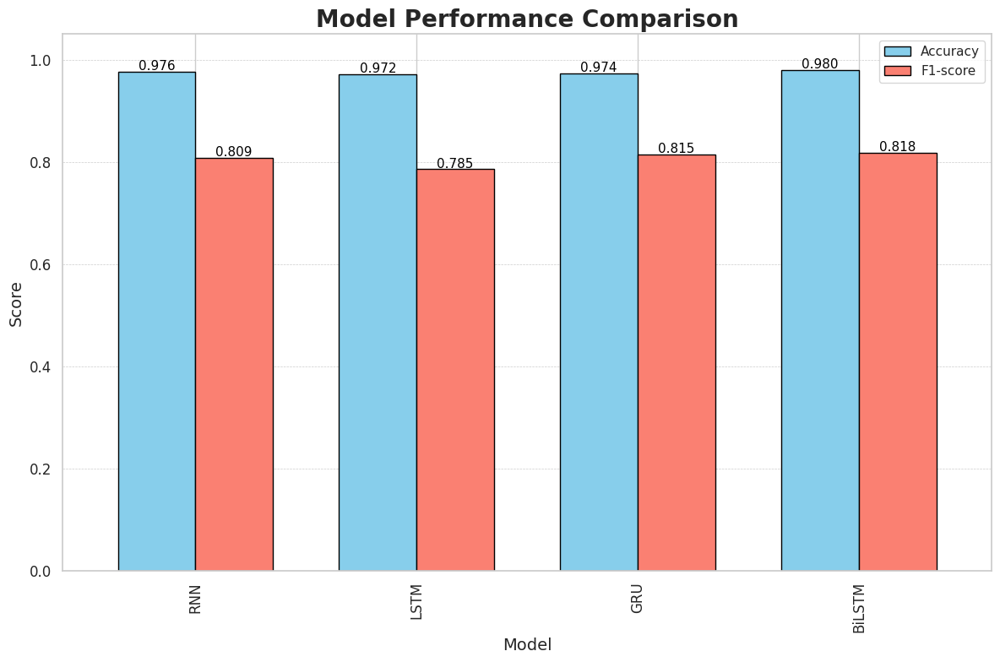

In [ ]:
#model comparison using chart

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

# Create a dictionary to store the metrics
metrics = {
    'Model': ['RNN', 'LSTM', 'GRU', 'BiLSTM'],
    'Accuracy': [acc_rnn, acc_lstm, acc_gru, acc_bilstm],
    'F1-score': [f1_rnn, f1_lstm, f1_gru, f1_bilstm]
}

# Create a Pandas DataFrame from the metrics dictionary
metrics_df = pd.DataFrame(metrics)

# Set plot style
sns.set_theme(style="whitegrid")

# Create figure and axes
fig, ax = plt.subplots(figsize=(12, 8))  # Bigger figure

# Plot the bar chart
metrics_df.plot(
    x='Model',
    y=['Accuracy', 'F1-score'],
    kind='bar',
    ax=ax,
    width=0.7,
    color=['skyblue', 'salmon'],
    edgecolor='black'
)

# Customize title and labels
ax.set_title('Model Performance Comparison', fontsize=20, weight='bold')
ax.set_ylabel('Score', fontsize=14)
ax.set_xlabel('Model', fontsize=14)
ax.set_ylim(0, 1.05)
ax.tick_params(axis='both', labelsize=12)

# Add grid
ax.yaxis.grid(True, linestyle='--', linewidth=0.5)

# Add value labels on bars
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.3f}',
                (p.get_x() + p.get_width() / 2., height + 0.01),
                ha='center', va='center', fontsize=11, color='black')

# Adjust layout
plt.tight_layout()
plt.show()


# Word2Vec Embedding Integration

We will use pre-trained Word2Vec embeddings (Google News vectors) for the embedding layer. If not available, we will train our own Word2Vec on the training data. Then, we will re-train all four models (RNN, LSTM, GRU, BiLSTM) using these embeddings and compare their results.

In [ ]:
!pip install gensim
#from gensim.models import Word2Vec
!pip uninstall numpy gensim -y
!pip install numpy gensim --no-cache-dir
!pip install --upgrade pip setuptools wheel
!pip install -U gensim numpy scipy


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.7/26.7 MB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 45.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 15.0 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.15.2
    Uninstalling scipy-1.15.2:
      Successfully uninstalled scipy-1.15.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
Found existing installation: numpy 1.2

In [ ]:
# Install gensim if not already installed
import gensim

In [ ]:
from gensim.models import Word2Vec
import numpy as np

# Ensure train_sentences and train_tags are defined (in case of kernel reset or out-of-order execution)
import ast

def parse_row(row):
    words = row['Sentence'].split()
    tags = ast.literal_eval(row['POS'])
    return words, tags

train_sentences = []
train_tags = []
for _, row in train_df.iterrows():
    words, tags = parse_row(row)
    train_sentences.append(words)
    train_tags.append(tags)

# If needed, also re-define test_sentences and test_tags
test_sentences = []
test_tags = []
for _, row in test_df.iterrows():
    words, tags = parse_row(row)
    test_sentences.append(words)
    test_tags.append(tags)

# Train Word2Vec on training sentences (since Google News vectors are too large for Colab and not available by default)
embedding_dim = 100
w2v_model = Word2Vec(sentences=train_sentences, vector_size=embedding_dim, window=5, min_count=1, workers=4, seed=42)

# Build embedding matrix
embedding_matrix = np.zeros((len(word2idx), embedding_dim))
for word, idx in word2idx.items():
    if word in w2v_model.wv:
        embedding_matrix[idx] = w2v_model.wv[word]
    else:
        embedding_matrix[idx] = np.random.normal(scale=0.6, size=(embedding_dim,))

## Model Definition with Word2Vec Embedding

We will define a new model builder that uses the pre-trained Word2Vec embedding matrix and freezes the embedding layer.

In [ ]:
from tensorflow.keras.layers import Input, Embedding, SimpleRNN, LSTM, GRU, Bidirectional, Dense, TimeDistributed, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

def build_model_w2v(cell_type='rnn', units=64, lr=0.001, dropout=0.2):
    model = Sequential()
    model.add(Embedding(input_dim=len(word2idx), output_dim=embedding_dim,
                        input_length=max_len,
                        weights=[embedding_matrix],
                        trainable=False))
    if cell_type == 'rnn':
        model.add(SimpleRNN(units, return_sequences=True, dropout=dropout))
    elif cell_type == 'lstm':
        model.add(LSTM(units, return_sequences=True, dropout=dropout))
    elif cell_type == 'gru':
        model.add(GRU(units, return_sequences=True, dropout=dropout))
    elif cell_type == 'bilstm':
        model.add(Bidirectional(LSTM(units, return_sequences=True, dropout=dropout)))
    model.add(TimeDistributed(Dense(len(tag2idx), activation='softmax')))
    model.compile(optimizer=Adam(learning_rate=lr), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

## Training All Models with Word2Vec Embedding -- 10 epocs

We will train RNN, LSTM, GRU, and BiLSTM models using the Word2Vec embedding for 10 epochs.


Training RNN with Word2Vec...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 46s 60ms/step - accuracy: 0.8038 - loss: 0.8339 - val_accuracy: 0.9183 - val_loss: 0.2775
Epoch 2/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 45s 10ms/step - accuracy: 0.9183 - loss: 0.2754 - val_accuracy: 0.9320 - val_loss: 0.2218
Epoch 3/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9283 - loss: 0.2311 - val_accuracy: 0.9381 - val_loss: 0.1973
Epoch 4/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9331 - loss: 0.2102 - val_accuracy: 0.9421 - val_loss: 0.1835
Epoch 5/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9364 - loss: 0.1978 - val_accuracy: 0.9450 - val_loss: 0.1731
Epoch 6/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9392 - loss: 0.1870 - val_accuracy: 0.9475 - val_loss: 0.1651
Epoch 7/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9414 - loss: 0.1801 - val_accuracy: 0.9489 - val_loss: 0.1600
Epoch 8/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9432 - loss: 0.1748 - val_ac

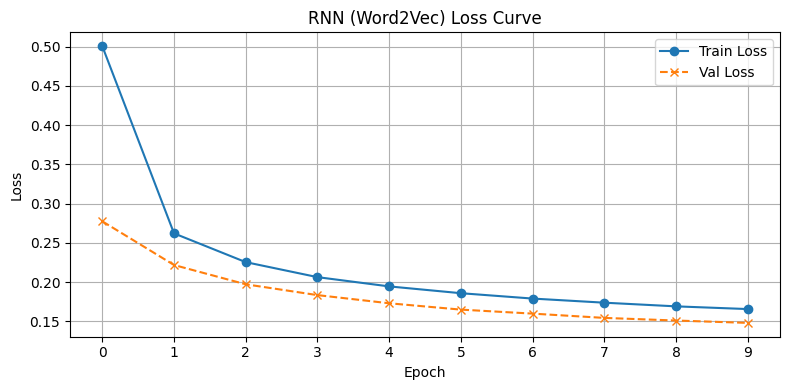


Training LSTM with Word2Vec...
Epoch 1/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - accuracy: 0.7826 - loss: 0.9871 - val_accuracy: 0.9122 - val_loss: 0.3142
Epoch 2/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 16s 19ms/step - accuracy: 0.9164 - loss: 0.2908 - val_accuracy: 0.9277 - val_loss: 0.2404
Epoch 3/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.9281 - loss: 0.2345 - val_accuracy: 0.9338 - val_loss: 0.2122
Epoch 4/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - accuracy: 0.9340 - loss: 0.2099 - val_accuracy: 0.9379 - val_loss: 0.1953
Epoch 5/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9387 - loss: 0.1929 - val_accuracy: 0.9411 - val_loss: 0.1842
Epoch 6/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9420 - loss: 0.1813 - val_accuracy: 0.9433 - val_loss: 0.1766
Epoch 7/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9445 - loss: 0.1725 - val_accuracy: 0.9448 - val_loss: 0.1701
Epoch 8/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - accura

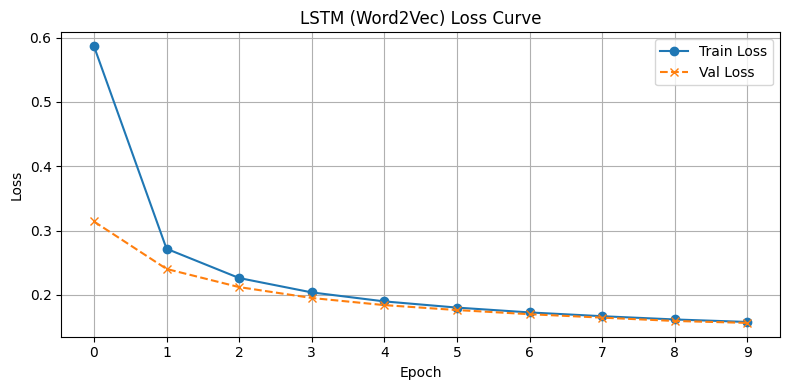


Training GRU with Word2Vec...
Epoch 1/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - accuracy: 0.8015 - loss: 0.8542 - val_accuracy: 0.9204 - val_loss: 0.2790
Epoch 2/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9230 - loss: 0.2628 - val_accuracy: 0.9319 - val_loss: 0.2216
Epoch 3/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step - accuracy: 0.9329 - loss: 0.2157 - val_accuracy: 0.9375 - val_loss: 0.1968
Epoch 4/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 11s 17ms/step - accuracy: 0.9382 - loss: 0.1943 - val_accuracy: 0.9420 - val_loss: 0.1814
Epoch 5/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9430 - loss: 0.1773 - val_accuracy: 0.9449 - val_loss: 0.1707
Epoch 6/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - accuracy: 0.9447 - loss: 0.1711 - val_accuracy: 0.9469 - val_loss: 0.1639
Epoch 7/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - accuracy: 0.9470 - loss: 0.1622 - val_accuracy: 0.9484 - val_loss: 0.1581
Epoch 8/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - accurac

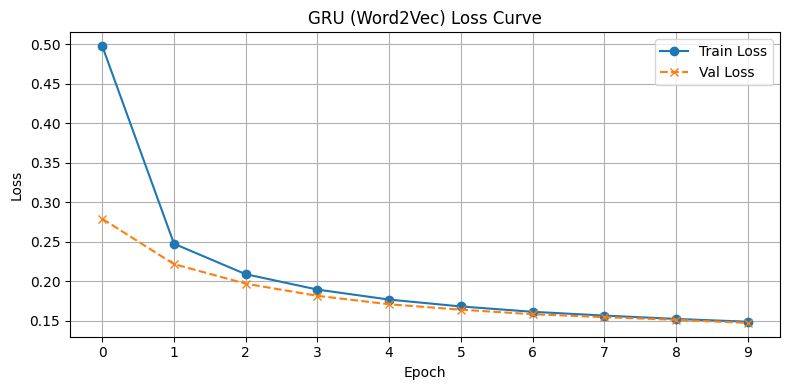


Training BILSTM with Word2Vec...
Epoch 1/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - accuracy: 0.8340 - loss: 0.7087 - val_accuracy: 0.9319 - val_loss: 0.2319
Epoch 2/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - accuracy: 0.9354 - loss: 0.2160 - val_accuracy: 0.9430 - val_loss: 0.1824
Epoch 3/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.9444 - loss: 0.1776 - val_accuracy: 0.9486 - val_loss: 0.1625
Epoch 4/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - accuracy: 0.9500 - loss: 0.1578 - val_accuracy: 0.9527 - val_loss: 0.1491
Epoch 5/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - accuracy: 0.9531 - loss: 0.1464 - val_accuracy: 0.9545 - val_loss: 0.1405
Epoch 6/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - accuracy: 0.9558 - loss: 0.1367 - val_accuracy: 0.9572 - val_loss: 0.1330
Epoch 7/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.9576 - loss: 0.1304 - val_accuracy: 0.9588 - val_loss: 0.1278
Epoch 8/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - 

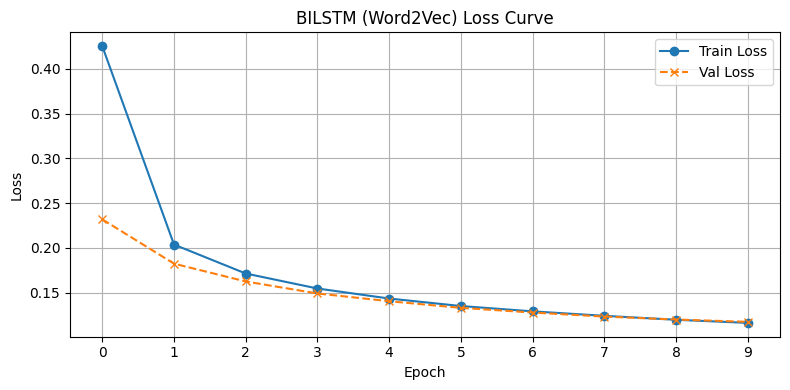

In [ ]:
results_w2v = {}
histories_w2v = {}
models_w2v = {}

params_w2v = {
    'batch_size': 32,
    'epochs': 10,
    'units': 64,
    'lr': 0.001,
    'dropout': 0.2
}

for cell in ['rnn', 'lstm', 'gru', 'bilstm']:
    print(f'\nTraining {cell.upper()} with Word2Vec...')

    model = build_model_w2v(cell_type=cell, units=params_w2v['units'], lr=params_w2v['lr'], dropout=params_w2v['dropout'])

    history = model.fit(
        X_train, y_train_cat,
        batch_size=params_w2v['batch_size'],
        epochs=params_w2v['epochs'],
        validation_split=0.2,
        verbose=1
    )

    models_w2v[cell] = model
    histories_w2v[cell] = history

    # Plot Train vs Validation Loss
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='x', linestyle='--')
    plt.title(f'{cell.upper()} (Word2Vec) Loss Curve')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.xticks(range(0, params_w2v['epochs']))
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

## Evaluation of Word2Vec Models

Evaluate each model trained with Word2Vec embedding on the test set and collect accuracy and F1-score.


Evaluating RNN (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Accuracy: 0.8119499194248172
F1-score: 0.8089779351609055
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.58      0.70      0.64        89
           ;       0.00      0.00      0.00        20
          CC       1.00      0.99      0.99      2403
          CD       0.78      0.69      0.73      2476
          DT       0.98      0.99      0.98      9928
          EX       0.81      0.97      0.88        61
          FW       0.00      0.00      0.00         0
          IN       0.97      0.96      0.97     12229
          JJ       0.60      0.51      0.56      7783
         JJR       0.86      0.71      0.78       278
         JJS       0.98      0.54      0.70       315
         LRB       1.00      0.97      0.99        75
          MD       0.96      0.99   

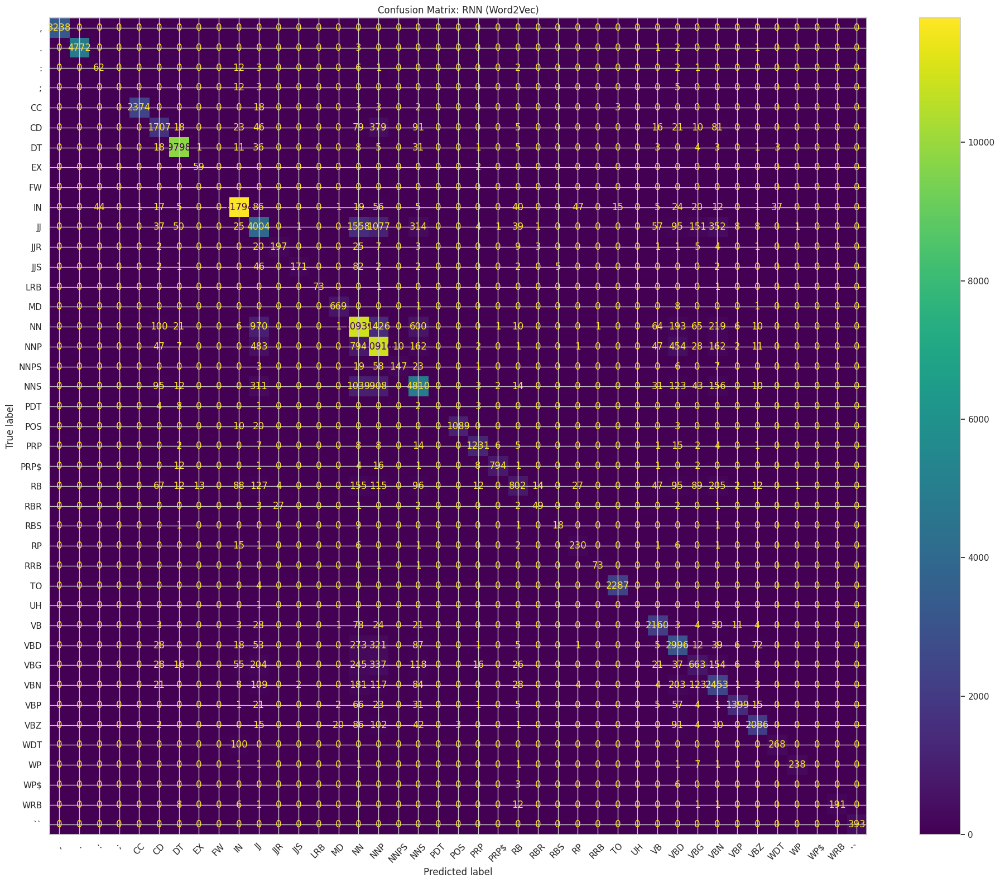


Evaluating LSTM (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Accuracy: 0.805532511371113
F1-score: 0.8026545765430844
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.59      0.49      0.54        89
           ;       0.00      0.00      0.00        20
          CC       1.00      0.98      0.99      2403
          CD       0.73      0.69      0.71      2476
          DT       0.98      0.98      0.98      9928
          EX       0.87      0.56      0.68        61
          FW       0.00      0.00      0.00         0
          IN       0.96      0.96      0.96     12229
          JJ       0.57      0.53      0.55      7783
         JJR       0.87      0.69      0.77       278
         JJS       0.95      0.56      0.71       315
         LRB       1.00      0.97      0.99        75
          MD       0.96      0.97   

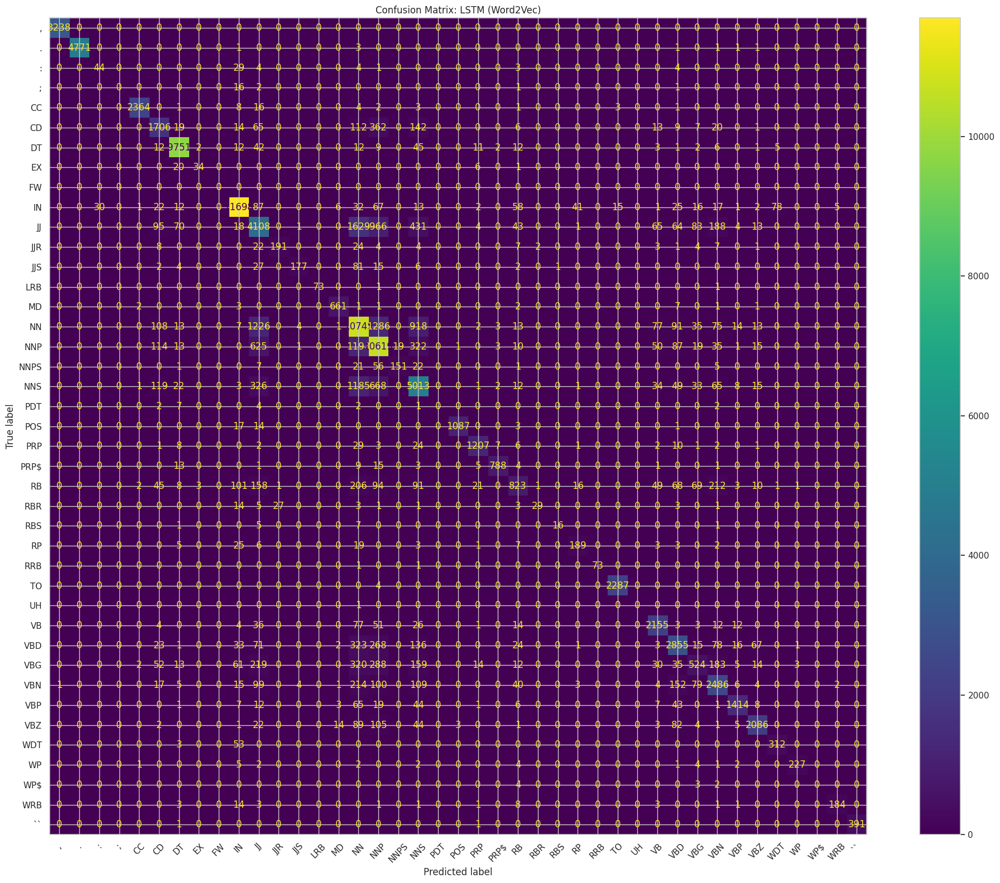


Evaluating GRU (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Accuracy: 0.8105100552106874
F1-score: 0.8088915228503282
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.61      0.39      0.48        89
           ;       0.00      0.00      0.00        20
          CC       0.99      0.99      0.99      2403
          CD       0.78      0.67      0.72      2476
          DT       0.98      0.98      0.98      9928
          EX       0.95      0.59      0.73        61
          FW       0.00      0.00      0.00         0
          IN       0.97      0.96      0.96     12229
          JJ       0.57      0.57      0.57      7783
         JJR       0.86      0.69      0.77       278
         JJS       0.99      0.56      0.72       315
         LRB       1.00      0.96      0.98        75
          MD       0.97      0.99   

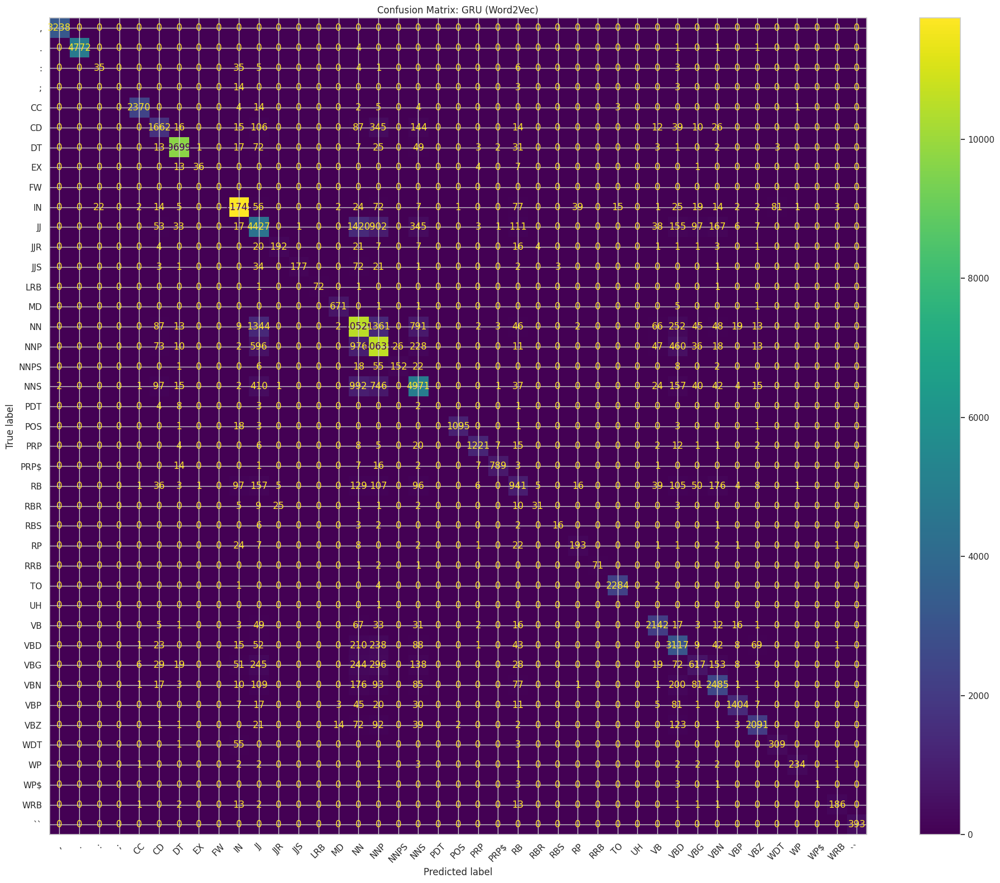


Evaluating BILSTM (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Accuracy: 0.8502636572551039
F1-score: 0.8485431599531353
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.81      0.62      0.70        89
           ;       0.00      0.00      0.00        20
          CC       1.00      0.99      0.99      2403
          CD       0.84      0.74      0.79      2476
          DT       0.99      0.99      0.99      9928
          EX       0.89      0.95      0.92        61
          FW       0.00      0.00      0.00         0
          IN       0.97      0.98      0.97     12229
          JJ       0.69      0.65      0.67      7783
         JJR       0.89      0.68      0.77       278
         JJS       0.97      0.68      0.80       315
         LRB       1.00      0.97      0.99        75
          MD       0.99      0.99

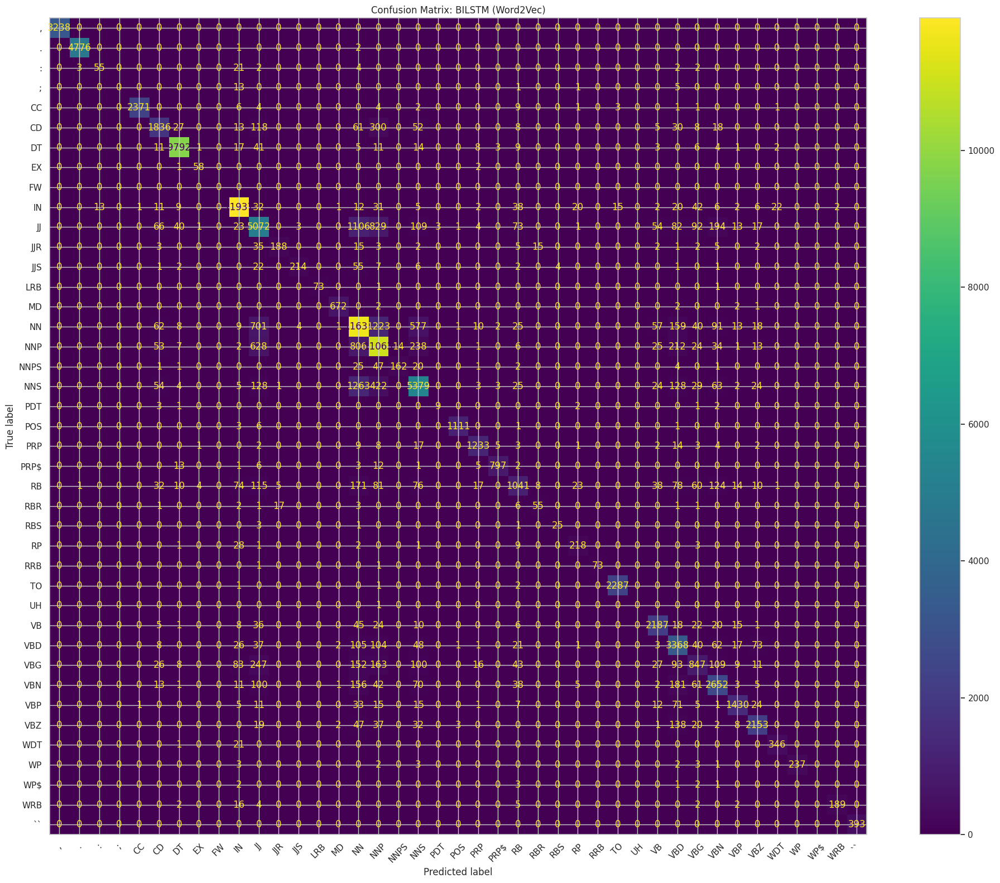

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix

acc_w2v = {}
f1_w2v = {}

for cell in ['rnn', 'lstm', 'gru', 'bilstm']:
    print(f'\nEvaluating {cell.upper()} (Word2Vec)...')
    model = models_w2v[cell]
    y_pred = model.predict(X_test)
    y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
    y_true_labels = y_test.flatten()
    padding_idx = tag2idx[list(tag2idx.keys())[0]]
    mask = y_true_labels != padding_idx
    y_true_labels = y_true_labels[mask]
    y_pred_labels = y_pred_labels[mask]
    acc = accuracy_score(y_true_labels, y_pred_labels)
    f1 = f1_score(y_true_labels, y_pred_labels, average='weighted')
    acc_w2v[cell] = acc
    f1_w2v[cell] = f1
    label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
    target_names = [idx2tag[i] for i in label_indices]
    report = classification_report(
        y_true_labels, y_pred_labels,
        labels=label_indices,
        target_names=target_names,
        zero_division=0
    )
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)
    print('Accuracy:', acc)
    print('F1-score:', f1)
    print('Classification Report:\n', report)
    fig, ax = plt.subplots(figsize=(20, 16), dpi=100)
    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names).plot(ax=ax, xticks_rotation=45)
    plt.title(f'Confusion Matrix: {cell.upper()} (Word2Vec)')
    plt.tight_layout()
    plt.show()

## Word2Vec Model Performance Comparison

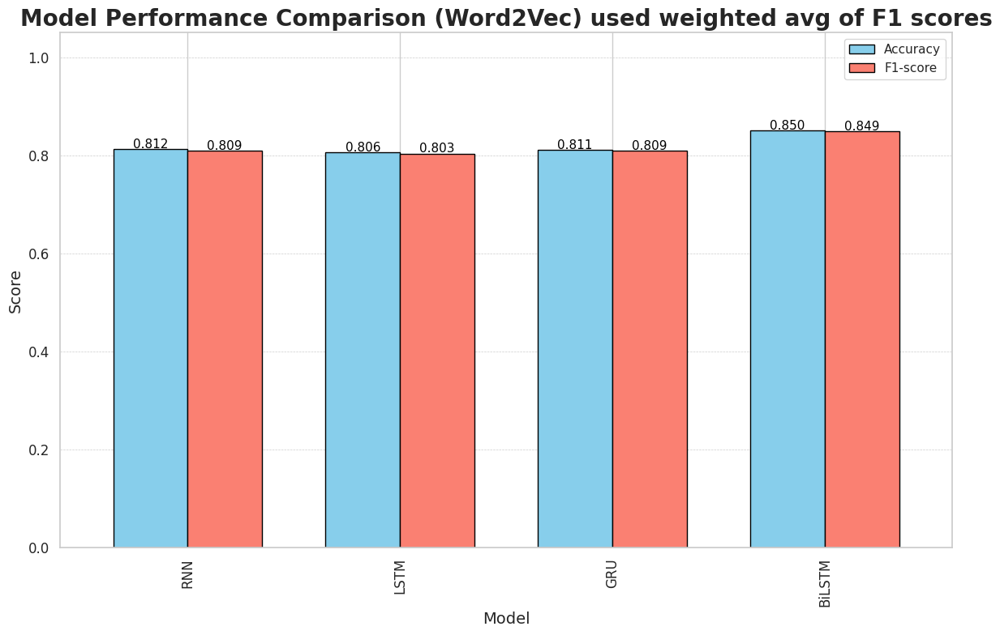

In [ ]:
import pandas as pd
import seaborn as sns

metrics_w2v = {
    'Model': ['RNN', 'LSTM', 'GRU', 'BiLSTM'],
    'Accuracy': [acc_w2v['rnn'], acc_w2v['lstm'], acc_w2v['gru'], acc_w2v['bilstm']],
    'F1-score': [f1_w2v['rnn'], f1_w2v['lstm'], f1_w2v['gru'], f1_w2v['bilstm']]
}
metrics_df_w2v = pd.DataFrame(metrics_w2v)
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(12, 8))
metrics_df_w2v.plot(
    x='Model',
    y=['Accuracy', 'F1-score'],
    kind='bar',
    ax=ax,
    width=0.7,
    color=['skyblue', 'salmon'],
    edgecolor='black'
)
ax.set_title('Model Performance Comparison (Word2Vec) used weighted avg of F1 scores', fontsize=20, weight='bold')
ax.set_ylabel('Score', fontsize=14)
ax.set_xlabel('Model', fontsize=14)
ax.set_ylim(0, 1.05)
ax.tick_params(axis='both', labelsize=12)
ax.yaxis.grid(True, linestyle='--', linewidth=0.5)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.3f}',
                (p.get_x() + p.get_width() / 2., height + 0.01),
                ha='center', va='center', fontsize=11, color='black')
plt.tight_layout()
plt.show()

# Using Macro avg to evaluate


Evaluating RNN (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Accuracy: 0.8119499194248172
F1-score: 0.7438950932497784
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.58      0.70      0.64        89
           ;       0.00      0.00      0.00        20
          CC       1.00      0.99      0.99      2403
          CD       0.78      0.69      0.73      2476
          DT       0.98      0.99      0.98      9928
          EX       0.81      0.97      0.88        61
          FW       0.00      0.00      0.00         0
          IN       0.97      0.96      0.97     12229
          JJ       0.60      0.51      0.56      7783
         JJR       0.86      0.71      0.78       278
         JJS       0.98      0.54      0.70       315
         LRB       1.00      0.97      0.99        75
          MD       0.96      0.99   

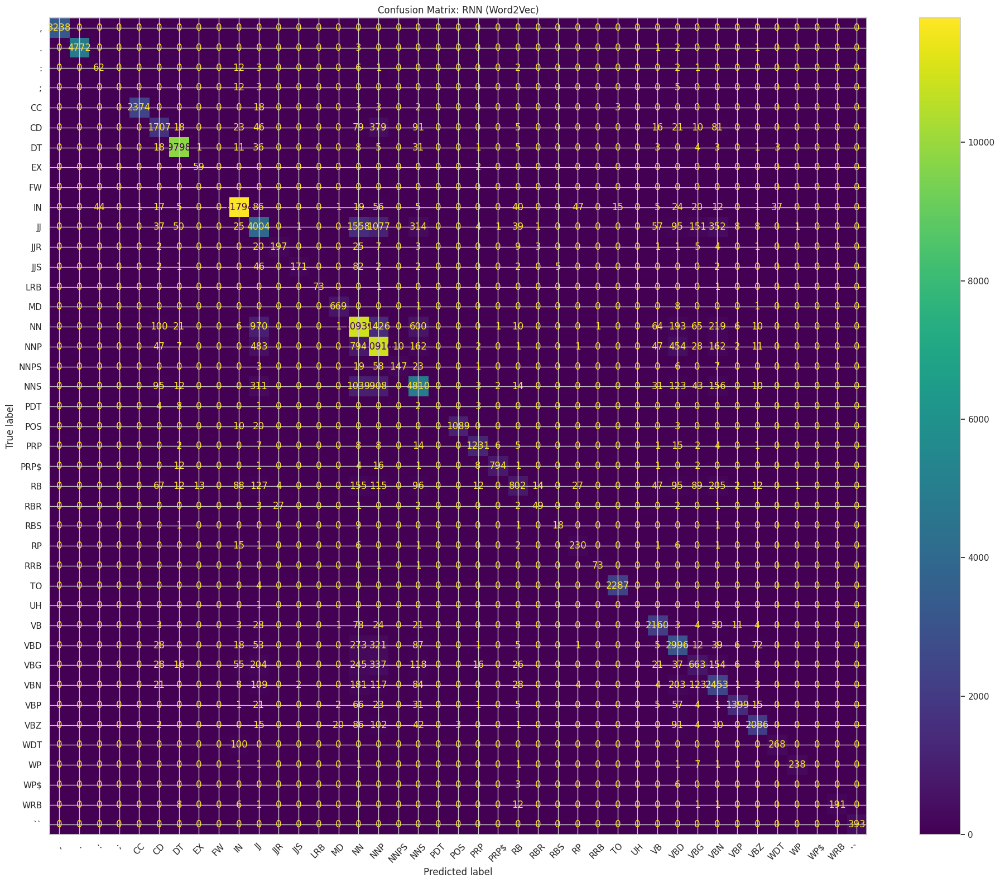


Evaluating LSTM (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Accuracy: 0.8059806810271667
F1-score: 0.7036815859413149
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.56      0.43      0.48        89
           ;       0.00      0.00      0.00        20
          CC       0.99      0.99      0.99      2403
          CD       0.74      0.68      0.71      2476
          DT       0.98      0.98      0.98      9928
          EX       0.77      0.56      0.65        61
          FW       0.00      0.00      0.00         0
          IN       0.96      0.96      0.96     12229
          JJ       0.57      0.52      0.55      7783
         JJR       0.87      0.72      0.79       278
         JJS       0.94      0.57      0.71       315
         LRB       1.00      0.97      0.99        75
          MD       0.97      0.98  

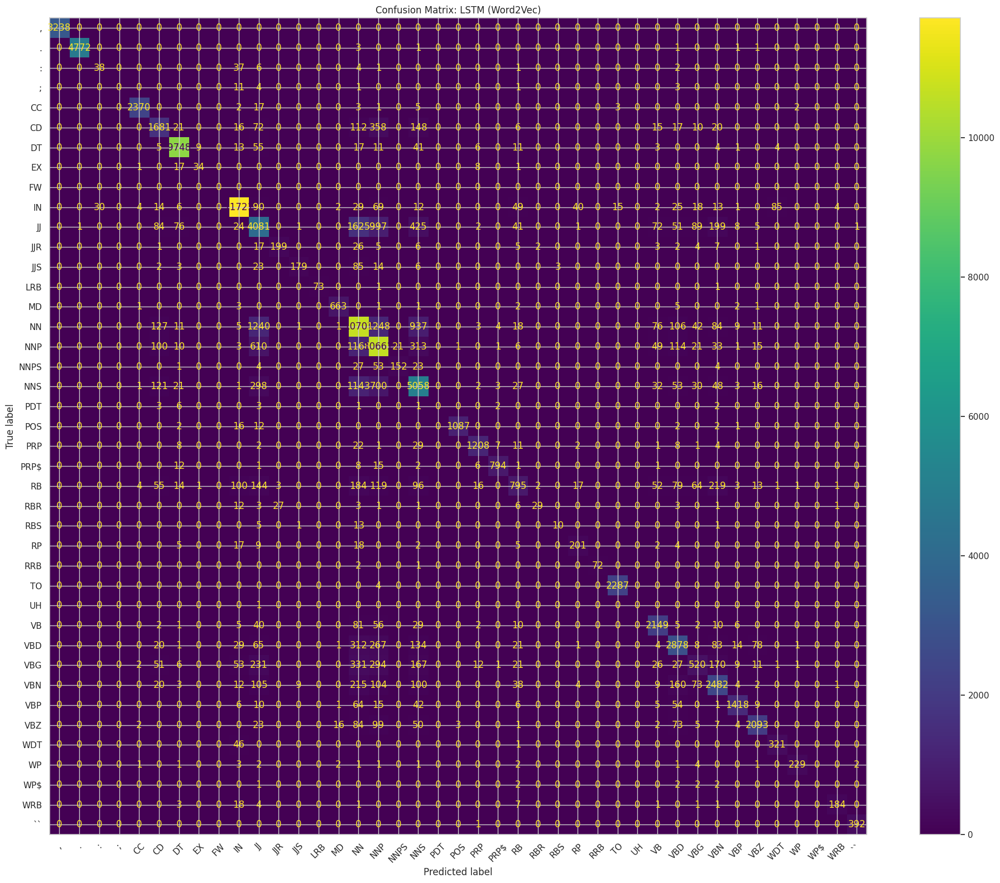


Evaluating GRU (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Accuracy: 0.8114063945227946
F1-score: 0.7115288825210041
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.58      0.45      0.51        89
           ;       0.00      0.00      0.00        20
          CC       1.00      0.99      0.99      2403
          CD       0.80      0.66      0.72      2476
          DT       0.98      0.98      0.98      9928
          EX       0.94      0.48      0.63        61
          FW       0.00      0.00      0.00         0
          IN       0.97      0.96      0.96     12229
          JJ       0.56      0.56      0.56      7783
         JJR       0.86      0.69      0.77       278
         JJS       0.97      0.56      0.71       315
         LRB       1.00      0.95      0.97        75
          MD       0.96      0.98   

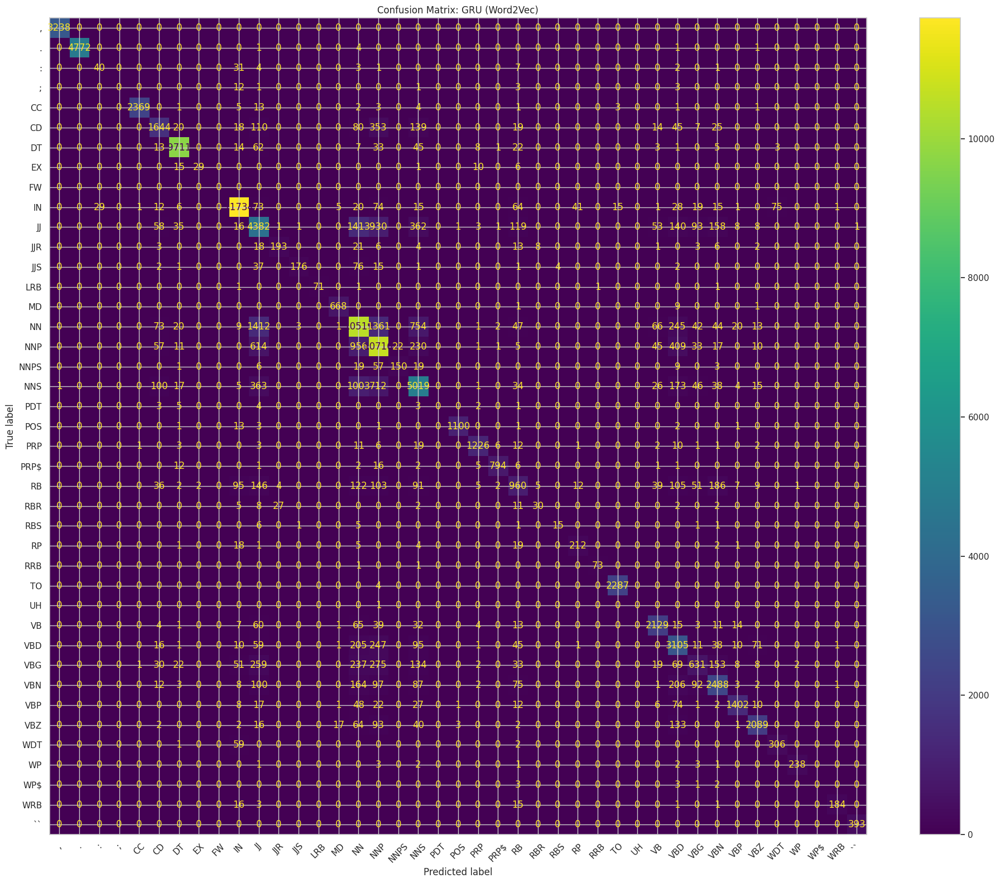


Evaluating BILSTM (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Accuracy: 0.8492433561232371
F1-score: 0.7710693938112126
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.84      0.63      0.72        89
           ;       1.00      0.05      0.10        20
          CC       1.00      0.99      0.99      2403
          CD       0.84      0.74      0.78      2476
          DT       0.99      0.98      0.99      9928
          EX       0.95      0.93      0.94        61
          FW       0.00      0.00      0.00         0
          IN       0.97      0.98      0.97     12229
          JJ       0.68      0.66      0.67      7783
         JJR       0.90      0.66      0.76       278
         JJS       0.96      0.63      0.76       315
         LRB       1.00      0.95      0.97        75
          MD       0.99      0.99

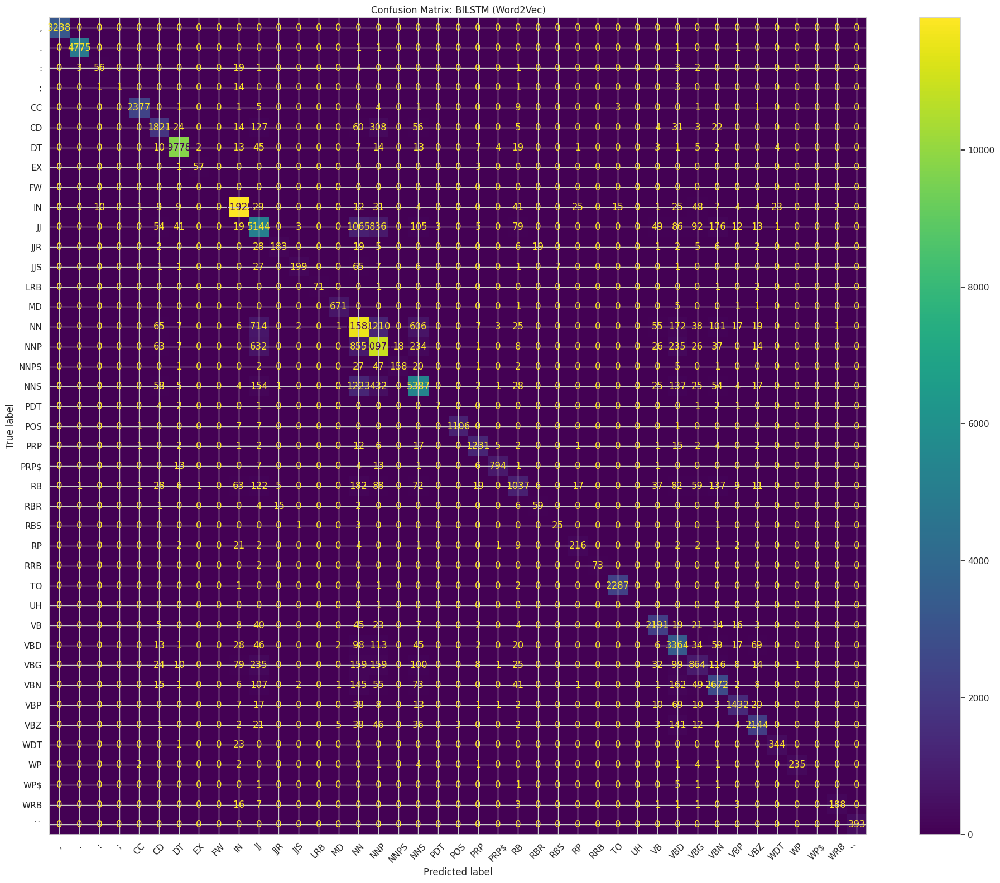

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix

acc_w2v = {}
f1_w2v = {}

for cell in ['rnn', 'lstm', 'gru', 'bilstm']:
    print(f'\nEvaluating {cell.upper()} (Word2Vec)...')
    model = models_w2v[cell]
    y_pred = model.predict(X_test)
    y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
    y_true_labels = y_test.flatten()
    padding_idx = tag2idx[list(tag2idx.keys())[0]]
    mask = y_true_labels != padding_idx
    y_true_labels = y_true_labels[mask]
    y_pred_labels = y_pred_labels[mask]
    acc = accuracy_score(y_true_labels, y_pred_labels)
    f1 = f1_score(y_true_labels, y_pred_labels, average='macro')
    acc_w2v[cell] = acc
    f1_w2v[cell] = f1
    label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
    target_names = [idx2tag[i] for i in label_indices]
    report = classification_report(
        y_true_labels, y_pred_labels,
        labels=label_indices,
        target_names=target_names,
        zero_division=0
    )
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)
    print('Accuracy:', acc)
    print('F1-score:', f1)
    print('Classification Report:\n', report)
    fig, ax = plt.subplots(figsize=(20, 16), dpi=100)
    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names).plot(ax=ax, xticks_rotation=45)
    plt.title(f'Confusion Matrix: {cell.upper()} (Word2Vec)')
    plt.tight_layout()
    plt.show()

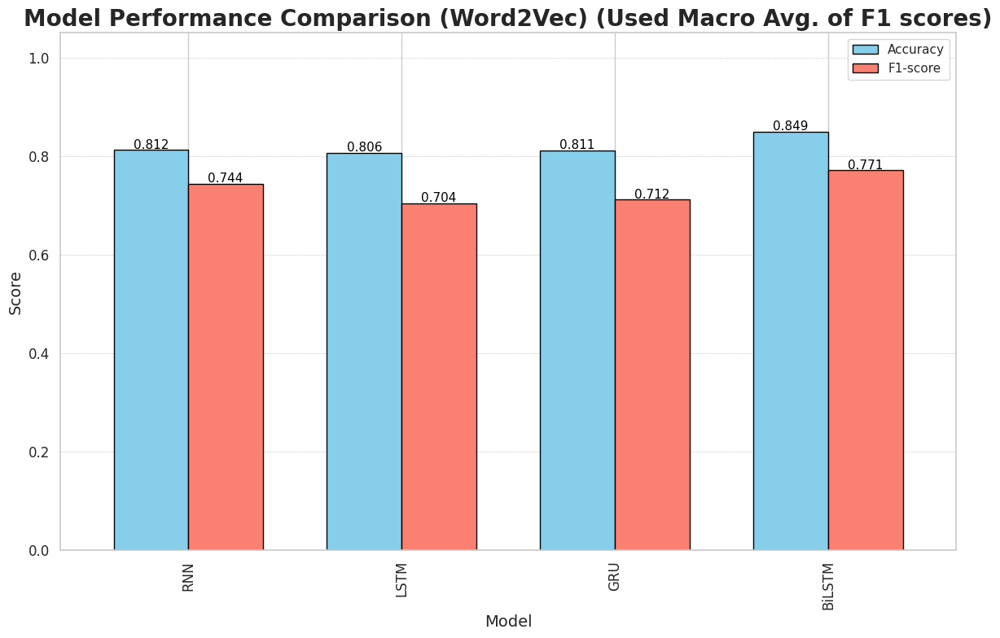

In [ ]:
import pandas as pd
import seaborn as sns

metrics_w2v = {
    'Model': ['RNN', 'LSTM', 'GRU', 'BiLSTM'],
    'Accuracy': [acc_w2v['rnn'], acc_w2v['lstm'], acc_w2v['gru'], acc_w2v['bilstm']],
    'F1-score': [f1_w2v['rnn'], f1_w2v['lstm'], f1_w2v['gru'], f1_w2v['bilstm']]
}
metrics_df_w2v = pd.DataFrame(metrics_w2v)
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(12, 8))
metrics_df_w2v.plot(
    x='Model',
    y=['Accuracy', 'F1-score'],
    kind='bar',
    ax=ax,
    width=0.7,
    color=['skyblue', 'salmon'],
    edgecolor='black'
)
ax.set_title('Model Performance Comparison (Word2Vec) (Used Macro Avg. of F1 scores) [epocs-10]', fontsize=14, weight='bold')
ax.set_ylabel('Score', fontsize=14)
ax.set_xlabel('Model', fontsize=14)
ax.set_ylim(0, 1.05)
ax.tick_params(axis='both', labelsize=12)
ax.yaxis.grid(True, linestyle='--', linewidth=0.5)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.3f}',
                (p.get_x() + p.get_width() / 2., height + 0.01),
                ha='center', va='center', fontsize=11, color='black')
plt.tight_layout()
plt.show()

# Hyperparamaeter changed, now with 20 epocs


Training RNN with Word2Vec...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 48s 57ms/step - accuracy: 0.7957 - loss: 0.8537 - val_accuracy: 0.9181 - val_loss: 0.2831
Epoch 2/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 43s 10ms/step - accuracy: 0.9174 - loss: 0.2807 - val_accuracy: 0.9309 - val_loss: 0.2237
Epoch 3/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9276 - loss: 0.2330 - val_accuracy: 0.9370 - val_loss: 0.1991
Epoch 4/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9319 - loss: 0.2143 - val_accuracy: 0.9415 - val_loss: 0.1847
Epoch 5/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9362 - loss: 0.1988 - val_accuracy: 0.9442 - val_loss: 0.1753
Epoch 6/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9389 - loss: 0.1898 - val_accuracy: 0.9467 - val_loss: 0.1671
Epoch 7/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9410 - loss: 0.1815 - val_accuracy: 0.9481 - val_loss: 0.1610
Epoch 8/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9427 - loss: 0.1764 - val_ac

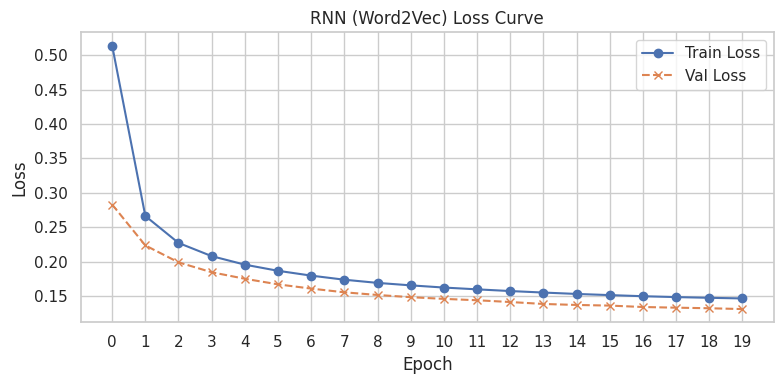


Training LSTM with Word2Vec...
Epoch 1/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - accuracy: 0.7969 - loss: 0.8948 - val_accuracy: 0.9125 - val_loss: 0.3133
Epoch 2/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9162 - loss: 0.2909 - val_accuracy: 0.9278 - val_loss: 0.2414
Epoch 3/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.9284 - loss: 0.2361 - val_accuracy: 0.9343 - val_loss: 0.2129
Epoch 4/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9348 - loss: 0.2092 - val_accuracy: 0.9384 - val_loss: 0.1957
Epoch 5/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - accuracy: 0.9385 - loss: 0.1947 - val_accuracy: 0.9412 - val_loss: 0.1844
Epoch 6/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9414 - loss: 0.1834 - val_accuracy: 0.9434 - val_loss: 0.1761
Epoch 7/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 11s 16ms/step - accuracy: 0.9443 - loss: 0.1732 - val_accuracy: 0.9452 - val_loss: 0.1693
Epoch 8/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accurac

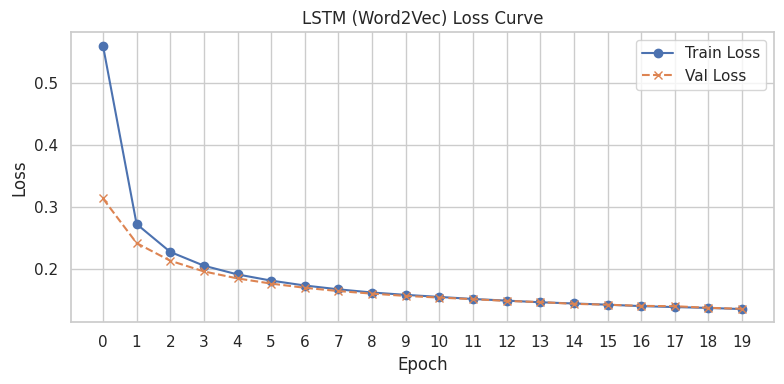


Training GRU with Word2Vec...
Epoch 1/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - accuracy: 0.7909 - loss: 0.9005 - val_accuracy: 0.9196 - val_loss: 0.2810
Epoch 2/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9229 - loss: 0.2629 - val_accuracy: 0.9323 - val_loss: 0.2226
Epoch 3/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9332 - loss: 0.2153 - val_accuracy: 0.9381 - val_loss: 0.1978
Epoch 4/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - accuracy: 0.9386 - loss: 0.1939 - val_accuracy: 0.9416 - val_loss: 0.1833
Epoch 5/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 17ms/step - accuracy: 0.9421 - loss: 0.1805 - val_accuracy: 0.9445 - val_loss: 0.1724
Epoch 6/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - accuracy: 0.9444 - loss: 0.1712 - val_accuracy: 0.9463 - val_loss: 0.1655
Epoch 7/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9469 - loss: 0.1630 - val_accuracy: 0.9474 - val_loss: 0.1599
Epoch 8/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 11s 19ms/step - accuracy

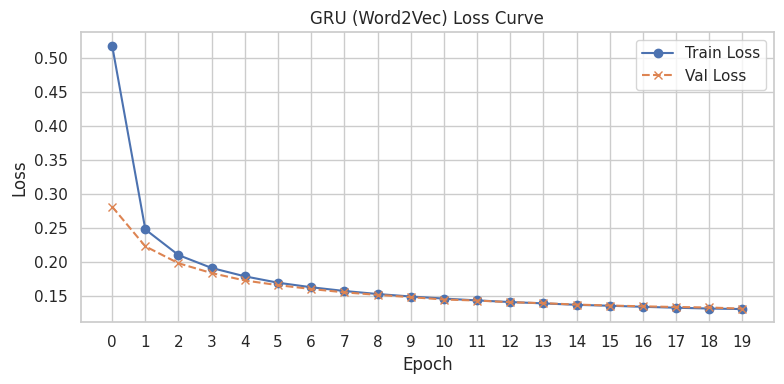


Training BILSTM with Word2Vec...
Epoch 1/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - accuracy: 0.8289 - loss: 0.7229 - val_accuracy: 0.9323 - val_loss: 0.2319
Epoch 2/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - accuracy: 0.9348 - loss: 0.2185 - val_accuracy: 0.9435 - val_loss: 0.1825
Epoch 3/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.9448 - loss: 0.1763 - val_accuracy: 0.9491 - val_loss: 0.1609
Epoch 4/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - accuracy: 0.9504 - loss: 0.1564 - val_accuracy: 0.9528 - val_loss: 0.1482
Epoch 5/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.9538 - loss: 0.1444 - val_accuracy: 0.9552 - val_loss: 0.1386
Epoch 6/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - accuracy: 0.9560 - loss: 0.1360 - val_accuracy: 0.9576 - val_loss: 0.1318
Epoch 7/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.9577 - loss: 0.1303 - val_accuracy: 0.9589 - val_loss: 0.1263
Epoch 8/20
480/480 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - 

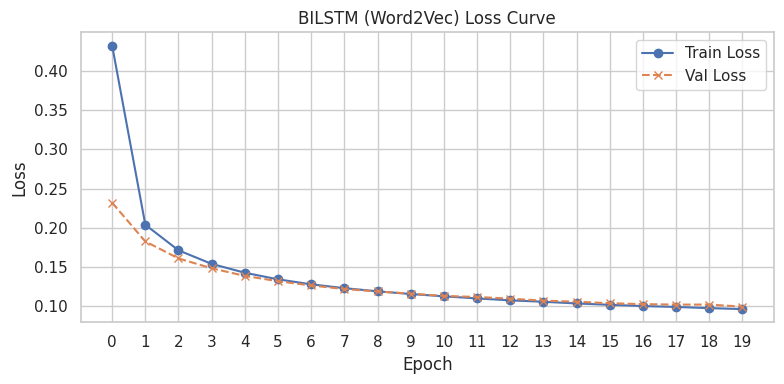

In [ ]:
results_w2v = {}
histories_w2v = {}
models_w2v = {}

params_w2v = {
    'batch_size': 32,
    'epochs': 20,
    'units': 64,
    'lr': 0.001,
    'dropout': 0.2
}

for cell in ['rnn', 'lstm', 'gru', 'bilstm']:
    print(f'\nTraining {cell.upper()} with Word2Vec...')

    model = build_model_w2v(cell_type=cell, units=params_w2v['units'], lr=params_w2v['lr'], dropout=params_w2v['dropout'])

    history = model.fit(
        X_train, y_train_cat,
        batch_size=params_w2v['batch_size'],
        epochs=params_w2v['epochs'],
        validation_split=0.2,
        verbose=1
    )

    models_w2v[cell] = model
    histories_w2v[cell] = history

    # Plot Train vs Validation Loss
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='x', linestyle='--')
    plt.title(f'{cell.upper()} (Word2Vec) Loss Curve')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.xticks(range(0, params_w2v['epochs']))
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


Evaluating RNN (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step
Accuracy: 0.829066186076227
F1-score: 0.7652594402717098
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.59      0.73      0.65        89
           ;       1.00      0.65      0.79        20
          CC       1.00      0.99      0.99      2403
          CD       0.85      0.71      0.77      2476
          DT       0.99      0.99      0.99      9928
          EX       0.88      0.95      0.91        61
          FW       0.00      0.00      0.00         0
          IN       0.98      0.96      0.97     12229
          JJ       0.66      0.55      0.60      7783
         JJR       0.87      0.72      0.79       278
         JJS       0.99      0.60      0.75       315
         LRB       1.00      0.97      0.99        75
          MD       1.00      0.99  

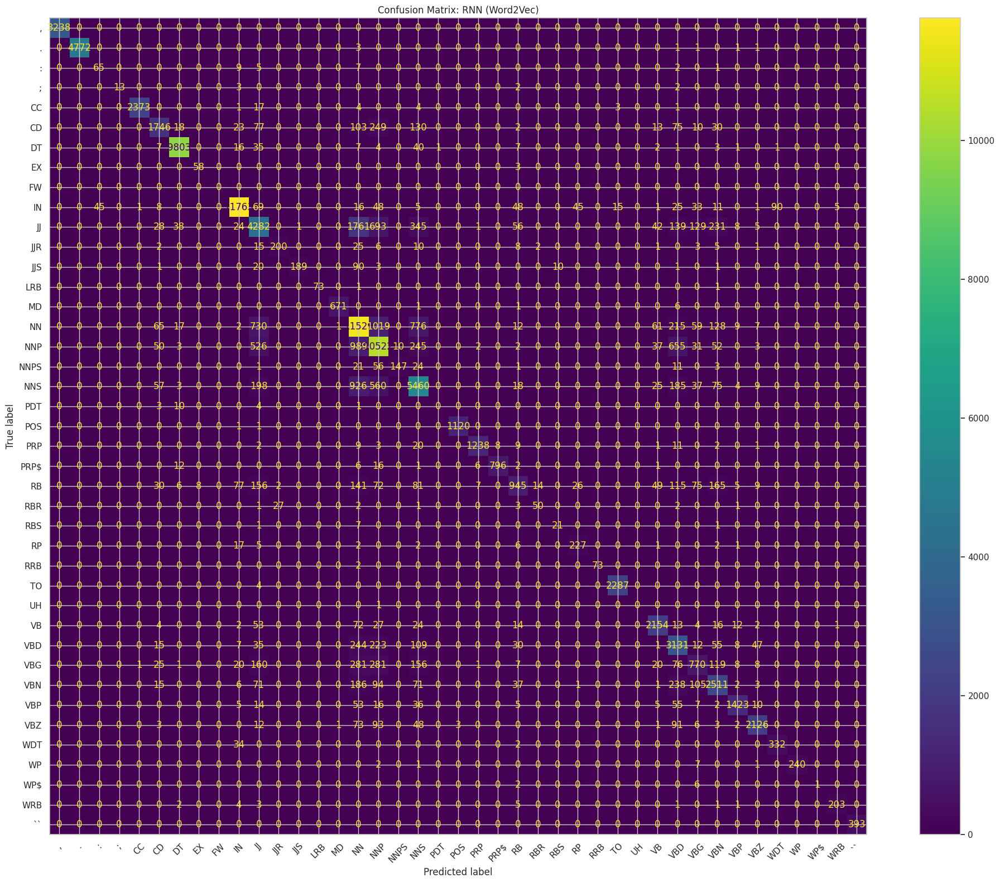


Evaluating LSTM (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step
Accuracy: 0.8251184788931163
F1-score: 0.746989811258841
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.56      0.38      0.45        89
           ;       0.91      0.50      0.65        20
          CC       1.00      0.99      0.99      2403
          CD       0.79      0.73      0.76      2476
          DT       0.99      0.98      0.98      9928
          EX       0.84      0.93      0.88        61
          FW       0.00      0.00      0.00         0
          IN       0.96      0.97      0.96     12229
          JJ       0.64      0.55      0.59      7783
         JJR       0.86      0.71      0.78       278
         JJS       0.92      0.64      0.76       315
         LRB       1.00      0.97      0.99        75
          MD       0.99      0.99  

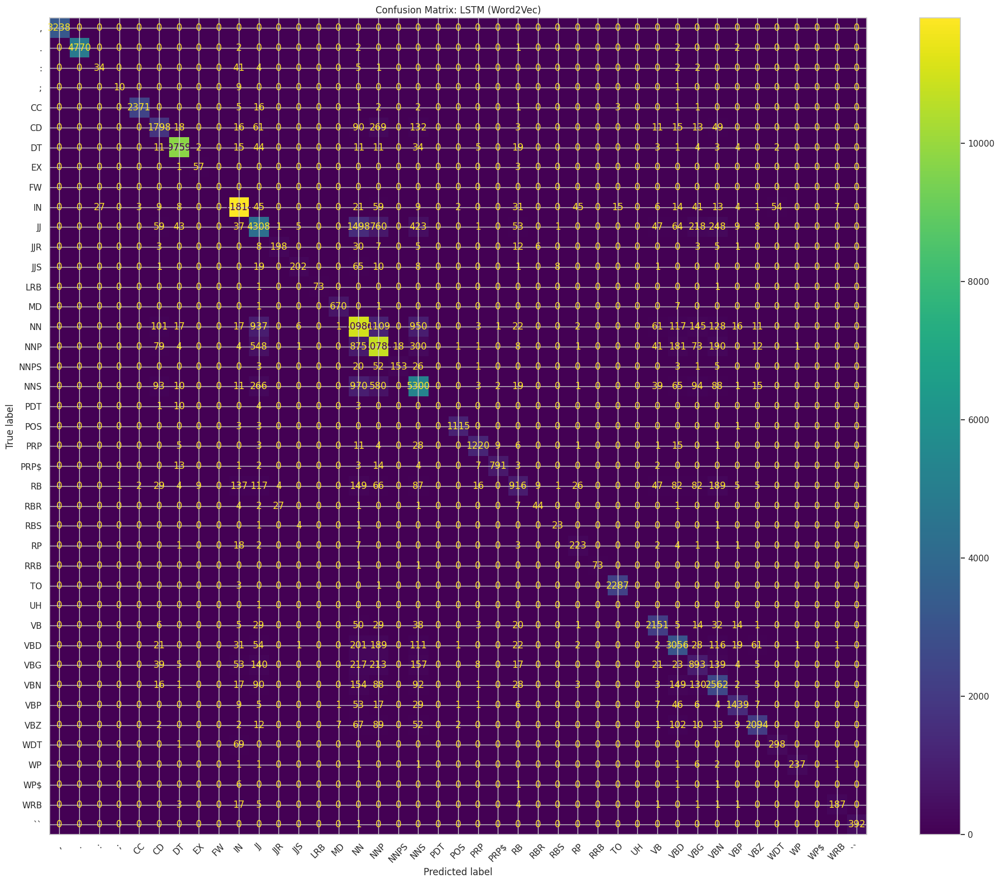


Evaluating GRU (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
Accuracy: 0.8270541903862841
F1-score: 0.7645197904119133
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.62      0.64      0.63        89
           ;       1.00      0.45      0.62        20
          CC       1.00      0.99      0.99      2403
          CD       0.80      0.73      0.76      2476
          DT       0.98      0.99      0.99      9928
          EX       0.85      0.90      0.87        61
          FW       0.00      0.00      0.00         0
          IN       0.97      0.96      0.97     12229
          JJ       0.61      0.59      0.60      7783
         JJR       0.87      0.71      0.78       278
         JJS       0.92      0.66      0.77       315
         LRB       1.00      0.97      0.99        75
          MD       0.99      0.99  

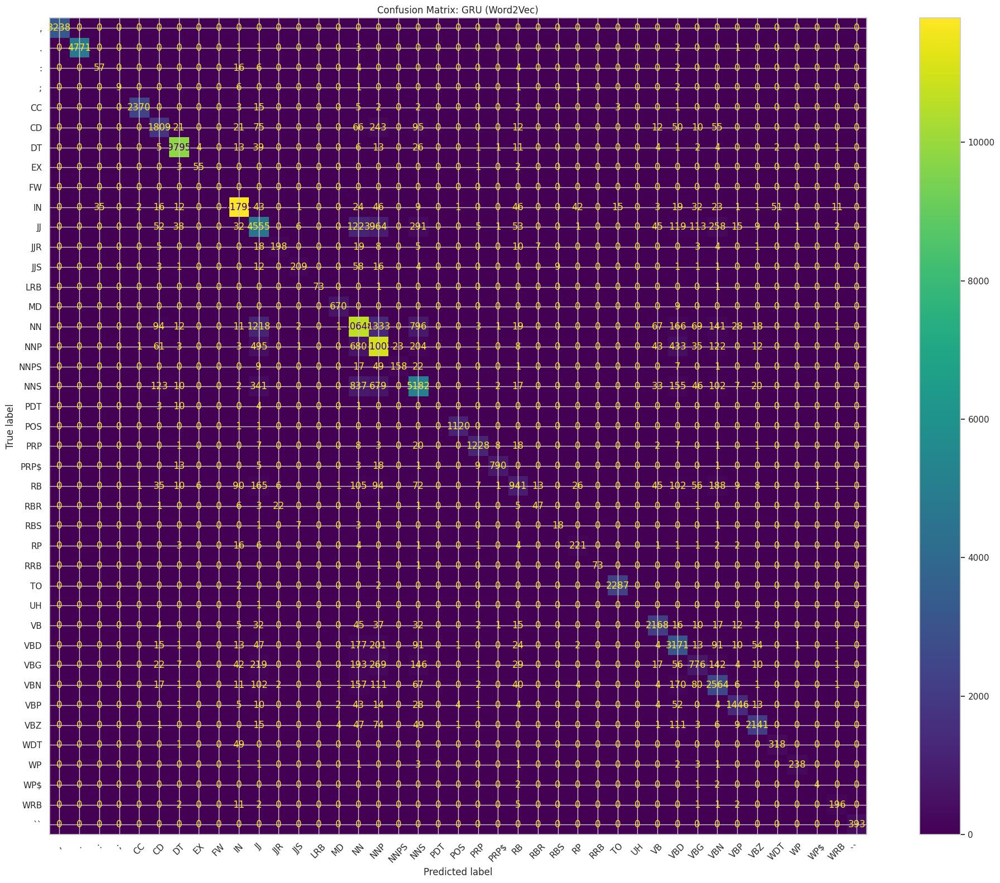


Evaluating BILSTM (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step
Accuracy: 0.8667982569061037
F1-score: 0.8432649510204598
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.82      0.65      0.72        89
           ;       0.89      0.40      0.55        20
          CC       1.00      0.99      0.99      2403
          CD       0.88      0.80      0.84      2476
          DT       0.99      0.99      0.99      9928
          EX       0.98      0.97      0.98        61
          FW       0.00      0.00      0.00         0
          IN       0.98      0.98      0.98     12229
          JJ       0.69      0.76      0.73      7783
         JJR       0.90      0.73      0.81       278
         JJS       0.95      0.73      0.83       315
         LRB       1.00      0.97      0.99        75
          MD       1.00      0.9

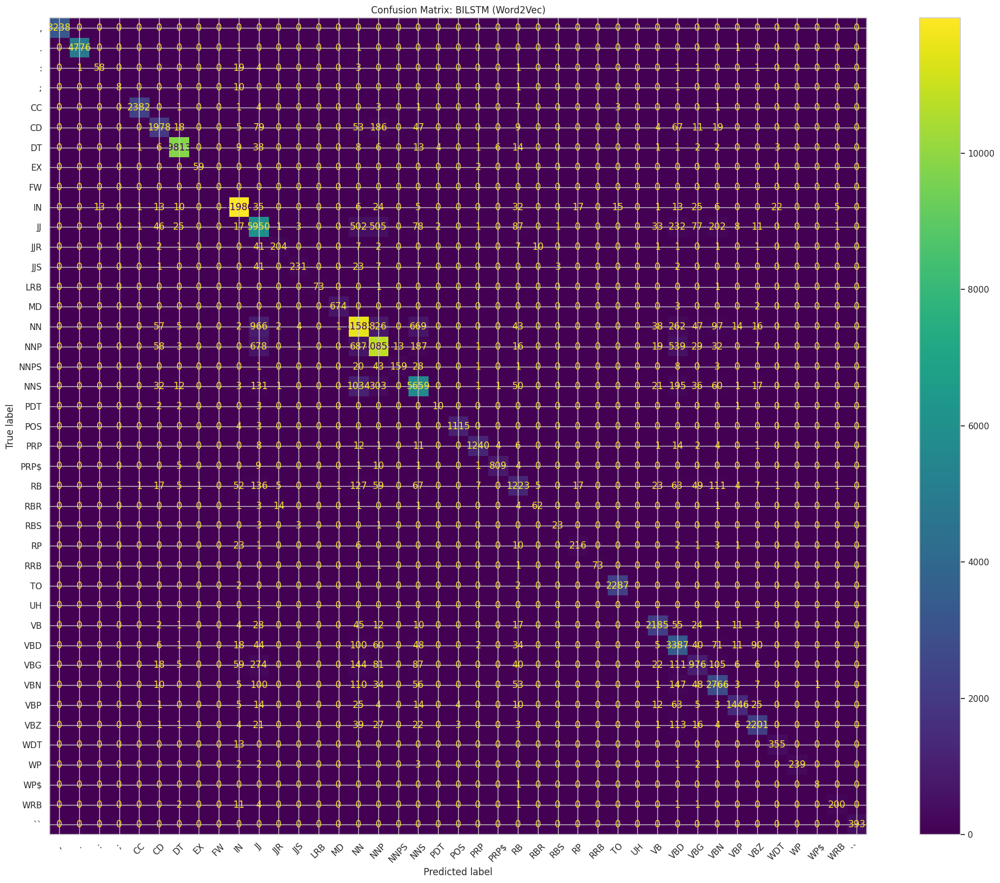

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix

acc_w2v = {}
f1_w2v = {}

for cell in ['rnn', 'lstm', 'gru', 'bilstm']:
    print(f'\nEvaluating {cell.upper()} (Word2Vec)...')
    model = models_w2v[cell]
    y_pred = model.predict(X_test)
    y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
    y_true_labels = y_test.flatten()
    padding_idx = tag2idx[list(tag2idx.keys())[0]]
    mask = y_true_labels != padding_idx
    y_true_labels = y_true_labels[mask]
    y_pred_labels = y_pred_labels[mask]
    acc = accuracy_score(y_true_labels, y_pred_labels)
    f1 = f1_score(y_true_labels, y_pred_labels, average='macro')
    acc_w2v[cell] = acc
    f1_w2v[cell] = f1
    label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
    target_names = [idx2tag[i] for i in label_indices]
    report = classification_report(
        y_true_labels, y_pred_labels,
        labels=label_indices,
        target_names=target_names,
        zero_division=0
    )
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)
    print('Accuracy:', acc)
    print('F1-score:', f1)
    print('Classification Report:\n', report)
    fig, ax = plt.subplots(figsize=(20, 16), dpi=100)
    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names).plot(ax=ax, xticks_rotation=45)
    plt.title(f'Confusion Matrix: {cell.upper()} (Word2Vec)')
    plt.tight_layout()
    plt.show()

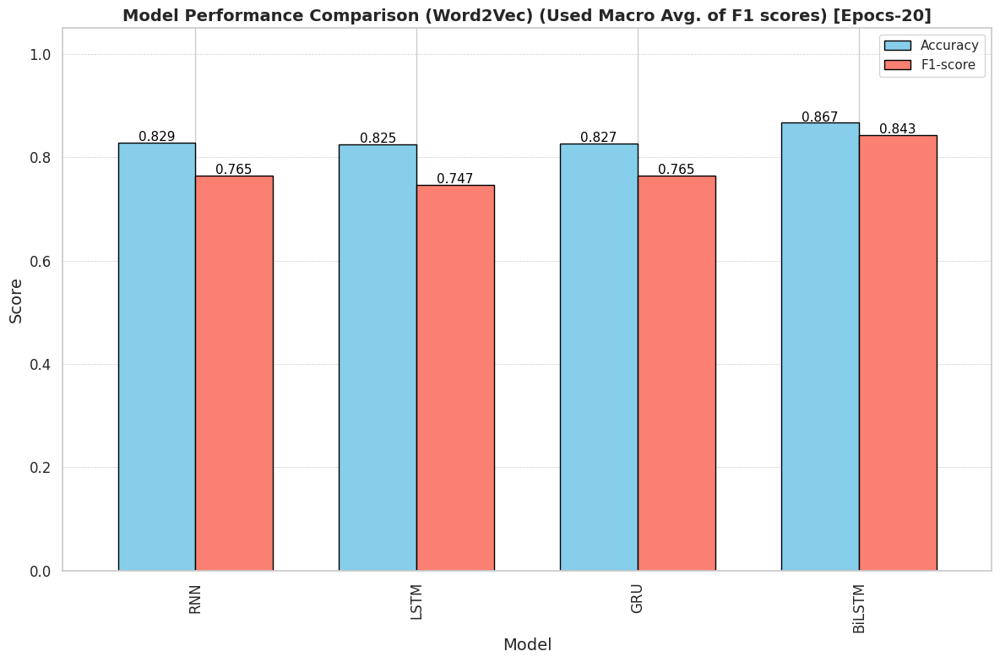

In [ ]:
import pandas as pd
import seaborn as sns

metrics_w2v = {
    'Model': ['RNN', 'LSTM', 'GRU', 'BiLSTM'],
    'Accuracy': [acc_w2v['rnn'], acc_w2v['lstm'], acc_w2v['gru'], acc_w2v['bilstm']],
    'F1-score': [f1_w2v['rnn'], f1_w2v['lstm'], f1_w2v['gru'], f1_w2v['bilstm']]
}
metrics_df_w2v = pd.DataFrame(metrics_w2v)
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(12, 8))
metrics_df_w2v.plot(
    x='Model',
    y=['Accuracy', 'F1-score'],
    kind='bar',
    ax=ax,
    width=0.7,
    color=['skyblue', 'salmon'],
    edgecolor='black'
)
ax.set_title('Model Performance Comparison (Word2Vec) (Used Macro Avg. of F1 scores) [Epocs-20]', fontsize=14, weight='bold')
ax.set_ylabel('Score', fontsize=14)
ax.set_xlabel('Model', fontsize=14)
ax.set_ylim(0, 1.05)
ax.tick_params(axis='both', labelsize=12)
ax.yaxis.grid(True, linestyle='--', linewidth=0.5)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.3f}',
                (p.get_x() + p.get_width() / 2., height + 0.01),
                ha='center', va='center', fontsize=11, color='black')
plt.tight_layout()
plt.show()

# now, with 50 epocs


Training RNN with Word2Vec...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 47s 59ms/step - accuracy: 0.8161 - loss: 0.7751 - val_accuracy: 0.9210 - val_loss: 0.2726
Epoch 2/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.9187 - loss: 0.2746 - val_accuracy: 0.9327 - val_loss: 0.2213
Epoch 3/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9287 - loss: 0.2308 - val_accuracy: 0.9374 - val_loss: 0.1985
Epoch 4/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9337 - loss: 0.2090 - val_accuracy: 0.9422 - val_loss: 0.1835
Epoch 5/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9365 - loss: 0.1977 - val_accuracy: 0.9450 - val_loss: 0.1739
Epoch 6/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9393 - loss: 0.1878 - val_accuracy: 0.9461 - val_loss: 0.1672
Epoch 7/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9410 - loss: 0.1811 - val_accuracy: 0.9481 - val_loss: 0.1611
Epoch 8/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9431 - loss: 0.1751 - val_acc

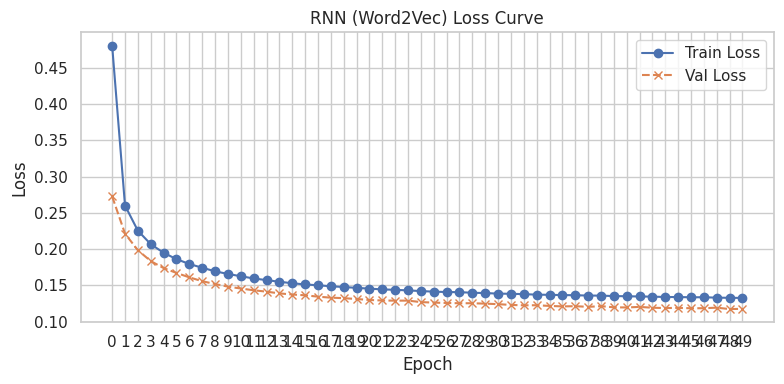


Training LSTM with Word2Vec...
Epoch 1/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 15s 19ms/step - accuracy: 0.8012 - loss: 0.9007 - val_accuracy: 0.9128 - val_loss: 0.3077
Epoch 2/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 17ms/step - accuracy: 0.9168 - loss: 0.2864 - val_accuracy: 0.9277 - val_loss: 0.2386
Epoch 3/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.9295 - loss: 0.2323 - val_accuracy: 0.9346 - val_loss: 0.2105
Epoch 4/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - accuracy: 0.9351 - loss: 0.2084 - val_accuracy: 0.9382 - val_loss: 0.1952
Epoch 5/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.9389 - loss: 0.1932 - val_accuracy: 0.9421 - val_loss: 0.1826
Epoch 6/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - accuracy: 0.9423 - loss: 0.1805 - val_accuracy: 0.9439 - val_loss: 0.1746
Epoch 7/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 11s 19ms/step - accuracy: 0.9446 - loss: 0.1722 - val_accuracy: 0.9462 - val_loss: 0.1676
Epoch 8/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 17ms/step - accurac

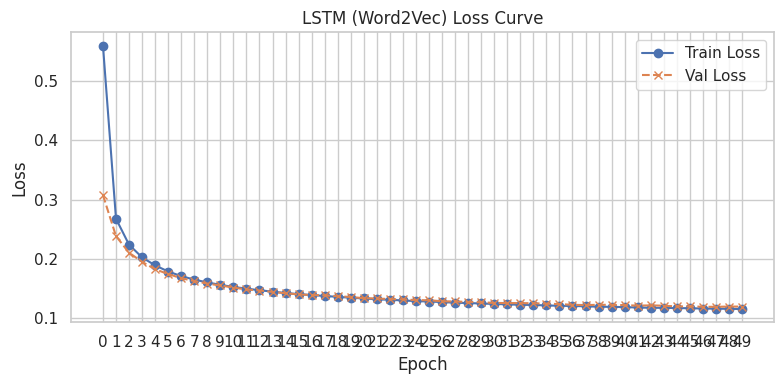


Training GRU with Word2Vec...
Epoch 1/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 14s 18ms/step - accuracy: 0.8151 - loss: 0.8199 - val_accuracy: 0.9197 - val_loss: 0.2758
Epoch 2/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.9240 - loss: 0.2576 - val_accuracy: 0.9329 - val_loss: 0.2178
Epoch 3/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - accuracy: 0.9344 - loss: 0.2106 - val_accuracy: 0.9380 - val_loss: 0.1951
Epoch 4/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9389 - loss: 0.1914 - val_accuracy: 0.9428 - val_loss: 0.1805
Epoch 5/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.9419 - loss: 0.1791 - val_accuracy: 0.9446 - val_loss: 0.1713
Epoch 6/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - accuracy: 0.9443 - loss: 0.1705 - val_accuracy: 0.9459 - val_loss: 0.1649
Epoch 7/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9464 - loss: 0.1627 - val_accuracy: 0.9470 - val_loss: 0.1596
Epoch 8/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - accuracy

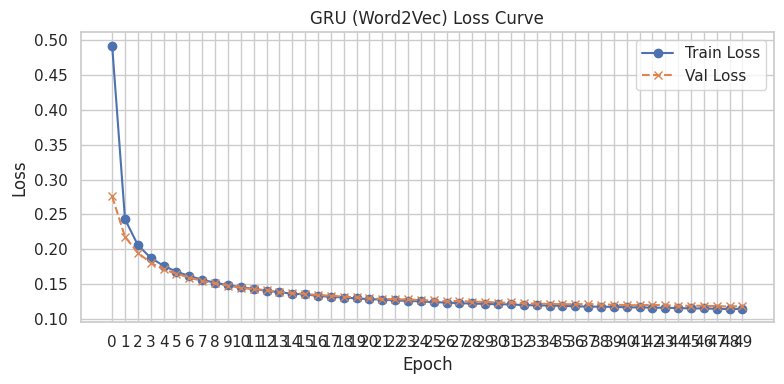


Training BILSTM with Word2Vec...
Epoch 1/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - accuracy: 0.8290 - loss: 0.7208 - val_accuracy: 0.9326 - val_loss: 0.2324
Epoch 2/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - accuracy: 0.9352 - loss: 0.2174 - val_accuracy: 0.9430 - val_loss: 0.1837
Epoch 3/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - accuracy: 0.9446 - loss: 0.1778 - val_accuracy: 0.9488 - val_loss: 0.1630
Epoch 4/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.9501 - loss: 0.1579 - val_accuracy: 0.9526 - val_loss: 0.1500
Epoch 5/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - accuracy: 0.9531 - loss: 0.1470 - val_accuracy: 0.9546 - val_loss: 0.1407
Epoch 6/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.9556 - loss: 0.1376 - val_accuracy: 0.9565 - val_loss: 0.1336
Epoch 7/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - accuracy: 0.9575 - loss: 0.1316 - val_accuracy: 0.9579 - val_loss: 0.1294
Epoch 8/50
480/480 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - 

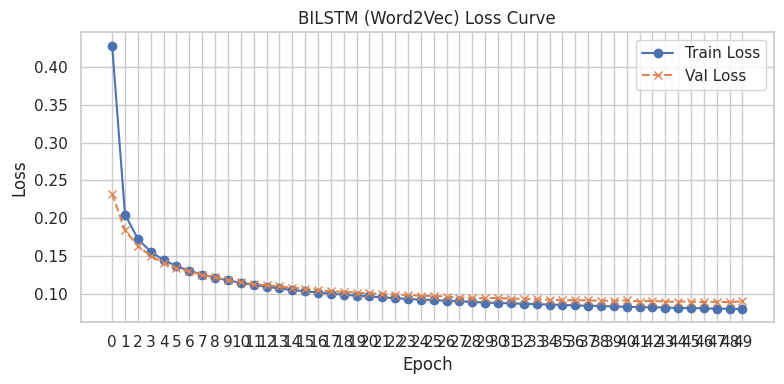

In [ ]:
results_w2v = {}
histories_w2v = {}
models_w2v = {}

params_w2v = {
    'batch_size': 32,
    'epochs': 50,
    'units': 64,
    'lr': 0.001,
    'dropout': 0.2
}

for cell in ['rnn', 'lstm', 'gru', 'bilstm']:
    print(f'\nTraining {cell.upper()} with Word2Vec...')

    model = build_model_w2v(cell_type=cell, units=params_w2v['units'], lr=params_w2v['lr'], dropout=params_w2v['dropout'])

    history = model.fit(
        X_train, y_train_cat,
        batch_size=params_w2v['batch_size'],
        epochs=params_w2v['epochs'],
        validation_split=0.2,
        verbose=1
    )

    models_w2v[cell] = model
    histories_w2v[cell] = history

    # Plot Train vs Validation Loss
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='x', linestyle='--')
    plt.title(f'{cell.upper()} (Word2Vec) Loss Curve')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.xticks(range(0, params_w2v['epochs']))
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


Evaluating RNN (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step
Accuracy: 0.8413097996586282
F1-score: 0.8160414472116526
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.60      0.83      0.69        89
           ;       1.00      0.90      0.95        20
          CC       0.99      0.99      0.99      2403
          CD       0.90      0.73      0.81      2476
          DT       0.99      0.99      0.99      9928
          EX       0.85      1.00      0.92        61
          FW       0.00      0.00      0.00         0
          IN       0.97      0.97      0.97     12229
          JJ       0.64      0.65      0.64      7783
         JJR       0.86      0.75      0.80       278
         JJS       0.95      0.77      0.85       315
         LRB       1.00      0.97      0.99        75
          MD       1.00      0.99 

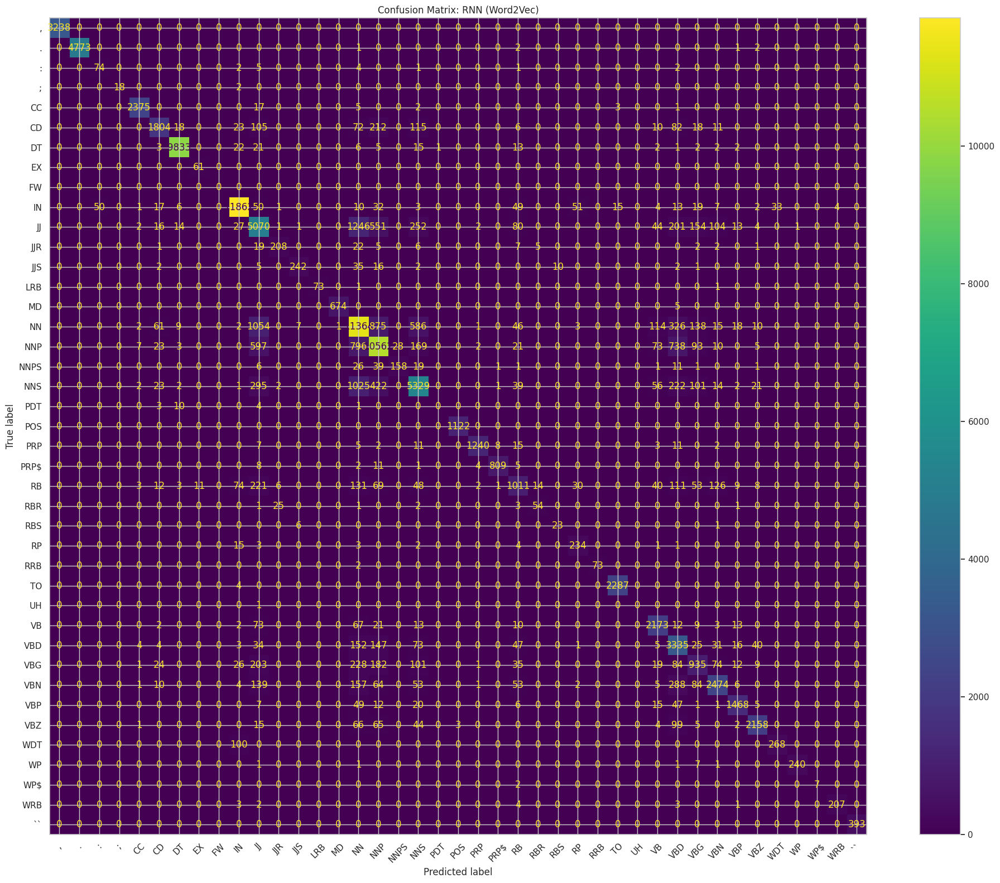


Evaluating LSTM (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step
Accuracy: 0.8412907286094344
F1-score: 0.7870273378950375
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.59      0.52      0.55        89
           ;       0.88      0.75      0.81        20
          CC       0.99      0.99      0.99      2403
          CD       0.86      0.78      0.82      2476
          DT       0.98      0.99      0.99      9928
          EX       0.90      0.92      0.91        61
          FW       0.00      0.00      0.00         0
          IN       0.97      0.97      0.97     12229
          JJ       0.59      0.64      0.61      7783
         JJR       0.89      0.74      0.81       278
         JJS       0.89      0.78      0.83       315
         LRB       1.00      0.97      0.99        75
          MD       0.99      0.99 

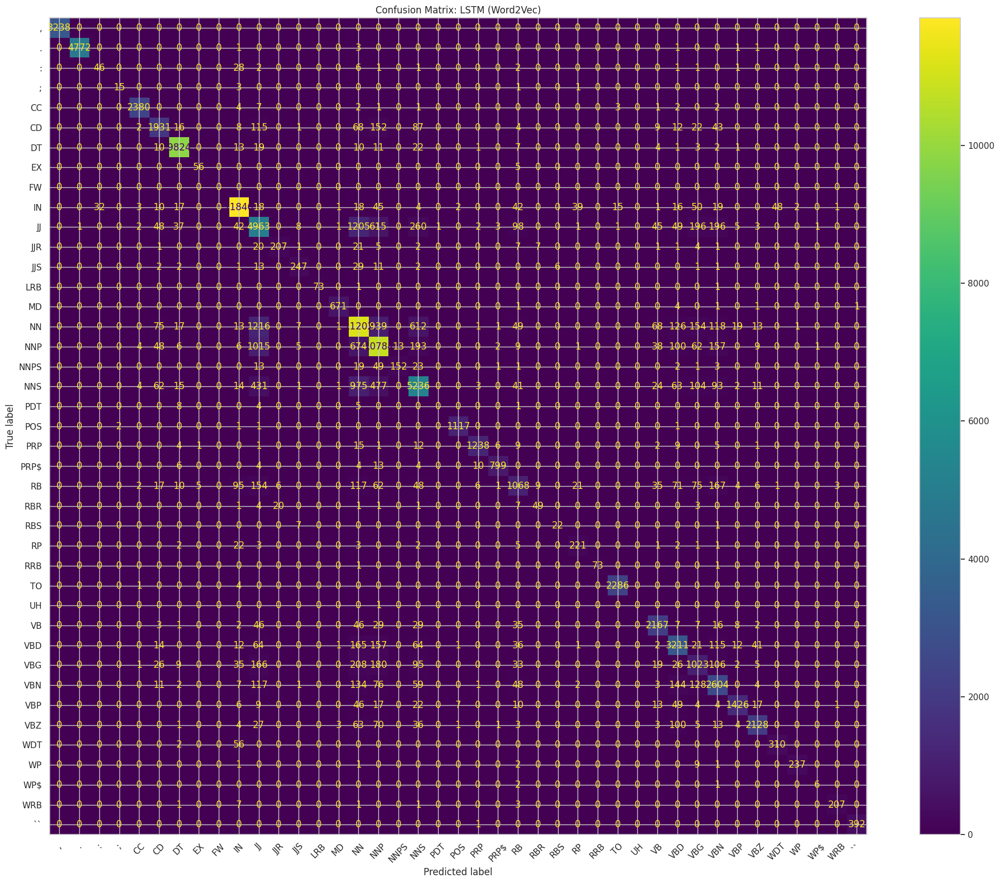


Evaluating GRU (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step
Accuracy: 0.8400987880348237
F1-score: 0.7878281329510349
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.58      0.28      0.38        89
           ;       0.93      0.70      0.80        20
          CC       0.99      0.99      0.99      2403
          CD       0.88      0.74      0.81      2476
          DT       0.99      0.99      0.99      9928
          EX       0.82      0.97      0.89        61
          FW       0.00      0.00      0.00         0
          IN       0.97      0.97      0.97     12229
          JJ       0.65      0.59      0.62      7783
         JJR       0.85      0.77      0.81       278
         JJS       0.92      0.74      0.82       315
         LRB       0.99      0.96      0.97        75
          MD       0.99      0.99  

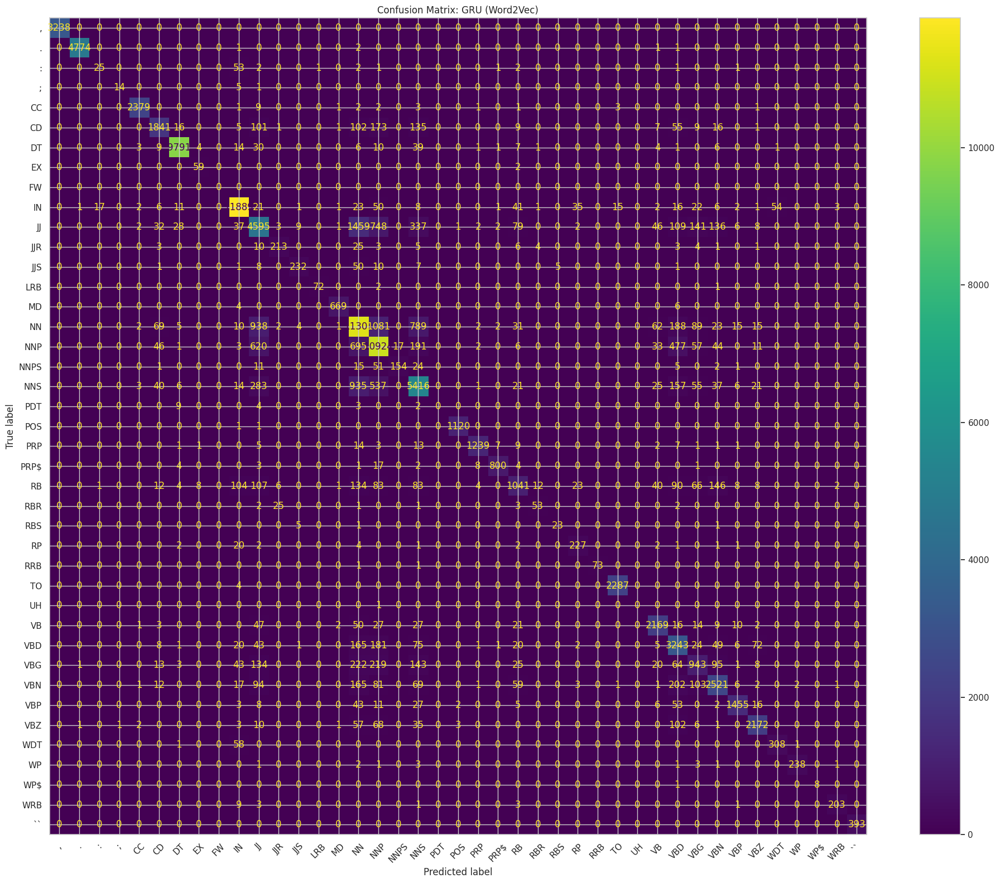


Evaluating BILSTM (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step
Accuracy: 0.8774589734054219
F1-score: 0.8438633670884131
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.79      0.60      0.68        89
           ;       1.00      0.95      0.97        20
          CC       1.00      0.99      1.00      2403
          CD       0.92      0.82      0.87      2476
          DT       0.99      0.99      0.99      9928
          EX       0.98      0.98      0.98        61
          FW       0.00      0.00      0.00         0
          IN       0.98      0.98      0.98     12229
          JJ       0.65      0.83      0.73      7783
         JJR       0.88      0.79      0.83       278
         JJS       0.92      0.82      0.87       315
         LRB       1.00      0.97      0.99        75
          MD       1.00      0.9

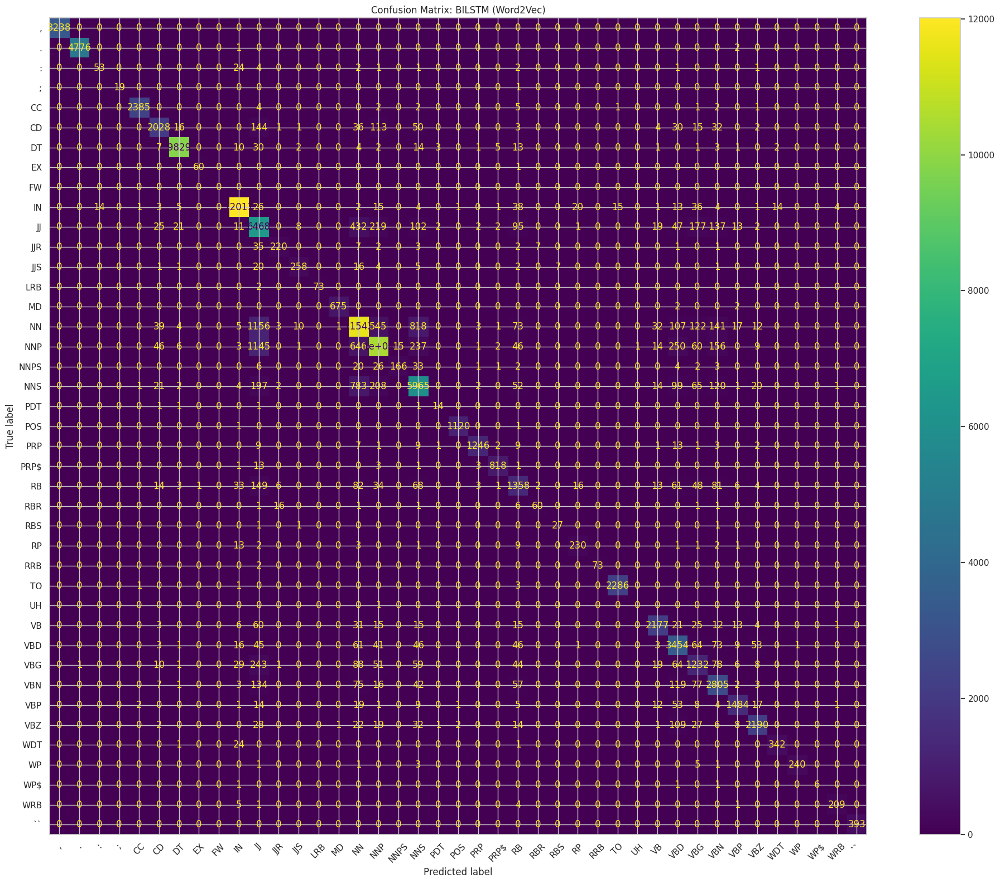

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix

acc_w2v = {}
f1_w2v = {}

for cell in ['rnn', 'lstm', 'gru', 'bilstm']:
    print(f'\nEvaluating {cell.upper()} (Word2Vec)...')
    model = models_w2v[cell]
    y_pred = model.predict(X_test)
    y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
    y_true_labels = y_test.flatten()
    padding_idx = tag2idx[list(tag2idx.keys())[0]]
    mask = y_true_labels != padding_idx
    y_true_labels = y_true_labels[mask]
    y_pred_labels = y_pred_labels[mask]
    acc = accuracy_score(y_true_labels, y_pred_labels)
    f1 = f1_score(y_true_labels, y_pred_labels, average='macro')
    acc_w2v[cell] = acc
    f1_w2v[cell] = f1
    label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
    target_names = [idx2tag[i] for i in label_indices]
    report = classification_report(
        y_true_labels, y_pred_labels,
        labels=label_indices,
        target_names=target_names,
        zero_division=0
    )
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)
    print('Accuracy:', acc)
    print('F1-score:', f1)
    print('Classification Report:\n', report)
    fig, ax = plt.subplots(figsize=(20, 16), dpi=100)
    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names).plot(ax=ax, xticks_rotation=45)
    plt.title(f'Confusion Matrix: {cell.upper()} (Word2Vec)')
    plt.tight_layout()
    plt.show()

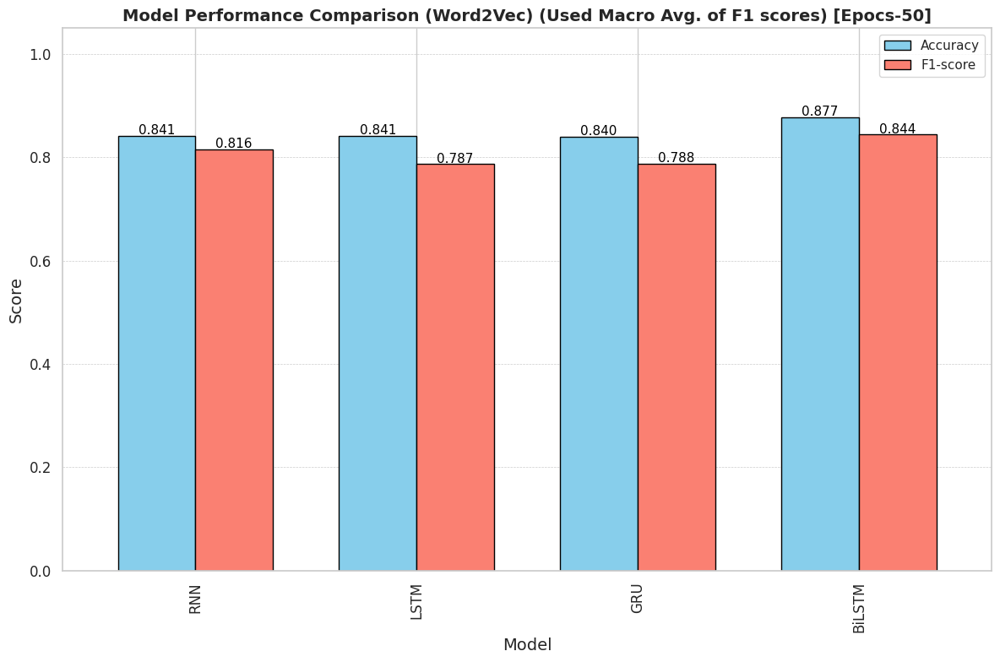

In [ ]:
import pandas as pd
import seaborn as sns

metrics_w2v = {
    'Model': ['RNN', 'LSTM', 'GRU', 'BiLSTM'],
    'Accuracy': [acc_w2v['rnn'], acc_w2v['lstm'], acc_w2v['gru'], acc_w2v['bilstm']],
    'F1-score': [f1_w2v['rnn'], f1_w2v['lstm'], f1_w2v['gru'], f1_w2v['bilstm']]
}
metrics_df_w2v = pd.DataFrame(metrics_w2v)
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(12, 8))
metrics_df_w2v.plot(
    x='Model',
    y=['Accuracy', 'F1-score'],
    kind='bar',
    ax=ax,
    width=0.7,
    color=['skyblue', 'salmon'],
    edgecolor='black'
)
ax.set_title('Model Performance Comparison (Word2Vec) (Used Macro Avg. of F1 scores) [Epocs-50]', fontsize=14, weight='bold')
ax.set_ylabel('Score', fontsize=14)
ax.set_xlabel('Model', fontsize=14)
ax.set_ylim(0, 1.05)
ax.tick_params(axis='both', labelsize=12)
ax.yaxis.grid(True, linestyle='--', linewidth=0.5)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.3f}',
                (p.get_x() + p.get_width() / 2., height + 0.01),
                ha='center', va='center', fontsize=11, color='black')
plt.tight_layout()
plt.show()

# Let's increase the Hidden Layers

# Now with 2 hidden layers, 10 epocs

In [ ]:
from tensorflow.keras.layers import Input, Embedding, SimpleRNN, LSTM, GRU, Bidirectional, Dense, TimeDistributed, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

def build_model_w2v(cell_type='rnn', units=64, lr=0.001, dropout=0.2):
    model = Sequential()
    model.add(Embedding(input_dim=len(word2idx), output_dim=embedding_dim,
                        input_length=max_len,
                        weights=[embedding_matrix],
                        trainable=False))
    if cell_type == 'rnn':
        model.add(SimpleRNN(units, return_sequences=True, dropout=dropout))
        model.add(SimpleRNN(32, return_sequences=True, dropout=dropout))  # Added second hidden layer
    elif cell_type == 'lstm':
        model.add(LSTM(units, return_sequences=True, dropout=dropout))
        model.add(LSTM(32, return_sequences=True, dropout=dropout))  # Added second hidden layer
    elif cell_type == 'gru':
        model.add(GRU(units, return_sequences=True, dropout=dropout))
        model.add(GRU(32, return_sequences=True, dropout=dropout))  # Added second hidden layer
    elif cell_type == 'bilstm':
        model.add(Bidirectional(LSTM(units, return_sequences=True, dropout=dropout)))
        model.add(Bidirectional(LSTM(32, return_sequences=True, dropout=dropout)))  # Added second hidden layer
    model.add(TimeDistributed(Dense(len(tag2idx), activation='softmax')))
    model.compile(optimizer=Adam(learning_rate=lr), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# 10 epocs


Training RNN with Word2Vec...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.7607 - loss: 1.0573 - val_accuracy: 0.9044 - val_loss: 0.3399
Epoch 2/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 44s 18ms/step - accuracy: 0.9038 - loss: 0.3366 - val_accuracy: 0.9255 - val_loss: 0.2500
Epoch 3/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - accuracy: 0.9191 - loss: 0.2688 - val_accuracy: 0.9337 - val_loss: 0.2160
Epoch 4/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - accuracy: 0.9259 - loss: 0.2395 - val_accuracy: 0.9377 - val_loss: 0.1977
Epoch 5/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.9294 - loss: 0.2246 - val_accuracy: 0.9422 - val_loss: 0.1845
Epoch 6/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9327 - loss: 0.2118 - val_accuracy: 0.9441 - val_loss: 0.1762
Epoch 7/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9348 - loss: 0.2035 - val_accuracy: 0.9462 - val_loss: 0.1690
Epoch 8/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9367 - loss: 0.1964 - val_

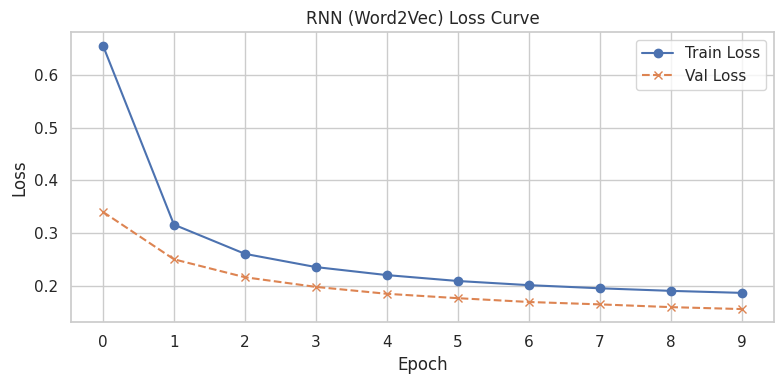


Training LSTM with Word2Vec...
Epoch 1/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - accuracy: 0.7537 - loss: 1.1946 - val_accuracy: 0.8770 - val_loss: 0.4567
Epoch 2/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.8885 - loss: 0.4078 - val_accuracy: 0.9115 - val_loss: 0.3110
Epoch 3/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - accuracy: 0.9152 - loss: 0.2935 - val_accuracy: 0.9245 - val_loss: 0.2542
Epoch 4/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - accuracy: 0.9267 - loss: 0.2443 - val_accuracy: 0.9303 - val_loss: 0.2276
Epoch 5/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.9322 - loss: 0.2207 - val_accuracy: 0.9357 - val_loss: 0.2077
Epoch 6/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.9354 - loss: 0.2069 - val_accuracy: 0.9380 - val_loss: 0.1976
Epoch 7/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.9381 - loss: 0.1967 - val_accuracy: 0.9399 - val_loss: 0.1892
Epoch 8/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - ac

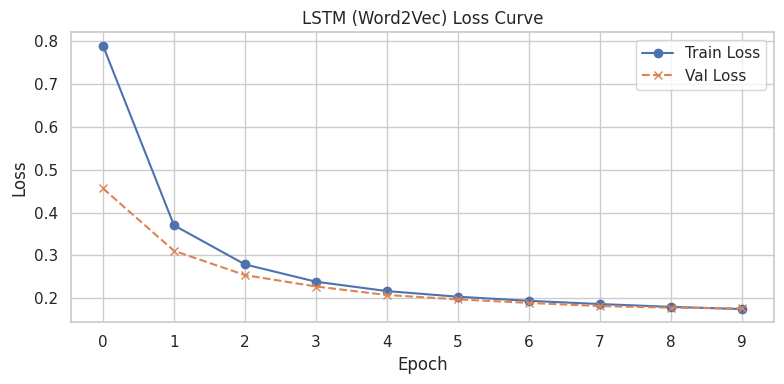


Training GRU with Word2Vec...
Epoch 1/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - accuracy: 0.7960 - loss: 0.9664 - val_accuracy: 0.9073 - val_loss: 0.3287
Epoch 2/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - accuracy: 0.9131 - loss: 0.2993 - val_accuracy: 0.9262 - val_loss: 0.2451
Epoch 3/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.9283 - loss: 0.2357 - val_accuracy: 0.9339 - val_loss: 0.2126
Epoch 4/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.9345 - loss: 0.2094 - val_accuracy: 0.9375 - val_loss: 0.1970
Epoch 5/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.9381 - loss: 0.1948 - val_accuracy: 0.9404 - val_loss: 0.1860
Epoch 6/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - accuracy: 0.9408 - loss: 0.1845 - val_accuracy: 0.9422 - val_loss: 0.1792
Epoch 7/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.9424 - loss: 0.1783 - val_accuracy: 0.9438 - val_loss: 0.1732
Epoch 8/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accu

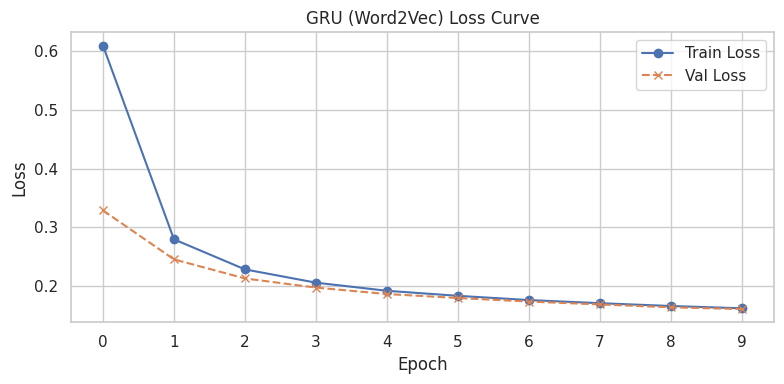


Training BILSTM with Word2Vec...
Epoch 1/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - accuracy: 0.7838 - loss: 0.9195 - val_accuracy: 0.9221 - val_loss: 0.2750
Epoch 2/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - accuracy: 0.9294 - loss: 0.2467 - val_accuracy: 0.9414 - val_loss: 0.1973
Epoch 3/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - accuracy: 0.9428 - loss: 0.1895 - val_accuracy: 0.9477 - val_loss: 0.1685
Epoch 4/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - accuracy: 0.9485 - loss: 0.1647 - val_accuracy: 0.9513 - val_loss: 0.1543
Epoch 5/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - accuracy: 0.9531 - loss: 0.1482 - val_accuracy: 0.9550 - val_loss: 0.1410
Epoch 6/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - accuracy: 0.9559 - loss: 0.1381 - val_accuracy: 0.9575 - val_loss: 0.1335
Epoch 7/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - accuracy: 0.9581 - loss: 0.1299 - val_accuracy: 0.9587 - val_loss: 0.1271
Epoch 8/10
480/480 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - 

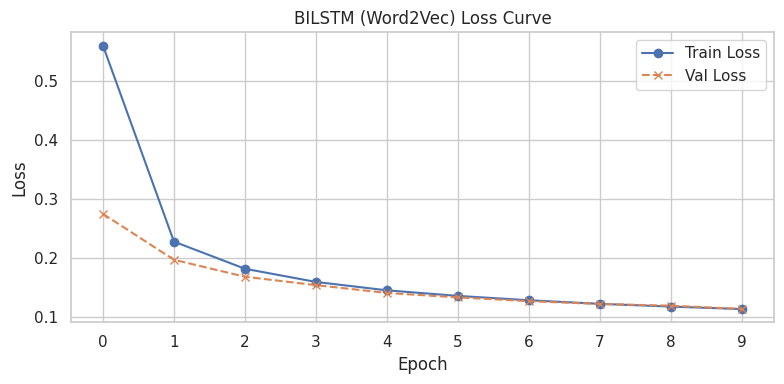

In [ ]:
results_w2v = {}
histories_w2v = {}
models_w2v = {}

params_w2v = {
    'batch_size': 32,
    'epochs': 10,
    'units': 64,
    'lr': 0.001,
    'dropout': 0.2
}

for cell in ['rnn', 'lstm', 'gru', 'bilstm']:
    print(f'\nTraining {cell.upper()} with Word2Vec...')

    model = build_model_w2v(cell_type=cell, units=params_w2v['units'], lr=params_w2v['lr'], dropout=params_w2v['dropout'])

    history = model.fit(
        X_train, y_train_cat,
        batch_size=params_w2v['batch_size'],
        epochs=params_w2v['epochs'],
        validation_split=0.2,
        verbose=1
    )

    models_w2v[cell] = model
    histories_w2v[cell] = history

    # Plot Train vs Validation Loss
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='x', linestyle='--')
    plt.title(f'{cell.upper()} (Word2Vec) Loss Curve')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.xticks(range(0, params_w2v['epochs']))
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


Evaluating RNN (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step
Accuracy: 0.8029960618283415
F1-score: 0.6553905467163468
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.50      0.01      0.02        89
           ;       0.00      0.00      0.00        20
          CC       1.00      0.99      0.99      2403
          CD       0.81      0.64      0.72      2476
          DT       0.98      0.99      0.98      9928
          EX       0.71      0.08      0.15        61
          FW       0.00      0.00      0.00         0
          IN       0.96      0.97      0.96     12229
          JJ       0.61      0.48      0.53      7783
         JJR       0.86      0.71      0.78       278
         JJS       0.96      0.52      0.68       315
         LRB       1.00      0.97      0.99        75
          MD       0.97      0.99 

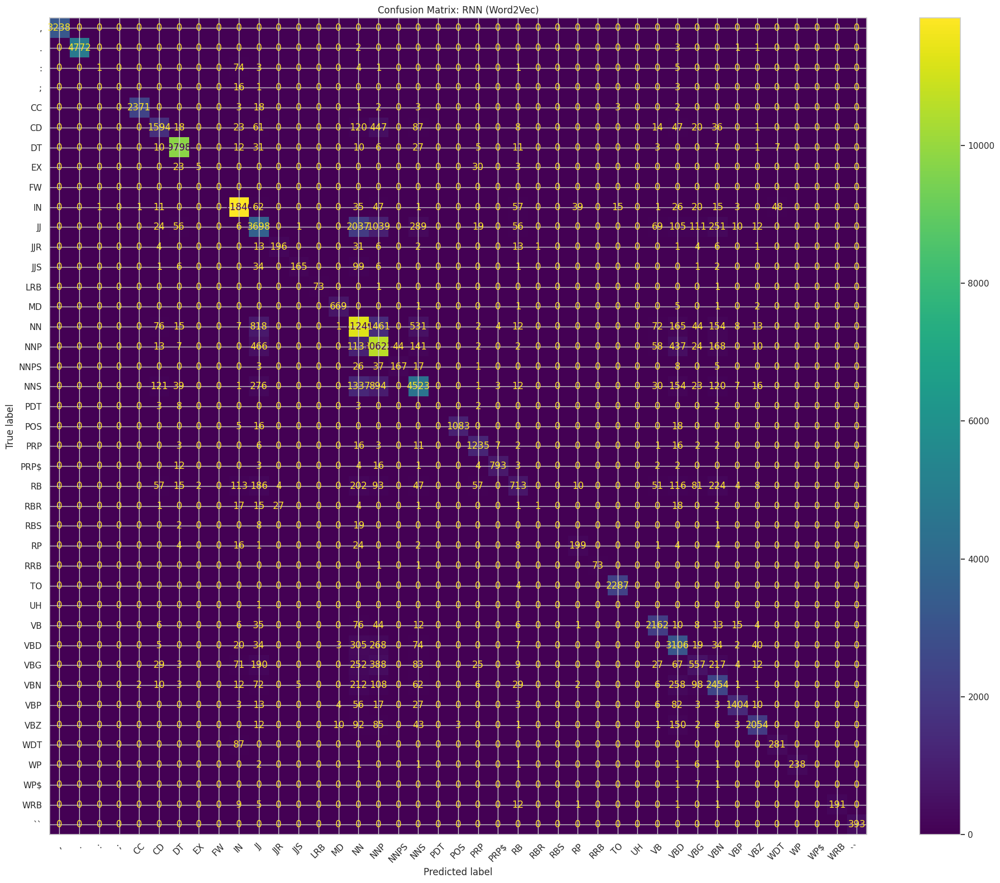


Evaluating LSTM (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Accuracy: 0.7836484824212604
F1-score: 0.6216256632329131
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.50      0.02      0.04        89
           ;       0.00      0.00      0.00        20
          CC       0.98      0.98      0.98      2403
          CD       0.70      0.65      0.68      2476
          DT       0.97      0.98      0.98      9928
          EX       0.00      0.00      0.00        61
          FW       0.00      0.00      0.00         0
          IN       0.95      0.95      0.95     12229
          JJ       0.60      0.44      0.51      7783
         JJR       0.88      0.68      0.77       278
         JJS       0.95      0.53      0.68       315
         LRB       0.88      0.80      0.84        75
          MD       0.96      0.97 

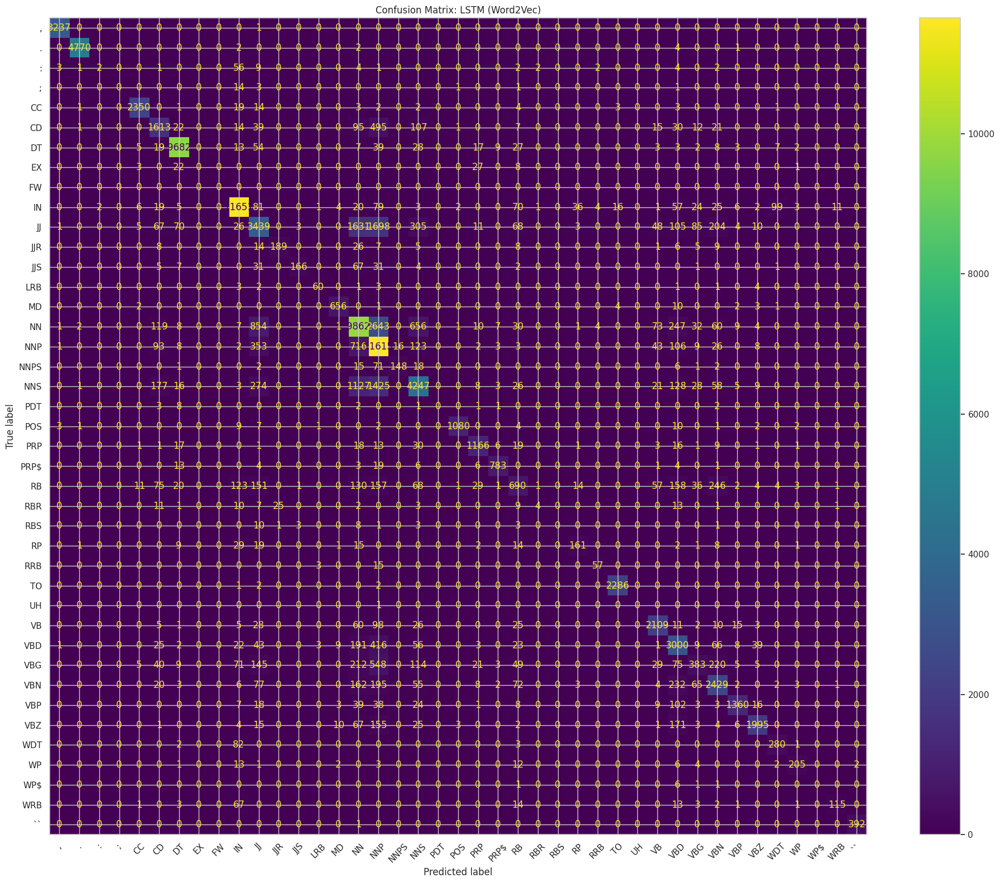


Evaluating GRU (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step
Accuracy: 0.7981329442839298
F1-score: 0.6703698321739678
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.59      0.19      0.29        89
           ;       0.00      0.00      0.00        20
          CC       0.98      0.98      0.98      2403
          CD       0.76      0.69      0.72      2476
          DT       0.97      0.98      0.98      9928
          EX       0.68      0.31      0.43        61
          FW       0.00      0.00      0.00         0
          IN       0.95      0.96      0.96     12229
          JJ       0.51      0.56      0.53      7783
         JJR       0.87      0.71      0.78       278
         JJS       0.93      0.53      0.67       315
         LRB       0.97      0.93      0.95        75
          MD       0.96      0.98  

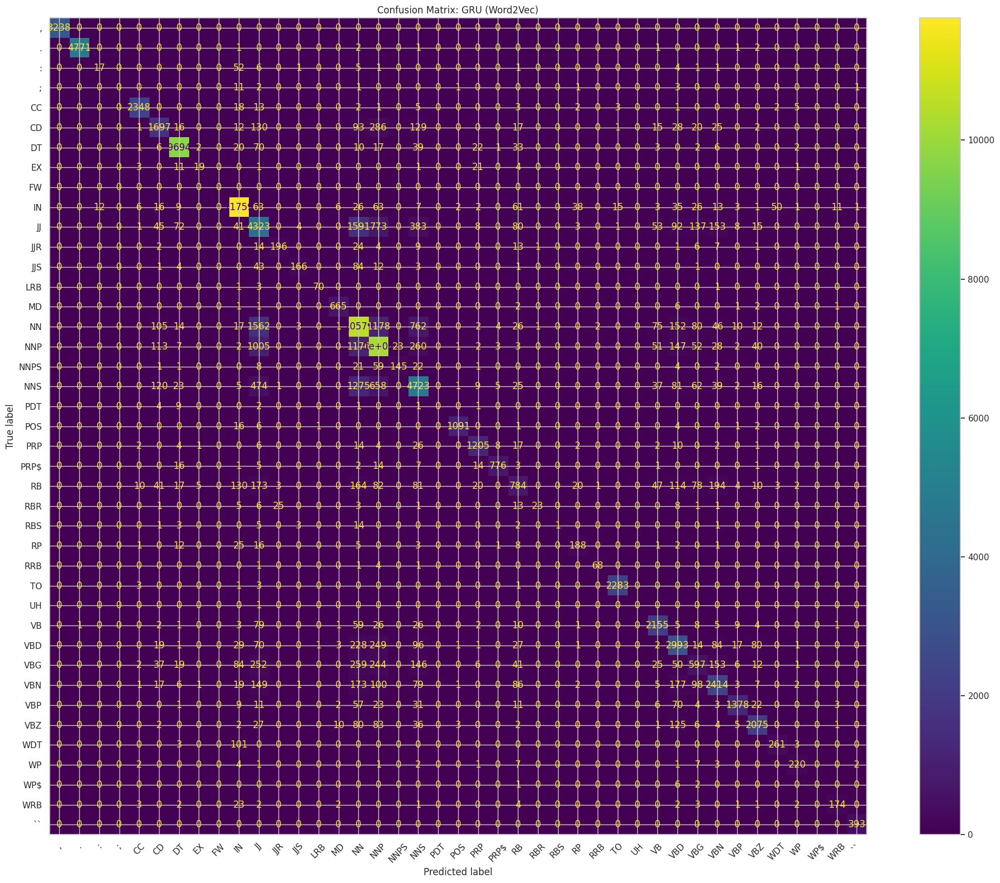


Evaluating BILSTM (Word2Vec)...
150/150 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step
Accuracy: 0.8546690696188651
F1-score: 0.7464190156741533
Classification Report:
               precision    recall  f1-score   support

           ,       1.00      1.00      1.00      3238
           .       1.00      1.00      1.00      4779
           :       0.85      0.70      0.77        89
           ;       0.00      0.00      0.00        20
          CC       0.99      0.99      0.99      2403
          CD       0.87      0.72      0.79      2476
          DT       0.99      0.98      0.99      9928
          EX       0.86      0.89      0.87        61
          FW       0.00      0.00      0.00         0
          IN       0.97      0.97      0.97     12229
          JJ       0.70      0.70      0.70      7783
         JJR       0.86      0.71      0.78       278
         JJS       0.97      0.61      0.75       315
         LRB       1.00      0.96      0.98        75
          MD       0.98      0.9

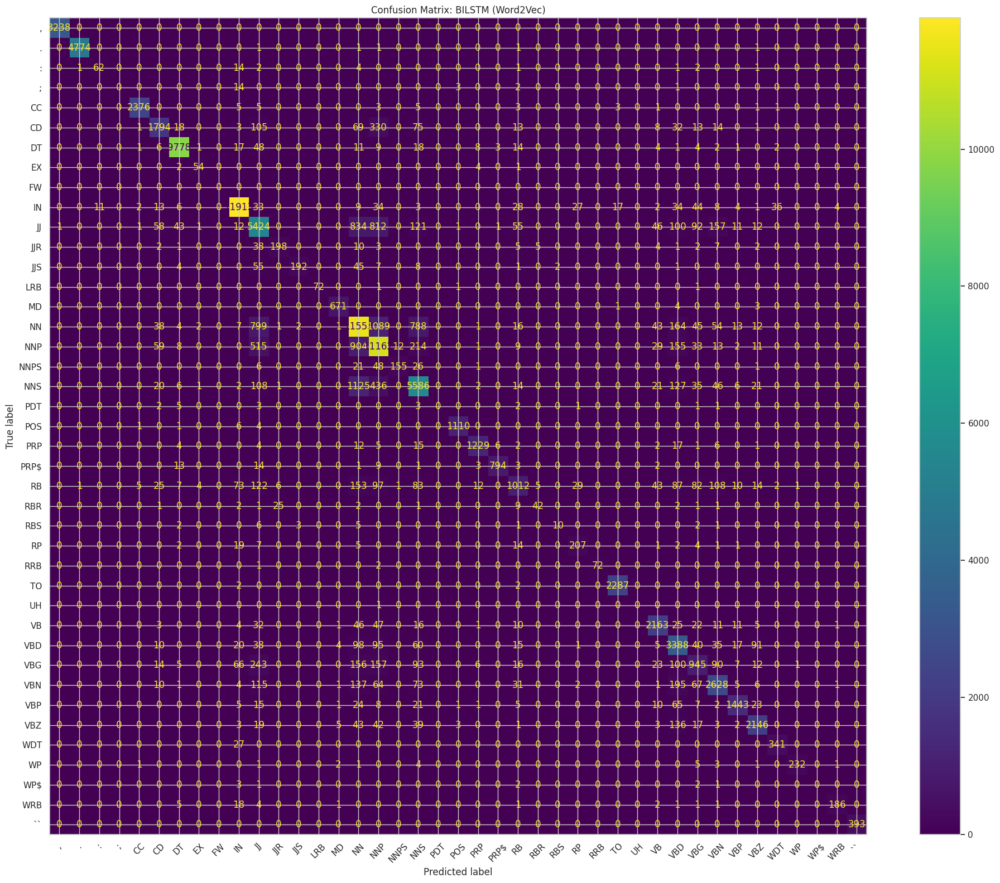

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, confusion_matrix

acc_w2v = {}
f1_w2v = {}

for cell in ['rnn', 'lstm', 'gru', 'bilstm']:
    print(f'\nEvaluating {cell.upper()} (Word2Vec)...')
    model = models_w2v[cell]
    y_pred = model.predict(X_test)
    y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
    y_true_labels = y_test.flatten()
    padding_idx = tag2idx[list(tag2idx.keys())[0]]
    mask = y_true_labels != padding_idx
    y_true_labels = y_true_labels[mask]
    y_pred_labels = y_pred_labels[mask]
    acc = accuracy_score(y_true_labels, y_pred_labels)
    f1 = f1_score(y_true_labels, y_pred_labels, average='macro')
    acc_w2v[cell] = acc
    f1_w2v[cell] = f1
    label_indices = [i for i in sorted(idx2tag.keys()) if i != padding_idx]
    target_names = [idx2tag[i] for i in label_indices]
    report = classification_report(
        y_true_labels, y_pred_labels,
        labels=label_indices,
        target_names=target_names,
        zero_division=0
    )
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=label_indices)
    print('Accuracy:', acc)
    print('F1-score:', f1)
    print('Classification Report:\n', report)
    fig, ax = plt.subplots(figsize=(20, 16), dpi=100)
    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names).plot(ax=ax, xticks_rotation=45)
    plt.title(f'Confusion Matrix: {cell.upper()} (Word2Vec)')
    plt.tight_layout()
    plt.show()

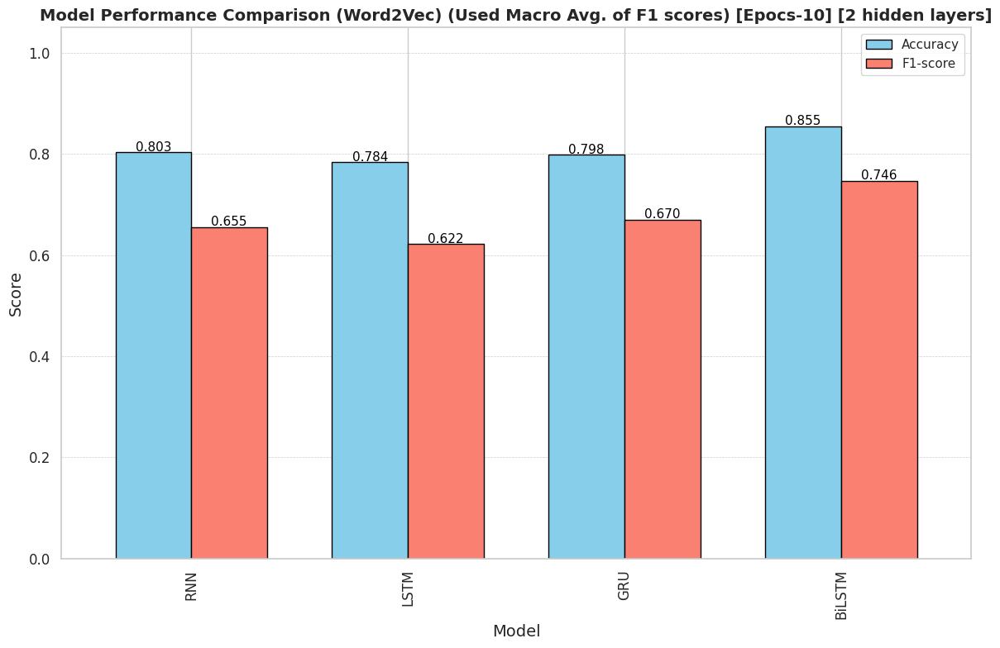

In [ ]:
import pandas as pd
import seaborn as sns

metrics_w2v = {
    'Model': ['RNN', 'LSTM', 'GRU', 'BiLSTM'],
    'Accuracy': [acc_w2v['rnn'], acc_w2v['lstm'], acc_w2v['gru'], acc_w2v['bilstm']],
    'F1-score': [f1_w2v['rnn'], f1_w2v['lstm'], f1_w2v['gru'], f1_w2v['bilstm']]
}
metrics_df_w2v = pd.DataFrame(metrics_w2v)
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(12, 8))
metrics_df_w2v.plot(
    x='Model',
    y=['Accuracy', 'F1-score'],
    kind='bar',
    ax=ax,
    width=0.7,
    color=['skyblue', 'salmon'],
    edgecolor='black'
)
ax.set_title('Model Performance Comparison (Word2Vec) (Used Macro Avg. of F1 scores) [Epocs-10] [2 hidden layers]', fontsize=14, weight='bold')
ax.set_ylabel('Score', fontsize=14)
ax.set_xlabel('Model', fontsize=14)
ax.set_ylim(0, 1.05)
ax.tick_params(axis='both', labelsize=12)
ax.yaxis.grid(True, linestyle='--', linewidth=0.5)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.3f}',
                (p.get_x() + p.get_width() / 2., height + 0.01),
                ha='center', va='center', fontsize=11, color='black')
plt.tight_layout()
plt.show()